# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

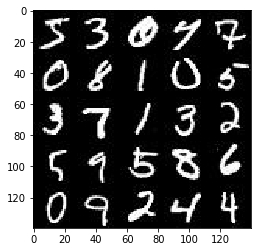

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

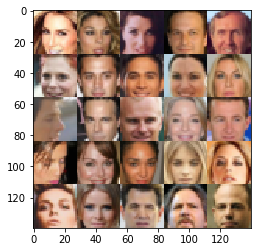

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # DONE: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    lr = tf.placeholder(tf.float32, name='learning_rate')
    
    return inputs_real, inputs_z, lr

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\traitlets\\config\\application.py", line 658, in launch_instance\n    app.start()', 'File "c:\\users\\peter\\anaconda3\\envs\\tflearn-gpu\\lib\\site-packages\\ipykernel\\kernelapp.py", line 477, in start\n    ioloop.IOLoop.instan

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
# conv2d uses xavier initializer (as the None is transformed in a new glorot_uniform_initializer after line 220 in https://github.com/tensorflow/tensorflow/blob/r1.2/tensorflow/python/ops/variable_scope.py)
dnconv = 64
dropout_rate = 0.5
def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # DONE: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28 x 28 x out_channel_dim
        #print(images.get_shape().as_list())
        
        # conv to 14, 14
        x = tf.layers.conv2d(images, dnconv*4, 5, strides=2, padding='same')
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 7, 7
        x = tf.layers.conv2d(x, dnconv*4, 5, strides=2, padding='same', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 4, 4
        x = tf.layers.conv2d(x, dnconv*8, 5, strides=2, padding='same', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # flatten
        x = tf.reshape(x, (-1, 4*4*dnconv*8))
        #print(x.get_shape().as_list())
        
        # logits and output
        logits = tf.layers.dense(x, 1)
        out = tf.sigmoid(logits)
        
        
        return out, logits
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
gnconv = 64
dropout_rate = 0.3
def generator(z, out_channel_dim, is_train=True, alpha=0.02): # I put alpha parameter to this function call
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # DONE: Implement Function
    
    # auxiliar variables
    reuse = not is_train
    
    # scope for generator
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z, 4*4*gnconv*8)
        #print(x.get_shape().as_list())
        
        # batch normalization to 4x4
        x = tf.reshape(x, (-1, 4, 4, gnconv*8))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 2x2
        #x = tf.layers.conv2d_transpose(x, gnconv*8, 5, strides=2, padding='same')
        #x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        #x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # conv to 4x4
        #x = tf.layers.conv2d_transpose(x, gnconv*8, 5, strides=2, padding='same')
        #x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        #x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())

        # conv to 7x7
        x = tf.layers.conv2d_transpose(x, gnconv*4, 4, strides=1, padding='valid')
        x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
            
        # conv to 14x14        
        x = tf.layers.conv2d_transpose(x, gnconv*2, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=is_train)
        #x = tf.layers.dropout(inputs=x, rate=dropout_rate, training=True)
        x = tf.maximum(alpha * x, x)
        #print(x.get_shape().as_list())
        
        # Output layer, 28 x 28 x out_channel_dim (3 or 1, depending on the task - faces or minst)
        logits = tf.layers.conv2d_transpose(x, out_channel_dim, 5, strides=2, padding='same')
        #print(logits.get_shape().as_list())
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
smooth = 0.1

def model_loss(input_real, input_z, out_channel_dim, alpha=0.02): # I put alpha parameter to this function call
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # DONE: Implement Function
    
    # Just for reference:
    #   discriminator(images, reuse=False, alpha=0.01)
    #   generator(z, out_channel_dim, is_train=True, alpha=0.02): # I put alpha parameter to this function call
    
    g_out = generator(input_z, out_channel_dim, alpha=alpha)
    d_out_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_out_fake, d_logits_fake = discriminator(g_out, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_real,
                                                        labels=tf.ones_like(d_out_real) * (1. - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_fake,
                                                        labels=tf.zeros_like(d_out_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
                                                        logits=d_logits_fake,
                                                        labels=tf.ones_like(d_out_fake)))

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # DONE: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
from datetime import datetime

print_every = 10
show_every = 100
n_images = 16
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # DONE: Build Model
    minput_real, minput_z, mlearning_rate = model_inputs(*data_shape[1:], z_dim)
    d_loss, g_loss = model_loss(minput_real, minput_z, data_shape[-1], alpha=0.02)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    have_i_already_reset_the_default_graph = True

    # Auxiliar variables
    steps = 0
    out_channel_dim = 3 if data_image_mode == 'RGB' else 1
    sample_z = np.random.uniform(-1, 1, size=(n_images, z_dim))

    #there is a problem redefining related to redefining a session. This is a workaround
    #(https://stackoverflow.com/questions/37934955/tensorflow-op-naming-for-consecutive-runs-in-interactive-ipython-terminal)
        
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):    
            for batch_images in get_batches(batch_size):
                # DONE: Train Model
                steps += 1
                
                # rescale from [-.5, .5] to [-1., 1.]
                batch_images = batch_images * 2

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                #_ = sess.run(net.d_opt, feed_dict={net.input_real: batch_images, net.input_z: batch_z, net.learning_rate : learning_rate})
                #_ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.learning_rate : learning_rate, net.input_real: batch_images})
                _ = sess.run(d_opt, feed_dict={minput_real: batch_images, minput_z: batch_z, mlearning_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={minput_z: batch_z, mlearning_rate: learning_rate, minput_real: batch_images})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    #train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: batch_images})
                    #train_loss_g = net.g_loss.eval({net.input_z: batch_z})
                    train_loss_d = d_loss.eval({minput_z: batch_z, minput_real: batch_images})
                    train_loss_g = g_loss.eval({minput_z: batch_z})

                    print("Timestamp {} - ".format(datetime.now().strftime('%Y%m%d-%H-%M-%S.%f')[:-3]),
                          "Epoch {}/{} - ".format(epoch_i+1, epochs),
                          "Step {} - ".format(steps),
                          "D Loss: {:.4f} -".format(train_loss_d),
                          "G Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, n_images, minput_z, out_channel_dim, data_image_mode)

            # At the end of each epoch, get the losses and print them out
            if not (steps % show_every == 0):
                train_loss_d = d_loss.eval({minput_z: batch_z, minput_real: batch_images})
                train_loss_g = g_loss.eval({minput_z: batch_z})
                print("Timestamp {} - ".format(datetime.now().strftime('%Y%m%d-%H-%M-%S.%f')[:-3]),
                      "Epoch {}/{} - ".format(epoch_i+1, epochs),
                      "Step {} - ".format(steps),
                      "D Loss: {:.4f} -".format(train_loss_d),
                      "G Loss: {:.4f}".format(train_loss_g))

                show_generator_output(sess, n_images, minput_z, out_channel_dim, data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Timestamp 20170803-13-37-12.714 -  Epoch 1/2 -  Step 10 -  D Loss: 2.3984 - G Loss: 0.3955
Timestamp 20170803-13-37-19.160 -  Epoch 1/2 -  Step 20 -  D Loss: 2.0036 - G Loss: 0.3917
Timestamp 20170803-13-37-25.607 -  Epoch 1/2 -  Step 30 -  D Loss: 1.3082 - G Loss: 1.2009
Timestamp 20170803-13-37-32.053 -  Epoch 1/2 -  Step 40 -  D Loss: 0.4783 - G Loss: 5.7945
Timestamp 20170803-13-37-38.513 -  Epoch 1/2 -  Step 50 -  D Loss: 1.6187 - G Loss: 9.0287
Timestamp 20170803-13-37-44.955 -  Epoch 1/2 -  Step 60 -  D Loss: 0.7507 - G Loss: 9.9636
Timestamp 20170803-13-37-51.415 -  Epoch 1/2 -  Step 70 -  D Loss: 0.8571 - G Loss: 1.4160
Timestamp 20170803-13-37-57.867 -  Epoch 1/2 -  Step 80 -  D Loss: 0.5624 - G Loss: 6.9854
Timestamp 20170803-13-38-04.305 -  Epoch 1/2 -  Step 90 -  D Loss: 4.1964 - G Loss: 16.2124
Timestamp 20170803-13-38-10.751 -  Epoch 1/2 -  Step 100 -  D Loss: 0.4742 - G Loss: 4.7221


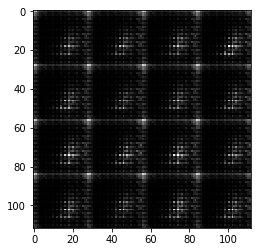

Timestamp 20170803-13-38-17.631 -  Epoch 1/2 -  Step 110 -  D Loss: 0.4149 - G Loss: 3.7713
Timestamp 20170803-13-38-24.065 -  Epoch 1/2 -  Step 120 -  D Loss: 0.8430 - G Loss: 0.9893
Timestamp 20170803-13-38-30.501 -  Epoch 1/2 -  Step 130 -  D Loss: 0.4081 - G Loss: 3.7464
Timestamp 20170803-13-38-36.938 -  Epoch 1/2 -  Step 140 -  D Loss: 0.4074 - G Loss: 3.8297
Timestamp 20170803-13-38-43.394 -  Epoch 1/2 -  Step 150 -  D Loss: 0.4791 - G Loss: 2.6736
Timestamp 20170803-13-38-49.841 -  Epoch 1/2 -  Step 160 -  D Loss: 0.3753 - G Loss: 5.3513
Timestamp 20170803-13-38-56.295 -  Epoch 1/2 -  Step 170 -  D Loss: 0.4439 - G Loss: 2.9274
Timestamp 20170803-13-39-02.751 -  Epoch 1/2 -  Step 180 -  D Loss: 3.9341 - G Loss: 18.9073
Timestamp 20170803-13-39-09.195 -  Epoch 1/2 -  Step 190 -  D Loss: 0.5622 - G Loss: 3.3179
Timestamp 20170803-13-39-15.629 -  Epoch 1/2 -  Step 200 -  D Loss: 0.8593 - G Loss: 1.1193


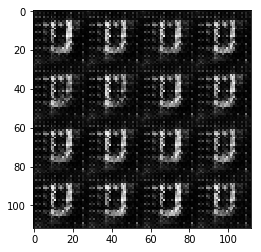

Timestamp 20170803-13-39-22.604 -  Epoch 1/2 -  Step 210 -  D Loss: 0.4969 - G Loss: 4.3600
Timestamp 20170803-13-39-29.059 -  Epoch 1/2 -  Step 220 -  D Loss: 0.3727 - G Loss: 5.0251
Timestamp 20170803-13-39-35.509 -  Epoch 1/2 -  Step 230 -  D Loss: 0.3968 - G Loss: 4.3758
Timestamp 20170803-13-39-41.948 -  Epoch 1/2 -  Step 240 -  D Loss: 0.6381 - G Loss: 7.9306
Timestamp 20170803-13-39-48.385 -  Epoch 1/2 -  Step 250 -  D Loss: 1.3439 - G Loss: 0.8749
Timestamp 20170803-13-39-54.827 -  Epoch 1/2 -  Step 260 -  D Loss: 0.4695 - G Loss: 6.5035
Timestamp 20170803-13-40-01.264 -  Epoch 1/2 -  Step 270 -  D Loss: 0.4408 - G Loss: 3.3116
Timestamp 20170803-13-40-07.746 -  Epoch 1/2 -  Step 280 -  D Loss: 0.9901 - G Loss: 3.3068
Timestamp 20170803-13-40-14.194 -  Epoch 1/2 -  Step 290 -  D Loss: 0.6678 - G Loss: 2.5287
Timestamp 20170803-13-40-20.664 -  Epoch 1/2 -  Step 300 -  D Loss: 0.6880 - G Loss: 2.1238


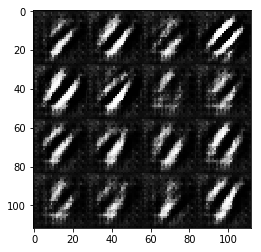

Timestamp 20170803-13-40-27.557 -  Epoch 1/2 -  Step 310 -  D Loss: 0.8168 - G Loss: 1.2462
Timestamp 20170803-13-40-34.015 -  Epoch 1/2 -  Step 320 -  D Loss: 0.6451 - G Loss: 2.1765
Timestamp 20170803-13-40-40.459 -  Epoch 1/2 -  Step 330 -  D Loss: 0.4795 - G Loss: 2.7082
Timestamp 20170803-13-40-46.910 -  Epoch 1/2 -  Step 340 -  D Loss: 0.5706 - G Loss: 2.8380
Timestamp 20170803-13-40-53.337 -  Epoch 1/2 -  Step 350 -  D Loss: 0.6332 - G Loss: 1.6549
Timestamp 20170803-13-40-59.785 -  Epoch 1/2 -  Step 360 -  D Loss: 0.5378 - G Loss: 2.4754
Timestamp 20170803-13-41-06.244 -  Epoch 1/2 -  Step 370 -  D Loss: 0.7078 - G Loss: 1.6481
Timestamp 20170803-13-41-12.699 -  Epoch 1/2 -  Step 380 -  D Loss: 0.6245 - G Loss: 1.4322
Timestamp 20170803-13-41-19.147 -  Epoch 1/2 -  Step 390 -  D Loss: 1.4644 - G Loss: 5.9962
Timestamp 20170803-13-41-25.590 -  Epoch 1/2 -  Step 400 -  D Loss: 0.7286 - G Loss: 3.5056


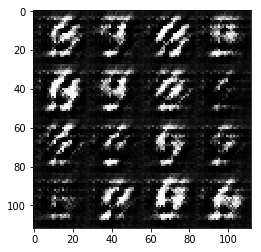

Timestamp 20170803-13-41-32.482 -  Epoch 1/2 -  Step 410 -  D Loss: 1.6872 - G Loss: 6.3304
Timestamp 20170803-13-41-38.955 -  Epoch 1/2 -  Step 420 -  D Loss: 1.1298 - G Loss: 1.4790
Timestamp 20170803-13-41-45.392 -  Epoch 1/2 -  Step 430 -  D Loss: 0.8602 - G Loss: 1.6927
Timestamp 20170803-13-41-51.832 -  Epoch 1/2 -  Step 440 -  D Loss: 0.4969 - G Loss: 3.7287
Timestamp 20170803-13-41-58.265 -  Epoch 1/2 -  Step 450 -  D Loss: 0.9349 - G Loss: 0.8860
Timestamp 20170803-13-42-04.705 -  Epoch 1/2 -  Step 460 -  D Loss: 0.6057 - G Loss: 3.1891
Timestamp 20170803-13-42-11.142 -  Epoch 1/2 -  Step 470 -  D Loss: 0.3885 - G Loss: 4.4097
Timestamp 20170803-13-42-17.567 -  Epoch 1/2 -  Step 480 -  D Loss: 0.7191 - G Loss: 1.6954
Timestamp 20170803-13-42-24.032 -  Epoch 1/2 -  Step 490 -  D Loss: 1.1989 - G Loss: 0.6954
Timestamp 20170803-13-42-30.490 -  Epoch 1/2 -  Step 500 -  D Loss: 0.5477 - G Loss: 2.3064


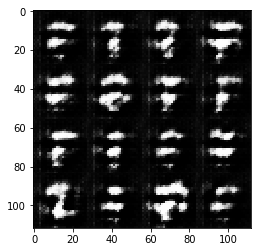

Timestamp 20170803-13-42-37.410 -  Epoch 1/2 -  Step 510 -  D Loss: 1.2015 - G Loss: 0.8524
Timestamp 20170803-13-42-43.853 -  Epoch 1/2 -  Step 520 -  D Loss: 1.0704 - G Loss: 1.3059
Timestamp 20170803-13-42-50.298 -  Epoch 1/2 -  Step 530 -  D Loss: 0.9004 - G Loss: 2.1793
Timestamp 20170803-13-42-56.731 -  Epoch 1/2 -  Step 540 -  D Loss: 0.6984 - G Loss: 1.6341
Timestamp 20170803-13-43-03.173 -  Epoch 1/2 -  Step 550 -  D Loss: 0.5525 - G Loss: 2.9731
Timestamp 20170803-13-43-09.628 -  Epoch 1/2 -  Step 560 -  D Loss: 0.8275 - G Loss: 2.1292
Timestamp 20170803-13-43-16.101 -  Epoch 1/2 -  Step 570 -  D Loss: 0.8113 - G Loss: 1.7039
Timestamp 20170803-13-43-22.542 -  Epoch 1/2 -  Step 580 -  D Loss: 1.3965 - G Loss: 0.5940
Timestamp 20170803-13-43-28.974 -  Epoch 1/2 -  Step 590 -  D Loss: 1.0736 - G Loss: 1.4488
Timestamp 20170803-13-43-35.415 -  Epoch 1/2 -  Step 600 -  D Loss: 0.7686 - G Loss: 1.8315


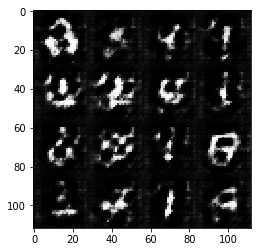

Timestamp 20170803-13-43-42.317 -  Epoch 1/2 -  Step 610 -  D Loss: 0.8196 - G Loss: 1.6491
Timestamp 20170803-13-43-48.749 -  Epoch 1/2 -  Step 620 -  D Loss: 0.9071 - G Loss: 1.2506
Timestamp 20170803-13-43-55.196 -  Epoch 1/2 -  Step 630 -  D Loss: 0.9118 - G Loss: 1.3502
Timestamp 20170803-13-44-01.688 -  Epoch 1/2 -  Step 640 -  D Loss: 0.9463 - G Loss: 1.1821
Timestamp 20170803-13-44-08.142 -  Epoch 1/2 -  Step 650 -  D Loss: 2.0936 - G Loss: 0.3833
Timestamp 20170803-13-44-14.591 -  Epoch 1/2 -  Step 660 -  D Loss: 0.9910 - G Loss: 1.1911
Timestamp 20170803-13-44-21.043 -  Epoch 1/2 -  Step 670 -  D Loss: 1.1998 - G Loss: 1.5207
Timestamp 20170803-13-44-27.496 -  Epoch 1/2 -  Step 680 -  D Loss: 1.2359 - G Loss: 1.9031
Timestamp 20170803-13-44-33.927 -  Epoch 1/2 -  Step 690 -  D Loss: 0.7680 - G Loss: 1.3164
Timestamp 20170803-13-44-40.388 -  Epoch 1/2 -  Step 700 -  D Loss: 1.5342 - G Loss: 0.7664


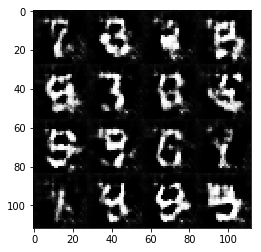

Timestamp 20170803-13-44-47.376 -  Epoch 1/2 -  Step 710 -  D Loss: 0.8925 - G Loss: 1.8714
Timestamp 20170803-13-44-53.834 -  Epoch 1/2 -  Step 720 -  D Loss: 1.3908 - G Loss: 0.5481
Timestamp 20170803-13-45-00.290 -  Epoch 1/2 -  Step 730 -  D Loss: 1.1054 - G Loss: 2.0825
Timestamp 20170803-13-45-06.738 -  Epoch 1/2 -  Step 740 -  D Loss: 0.8892 - G Loss: 1.6873
Timestamp 20170803-13-45-13.192 -  Epoch 1/2 -  Step 750 -  D Loss: 1.1343 - G Loss: 0.8426
Timestamp 20170803-13-45-19.654 -  Epoch 1/2 -  Step 760 -  D Loss: 1.0608 - G Loss: 1.0859
Timestamp 20170803-13-45-26.115 -  Epoch 1/2 -  Step 770 -  D Loss: 1.0786 - G Loss: 1.0348
Timestamp 20170803-13-45-32.585 -  Epoch 1/2 -  Step 780 -  D Loss: 1.0701 - G Loss: 1.9488
Timestamp 20170803-13-45-39.050 -  Epoch 1/2 -  Step 790 -  D Loss: 0.8396 - G Loss: 2.8153
Timestamp 20170803-13-45-45.554 -  Epoch 1/2 -  Step 800 -  D Loss: 0.8290 - G Loss: 1.6854


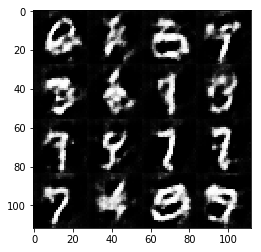

Timestamp 20170803-13-45-52.646 -  Epoch 1/2 -  Step 810 -  D Loss: 0.9388 - G Loss: 1.7790
Timestamp 20170803-13-45-59.118 -  Epoch 1/2 -  Step 820 -  D Loss: 1.1514 - G Loss: 1.6329
Timestamp 20170803-13-46-05.594 -  Epoch 1/2 -  Step 830 -  D Loss: 0.7305 - G Loss: 1.4218
Timestamp 20170803-13-46-12.029 -  Epoch 1/2 -  Step 840 -  D Loss: 0.8343 - G Loss: 1.9901
Timestamp 20170803-13-46-18.481 -  Epoch 1/2 -  Step 850 -  D Loss: 1.2885 - G Loss: 1.5877
Timestamp 20170803-13-46-24.896 -  Epoch 1/2 -  Step 860 -  D Loss: 1.1684 - G Loss: 3.0659
Timestamp 20170803-13-46-31.348 -  Epoch 1/2 -  Step 870 -  D Loss: 1.6954 - G Loss: 0.4576
Timestamp 20170803-13-46-37.806 -  Epoch 1/2 -  Step 880 -  D Loss: 1.1758 - G Loss: 1.0672
Timestamp 20170803-13-46-44.263 -  Epoch 1/2 -  Step 890 -  D Loss: 0.9414 - G Loss: 1.4063
Timestamp 20170803-13-46-50.702 -  Epoch 1/2 -  Step 900 -  D Loss: 0.8669 - G Loss: 0.9643


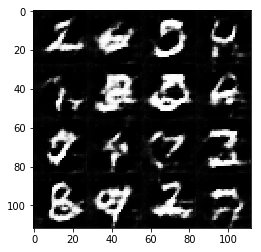

Timestamp 20170803-13-46-57.818 -  Epoch 1/2 -  Step 910 -  D Loss: 0.8984 - G Loss: 1.4442
Timestamp 20170803-13-47-04.271 -  Epoch 1/2 -  Step 920 -  D Loss: 1.1241 - G Loss: 0.9155
Timestamp 20170803-13-47-10.722 -  Epoch 1/2 -  Step 930 -  D Loss: 1.0171 - G Loss: 1.2323
Timestamp 20170803-13-47-17.181 -  Epoch 1/2 -  Step 940 -  D Loss: 1.1324 - G Loss: 1.6525
Timestamp 20170803-13-47-23.621 -  Epoch 1/2 -  Step 950 -  D Loss: 0.8782 - G Loss: 1.7868
Timestamp 20170803-13-47-30.071 -  Epoch 1/2 -  Step 960 -  D Loss: 1.2830 - G Loss: 1.9363
Timestamp 20170803-13-47-36.511 -  Epoch 1/2 -  Step 970 -  D Loss: 1.0701 - G Loss: 0.9209
Timestamp 20170803-13-47-42.945 -  Epoch 1/2 -  Step 980 -  D Loss: 0.6883 - G Loss: 1.2851
Timestamp 20170803-13-47-49.379 -  Epoch 1/2 -  Step 990 -  D Loss: 0.8408 - G Loss: 1.5284
Timestamp 20170803-13-47-55.823 -  Epoch 1/2 -  Step 1000 -  D Loss: 0.9395 - G Loss: 1.5306


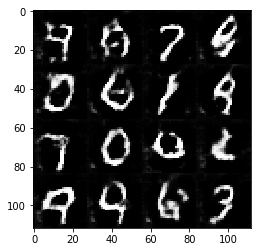

Timestamp 20170803-13-48-02.751 -  Epoch 1/2 -  Step 1010 -  D Loss: 0.7782 - G Loss: 2.0756
Timestamp 20170803-13-48-09.178 -  Epoch 1/2 -  Step 1020 -  D Loss: 1.2180 - G Loss: 1.4120
Timestamp 20170803-13-48-15.643 -  Epoch 1/2 -  Step 1030 -  D Loss: 1.3914 - G Loss: 0.5412
Timestamp 20170803-13-48-22.071 -  Epoch 1/2 -  Step 1040 -  D Loss: 0.8599 - G Loss: 1.8999
Timestamp 20170803-13-48-28.520 -  Epoch 1/2 -  Step 1050 -  D Loss: 0.8553 - G Loss: 1.0341
Timestamp 20170803-13-48-34.952 -  Epoch 1/2 -  Step 1060 -  D Loss: 0.9291 - G Loss: 1.6412
Timestamp 20170803-13-48-41.387 -  Epoch 1/2 -  Step 1070 -  D Loss: 1.2060 - G Loss: 0.8073
Timestamp 20170803-13-48-47.811 -  Epoch 1/2 -  Step 1080 -  D Loss: 1.3716 - G Loss: 0.8330
Timestamp 20170803-13-48-54.253 -  Epoch 1/2 -  Step 1090 -  D Loss: 1.1038 - G Loss: 0.6943
Timestamp 20170803-13-49-00.693 -  Epoch 1/2 -  Step 1100 -  D Loss: 0.9963 - G Loss: 0.8804


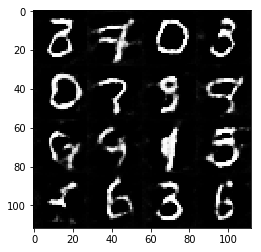

Timestamp 20170803-13-49-07.591 -  Epoch 1/2 -  Step 1110 -  D Loss: 1.1698 - G Loss: 0.9987
Timestamp 20170803-13-49-14.033 -  Epoch 1/2 -  Step 1120 -  D Loss: 0.8694 - G Loss: 1.9706
Timestamp 20170803-13-49-20.479 -  Epoch 1/2 -  Step 1130 -  D Loss: 0.9877 - G Loss: 1.7037
Timestamp 20170803-13-49-26.905 -  Epoch 1/2 -  Step 1140 -  D Loss: 0.8294 - G Loss: 2.0049
Timestamp 20170803-13-49-33.348 -  Epoch 1/2 -  Step 1150 -  D Loss: 1.3383 - G Loss: 0.6526
Timestamp 20170803-13-49-40.147 -  Epoch 1/2 -  Step 1160 -  D Loss: 0.6997 - G Loss: 1.7623
Timestamp 20170803-13-49-46.658 -  Epoch 1/2 -  Step 1170 -  D Loss: 0.8038 - G Loss: 1.8243
Timestamp 20170803-13-49-53.265 -  Epoch 1/2 -  Step 1180 -  D Loss: 0.7727 - G Loss: 1.8252
Timestamp 20170803-13-49-59.895 -  Epoch 1/2 -  Step 1190 -  D Loss: 1.1814 - G Loss: 0.9666
Timestamp 20170803-13-50-06.463 -  Epoch 1/2 -  Step 1200 -  D Loss: 0.8530 - G Loss: 1.2634


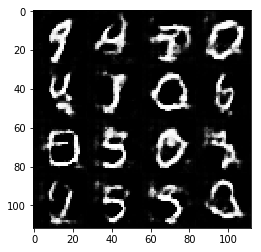

Timestamp 20170803-13-50-13.465 -  Epoch 1/2 -  Step 1210 -  D Loss: 0.9300 - G Loss: 1.6764
Timestamp 20170803-13-50-20.061 -  Epoch 1/2 -  Step 1220 -  D Loss: 1.0053 - G Loss: 0.8944
Timestamp 20170803-13-50-26.562 -  Epoch 1/2 -  Step 1230 -  D Loss: 0.8780 - G Loss: 1.6187
Timestamp 20170803-13-50-33.201 -  Epoch 1/2 -  Step 1240 -  D Loss: 0.9566 - G Loss: 1.6890
Timestamp 20170803-13-50-39.717 -  Epoch 1/2 -  Step 1250 -  D Loss: 1.0900 - G Loss: 2.0369
Timestamp 20170803-13-50-46.323 -  Epoch 1/2 -  Step 1260 -  D Loss: 0.8216 - G Loss: 1.8991
Timestamp 20170803-13-50-52.970 -  Epoch 1/2 -  Step 1270 -  D Loss: 0.9671 - G Loss: 1.3462
Timestamp 20170803-13-50-59.619 -  Epoch 1/2 -  Step 1280 -  D Loss: 0.9397 - G Loss: 1.4619
Timestamp 20170803-13-51-06.313 -  Epoch 1/2 -  Step 1290 -  D Loss: 1.0030 - G Loss: 1.7789
Timestamp 20170803-13-51-12.971 -  Epoch 1/2 -  Step 1300 -  D Loss: 1.1953 - G Loss: 0.6574


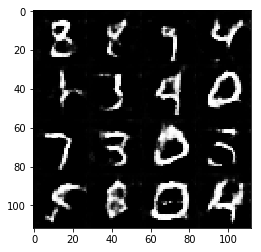

Timestamp 20170803-13-51-20.117 -  Epoch 1/2 -  Step 1310 -  D Loss: 0.6996 - G Loss: 1.4826
Timestamp 20170803-13-51-26.827 -  Epoch 1/2 -  Step 1320 -  D Loss: 0.9487 - G Loss: 1.2503
Timestamp 20170803-13-51-33.584 -  Epoch 1/2 -  Step 1330 -  D Loss: 1.1873 - G Loss: 2.5104
Timestamp 20170803-13-51-40.229 -  Epoch 1/2 -  Step 1340 -  D Loss: 1.0666 - G Loss: 1.0907
Timestamp 20170803-13-51-46.929 -  Epoch 1/2 -  Step 1350 -  D Loss: 0.8403 - G Loss: 1.8535
Timestamp 20170803-13-51-53.443 -  Epoch 1/2 -  Step 1360 -  D Loss: 0.7378 - G Loss: 1.1600
Timestamp 20170803-13-52-00.132 -  Epoch 1/2 -  Step 1370 -  D Loss: 1.1744 - G Loss: 0.9841
Timestamp 20170803-13-52-06.752 -  Epoch 1/2 -  Step 1380 -  D Loss: 1.2011 - G Loss: 0.7986
Timestamp 20170803-13-52-13.286 -  Epoch 1/2 -  Step 1390 -  D Loss: 0.8213 - G Loss: 0.9923
Timestamp 20170803-13-52-19.840 -  Epoch 1/2 -  Step 1400 -  D Loss: 0.9676 - G Loss: 2.2492


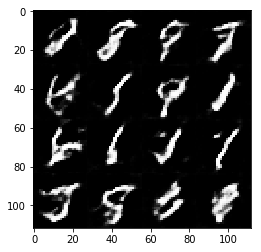

Timestamp 20170803-13-52-26.868 -  Epoch 1/2 -  Step 1410 -  D Loss: 0.6220 - G Loss: 2.2118
Timestamp 20170803-13-52-33.543 -  Epoch 1/2 -  Step 1420 -  D Loss: 0.9348 - G Loss: 1.0371
Timestamp 20170803-13-52-40.200 -  Epoch 1/2 -  Step 1430 -  D Loss: 1.0011 - G Loss: 1.5207
Timestamp 20170803-13-52-46.730 -  Epoch 1/2 -  Step 1440 -  D Loss: 0.8361 - G Loss: 1.5563
Timestamp 20170803-13-52-53.222 -  Epoch 1/2 -  Step 1450 -  D Loss: 1.1824 - G Loss: 1.2189
Timestamp 20170803-13-52-59.843 -  Epoch 1/2 -  Step 1460 -  D Loss: 0.8889 - G Loss: 1.5709
Timestamp 20170803-13-53-06.358 -  Epoch 1/2 -  Step 1470 -  D Loss: 0.9656 - G Loss: 0.7811
Timestamp 20170803-13-53-12.975 -  Epoch 1/2 -  Step 1480 -  D Loss: 1.0561 - G Loss: 1.0125
Timestamp 20170803-13-53-19.488 -  Epoch 1/2 -  Step 1490 -  D Loss: 0.7808 - G Loss: 2.1202
Timestamp 20170803-13-53-26.000 -  Epoch 1/2 -  Step 1500 -  D Loss: 0.9751 - G Loss: 0.8917


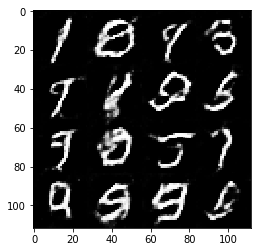

Timestamp 20170803-13-53-33.012 -  Epoch 1/2 -  Step 1510 -  D Loss: 1.2278 - G Loss: 0.7556
Timestamp 20170803-13-53-39.565 -  Epoch 1/2 -  Step 1520 -  D Loss: 0.9978 - G Loss: 2.1309
Timestamp 20170803-13-53-46.077 -  Epoch 1/2 -  Step 1530 -  D Loss: 0.8779 - G Loss: 1.2544
Timestamp 20170803-13-53-52.621 -  Epoch 1/2 -  Step 1540 -  D Loss: 0.7851 - G Loss: 2.2079
Timestamp 20170803-13-53-59.170 -  Epoch 1/2 -  Step 1550 -  D Loss: 1.2772 - G Loss: 0.7639
Timestamp 20170803-13-54-05.702 -  Epoch 1/2 -  Step 1560 -  D Loss: 0.9732 - G Loss: 1.4896
Timestamp 20170803-13-54-12.247 -  Epoch 1/2 -  Step 1570 -  D Loss: 0.9815 - G Loss: 1.3772
Timestamp 20170803-13-54-18.856 -  Epoch 1/2 -  Step 1580 -  D Loss: 0.8770 - G Loss: 1.5283
Timestamp 20170803-13-54-25.384 -  Epoch 1/2 -  Step 1590 -  D Loss: 1.5152 - G Loss: 2.8241
Timestamp 20170803-13-54-31.945 -  Epoch 1/2 -  Step 1600 -  D Loss: 1.0960 - G Loss: 0.8659


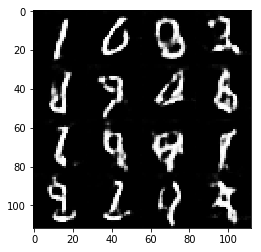

Timestamp 20170803-13-54-38.977 -  Epoch 1/2 -  Step 1610 -  D Loss: 0.6795 - G Loss: 2.2506
Timestamp 20170803-13-54-45.581 -  Epoch 1/2 -  Step 1620 -  D Loss: 1.0169 - G Loss: 1.2606
Timestamp 20170803-13-54-52.184 -  Epoch 1/2 -  Step 1630 -  D Loss: 0.8979 - G Loss: 1.5370
Timestamp 20170803-13-54-58.768 -  Epoch 1/2 -  Step 1640 -  D Loss: 0.8269 - G Loss: 1.2834
Timestamp 20170803-13-55-05.324 -  Epoch 1/2 -  Step 1650 -  D Loss: 0.9208 - G Loss: 1.5932
Timestamp 20170803-13-55-11.877 -  Epoch 1/2 -  Step 1660 -  D Loss: 1.0956 - G Loss: 0.8643
Timestamp 20170803-13-55-18.401 -  Epoch 1/2 -  Step 1670 -  D Loss: 0.7974 - G Loss: 1.8093
Timestamp 20170803-13-55-25.011 -  Epoch 1/2 -  Step 1680 -  D Loss: 1.5444 - G Loss: 0.4497
Timestamp 20170803-13-55-31.497 -  Epoch 1/2 -  Step 1690 -  D Loss: 1.2500 - G Loss: 0.9318
Timestamp 20170803-13-55-38.019 -  Epoch 1/2 -  Step 1700 -  D Loss: 1.0150 - G Loss: 0.9430


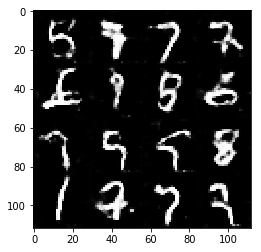

Timestamp 20170803-13-55-45.082 -  Epoch 1/2 -  Step 1710 -  D Loss: 0.7552 - G Loss: 1.5124
Timestamp 20170803-13-55-51.697 -  Epoch 1/2 -  Step 1720 -  D Loss: 0.9589 - G Loss: 1.2589
Timestamp 20170803-13-55-58.441 -  Epoch 1/2 -  Step 1730 -  D Loss: 0.7824 - G Loss: 1.7796
Timestamp 20170803-13-56-04.985 -  Epoch 1/2 -  Step 1740 -  D Loss: 1.2170 - G Loss: 0.7422
Timestamp 20170803-13-56-11.501 -  Epoch 1/2 -  Step 1750 -  D Loss: 1.2015 - G Loss: 0.7193
Timestamp 20170803-13-56-18.146 -  Epoch 1/2 -  Step 1760 -  D Loss: 1.0988 - G Loss: 1.2819
Timestamp 20170803-13-56-24.686 -  Epoch 1/2 -  Step 1770 -  D Loss: 0.8246 - G Loss: 1.6496
Timestamp 20170803-13-56-31.402 -  Epoch 1/2 -  Step 1780 -  D Loss: 0.8351 - G Loss: 1.7562
Timestamp 20170803-13-56-37.937 -  Epoch 1/2 -  Step 1790 -  D Loss: 0.8004 - G Loss: 1.6140
Timestamp 20170803-13-56-44.562 -  Epoch 1/2 -  Step 1800 -  D Loss: 0.8012 - G Loss: 1.5630


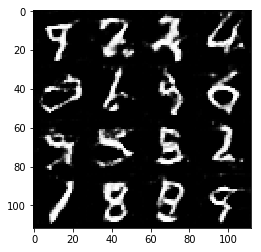

Timestamp 20170803-13-56-51.567 -  Epoch 1/2 -  Step 1810 -  D Loss: 0.8496 - G Loss: 1.3531
Timestamp 20170803-13-56-58.253 -  Epoch 1/2 -  Step 1820 -  D Loss: 0.8307 - G Loss: 1.0973
Timestamp 20170803-13-57-04.787 -  Epoch 1/2 -  Step 1830 -  D Loss: 1.2025 - G Loss: 0.8239
Timestamp 20170803-13-57-11.380 -  Epoch 1/2 -  Step 1840 -  D Loss: 1.0067 - G Loss: 0.9958
Timestamp 20170803-13-57-17.909 -  Epoch 1/2 -  Step 1850 -  D Loss: 1.2242 - G Loss: 0.7793
Timestamp 20170803-13-57-24.501 -  Epoch 1/2 -  Step 1860 -  D Loss: 1.4893 - G Loss: 0.4619
Timestamp 20170803-13-57-31.111 -  Epoch 1/2 -  Step 1870 -  D Loss: 1.1415 - G Loss: 1.6889
Timestamp 20170803-13-57-37.622 -  Epoch 1/2 -  Step 1880 -  D Loss: 0.9286 - G Loss: 1.9321
Timestamp 20170803-13-57-44.250 -  Epoch 1/2 -  Step 1890 -  D Loss: 0.8731 - G Loss: 1.2881
Timestamp 20170803-13-57-50.798 -  Epoch 1/2 -  Step 1900 -  D Loss: 0.7133 - G Loss: 1.7154


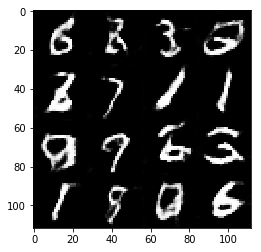

Timestamp 20170803-13-57-57.817 -  Epoch 1/2 -  Step 1910 -  D Loss: 0.6926 - G Loss: 2.2603
Timestamp 20170803-13-58-04.493 -  Epoch 1/2 -  Step 1920 -  D Loss: 0.6928 - G Loss: 2.2827
Timestamp 20170803-13-58-11.083 -  Epoch 1/2 -  Step 1930 -  D Loss: 0.7075 - G Loss: 1.9719
Timestamp 20170803-13-58-17.675 -  Epoch 1/2 -  Step 1940 -  D Loss: 1.3300 - G Loss: 0.4511
Timestamp 20170803-13-58-24.316 -  Epoch 1/2 -  Step 1950 -  D Loss: 0.9765 - G Loss: 1.0057
Timestamp 20170803-13-58-31.152 -  Epoch 1/2 -  Step 1960 -  D Loss: 1.0118 - G Loss: 1.3832
Timestamp 20170803-13-58-37.933 -  Epoch 1/2 -  Step 1970 -  D Loss: 0.8056 - G Loss: 1.3881
Timestamp 20170803-13-58-44.695 -  Epoch 1/2 -  Step 1980 -  D Loss: 1.0131 - G Loss: 1.2913
Timestamp 20170803-13-58-51.556 -  Epoch 1/2 -  Step 1990 -  D Loss: 0.7468 - G Loss: 1.7215
Timestamp 20170803-13-58-58.383 -  Epoch 1/2 -  Step 2000 -  D Loss: 0.9904 - G Loss: 1.1893


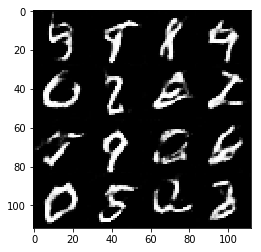

Timestamp 20170803-13-59-05.548 -  Epoch 1/2 -  Step 2010 -  D Loss: 0.7425 - G Loss: 1.5793
Timestamp 20170803-13-59-12.335 -  Epoch 1/2 -  Step 2020 -  D Loss: 0.7671 - G Loss: 1.4902
Timestamp 20170803-13-59-18.966 -  Epoch 1/2 -  Step 2030 -  D Loss: 0.7629 - G Loss: 1.6821
Timestamp 20170803-13-59-25.644 -  Epoch 1/2 -  Step 2040 -  D Loss: 0.8556 - G Loss: 1.0686
Timestamp 20170803-13-59-32.387 -  Epoch 1/2 -  Step 2050 -  D Loss: 1.0891 - G Loss: 0.8434
Timestamp 20170803-13-59-39.045 -  Epoch 1/2 -  Step 2060 -  D Loss: 0.8349 - G Loss: 1.8565
Timestamp 20170803-13-59-45.844 -  Epoch 1/2 -  Step 2070 -  D Loss: 0.8693 - G Loss: 1.1197
Timestamp 20170803-13-59-52.774 -  Epoch 1/2 -  Step 2080 -  D Loss: 1.7435 - G Loss: 0.5318
Timestamp 20170803-13-59-59.593 -  Epoch 1/2 -  Step 2090 -  D Loss: 0.8835 - G Loss: 1.6474
Timestamp 20170803-14-00-06.493 -  Epoch 1/2 -  Step 2100 -  D Loss: 0.8797 - G Loss: 1.1734


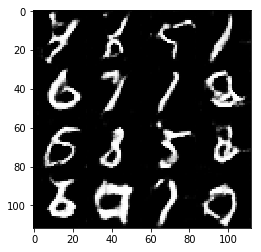

Timestamp 20170803-14-00-13.934 -  Epoch 1/2 -  Step 2110 -  D Loss: 0.9268 - G Loss: 0.9987
Timestamp 20170803-14-00-20.801 -  Epoch 1/2 -  Step 2120 -  D Loss: 0.8601 - G Loss: 1.5077
Timestamp 20170803-14-00-27.628 -  Epoch 1/2 -  Step 2130 -  D Loss: 0.7566 - G Loss: 1.9346
Timestamp 20170803-14-00-34.310 -  Epoch 1/2 -  Step 2140 -  D Loss: 0.8242 - G Loss: 1.5404
Timestamp 20170803-14-00-41.085 -  Epoch 1/2 -  Step 2150 -  D Loss: 0.7257 - G Loss: 1.5122
Timestamp 20170803-14-00-47.841 -  Epoch 1/2 -  Step 2160 -  D Loss: 0.8457 - G Loss: 1.0821
Timestamp 20170803-14-00-54.556 -  Epoch 1/2 -  Step 2170 -  D Loss: 0.7332 - G Loss: 1.4606
Timestamp 20170803-14-01-01.347 -  Epoch 1/2 -  Step 2180 -  D Loss: 0.6856 - G Loss: 1.5792
Timestamp 20170803-14-01-08.019 -  Epoch 1/2 -  Step 2190 -  D Loss: 0.6440 - G Loss: 1.9791
Timestamp 20170803-14-01-14.753 -  Epoch 1/2 -  Step 2200 -  D Loss: 0.7515 - G Loss: 1.9837


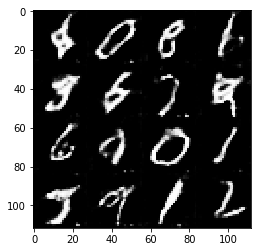

Timestamp 20170803-14-01-21.913 -  Epoch 1/2 -  Step 2210 -  D Loss: 0.9490 - G Loss: 1.0827
Timestamp 20170803-14-01-28.736 -  Epoch 1/2 -  Step 2220 -  D Loss: 0.9732 - G Loss: 1.3138
Timestamp 20170803-14-01-35.533 -  Epoch 1/2 -  Step 2230 -  D Loss: 0.8951 - G Loss: 1.0604
Timestamp 20170803-14-01-42.188 -  Epoch 1/2 -  Step 2240 -  D Loss: 0.7659 - G Loss: 1.5675
Timestamp 20170803-14-01-49.063 -  Epoch 1/2 -  Step 2250 -  D Loss: 0.6620 - G Loss: 1.4214
Timestamp 20170803-14-01-55.874 -  Epoch 1/2 -  Step 2260 -  D Loss: 0.6419 - G Loss: 2.1762
Timestamp 20170803-14-02-02.735 -  Epoch 1/2 -  Step 2270 -  D Loss: 0.8655 - G Loss: 1.4363
Timestamp 20170803-14-02-09.615 -  Epoch 1/2 -  Step 2280 -  D Loss: 1.0440 - G Loss: 2.0076
Timestamp 20170803-14-02-16.196 -  Epoch 1/2 -  Step 2290 -  D Loss: 0.7475 - G Loss: 1.7344
Timestamp 20170803-14-02-22.861 -  Epoch 1/2 -  Step 2300 -  D Loss: 0.8158 - G Loss: 2.0629


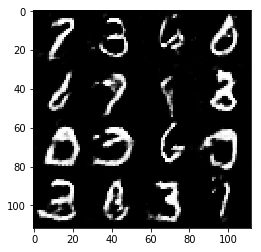

Timestamp 20170803-14-02-29.990 -  Epoch 1/2 -  Step 2310 -  D Loss: 0.7897 - G Loss: 1.3957
Timestamp 20170803-14-02-36.543 -  Epoch 1/2 -  Step 2320 -  D Loss: 0.9351 - G Loss: 1.5987
Timestamp 20170803-14-02-43.140 -  Epoch 1/2 -  Step 2330 -  D Loss: 0.8922 - G Loss: 1.2847
Timestamp 20170803-14-02-49.773 -  Epoch 1/2 -  Step 2340 -  D Loss: 0.9432 - G Loss: 2.4361
Timestamp 20170803-14-02-56.413 -  Epoch 1/2 -  Step 2350 -  D Loss: 0.9786 - G Loss: 1.0866
Timestamp 20170803-14-03-02.951 -  Epoch 1/2 -  Step 2360 -  D Loss: 0.7599 - G Loss: 1.4344
Timestamp 20170803-14-03-09.459 -  Epoch 1/2 -  Step 2370 -  D Loss: 0.5451 - G Loss: 1.8451
Timestamp 20170803-14-03-15.988 -  Epoch 1/2 -  Step 2380 -  D Loss: 0.7916 - G Loss: 1.1730
Timestamp 20170803-14-03-22.513 -  Epoch 1/2 -  Step 2390 -  D Loss: 0.6480 - G Loss: 1.4735
Timestamp 20170803-14-03-29.030 -  Epoch 1/2 -  Step 2400 -  D Loss: 0.5640 - G Loss: 2.6848


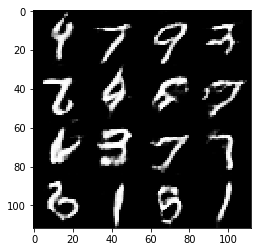

Timestamp 20170803-14-03-36.001 -  Epoch 1/2 -  Step 2410 -  D Loss: 0.5890 - G Loss: 2.1824
Timestamp 20170803-14-03-42.769 -  Epoch 1/2 -  Step 2420 -  D Loss: 0.6186 - G Loss: 1.8738
Timestamp 20170803-14-03-49.313 -  Epoch 1/2 -  Step 2430 -  D Loss: 1.0278 - G Loss: 1.0647
Timestamp 20170803-14-03-55.823 -  Epoch 1/2 -  Step 2440 -  D Loss: 0.7939 - G Loss: 1.6130
Timestamp 20170803-14-04-02.373 -  Epoch 1/2 -  Step 2450 -  D Loss: 0.7086 - G Loss: 1.4183
Timestamp 20170803-14-04-08.949 -  Epoch 1/2 -  Step 2460 -  D Loss: 1.1566 - G Loss: 0.8068
Timestamp 20170803-14-04-15.506 -  Epoch 1/2 -  Step 2470 -  D Loss: 0.5112 - G Loss: 2.1966
Timestamp 20170803-14-04-22.012 -  Epoch 1/2 -  Step 2480 -  D Loss: 0.7690 - G Loss: 1.6138
Timestamp 20170803-14-04-28.522 -  Epoch 1/2 -  Step 2490 -  D Loss: 0.6041 - G Loss: 2.2013
Timestamp 20170803-14-04-35.021 -  Epoch 1/2 -  Step 2500 -  D Loss: 0.6602 - G Loss: 1.4725


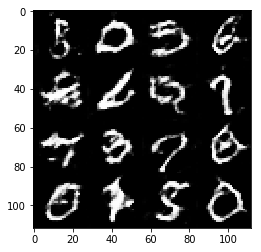

Timestamp 20170803-14-04-42.193 -  Epoch 1/2 -  Step 2510 -  D Loss: 1.1653 - G Loss: 1.2344
Timestamp 20170803-14-04-48.678 -  Epoch 1/2 -  Step 2520 -  D Loss: 0.6547 - G Loss: 2.2111
Timestamp 20170803-14-04-55.162 -  Epoch 1/2 -  Step 2530 -  D Loss: 1.0280 - G Loss: 1.1748
Timestamp 20170803-14-05-01.662 -  Epoch 1/2 -  Step 2540 -  D Loss: 1.0514 - G Loss: 1.1556
Timestamp 20170803-14-05-08.214 -  Epoch 1/2 -  Step 2550 -  D Loss: 0.7402 - G Loss: 1.6235
Timestamp 20170803-14-05-14.782 -  Epoch 1/2 -  Step 2560 -  D Loss: 0.7791 - G Loss: 1.7213
Timestamp 20170803-14-05-21.380 -  Epoch 1/2 -  Step 2570 -  D Loss: 0.7904 - G Loss: 1.0685
Timestamp 20170803-14-05-28.232 -  Epoch 1/2 -  Step 2580 -  D Loss: 1.0221 - G Loss: 1.0384
Timestamp 20170803-14-05-34.871 -  Epoch 1/2 -  Step 2590 -  D Loss: 1.1710 - G Loss: 0.6880
Timestamp 20170803-14-05-41.438 -  Epoch 1/2 -  Step 2600 -  D Loss: 1.0382 - G Loss: 0.9422


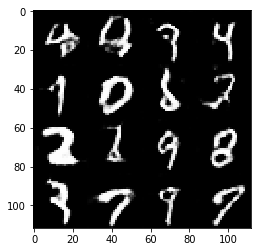

Timestamp 20170803-14-05-48.493 -  Epoch 1/2 -  Step 2610 -  D Loss: 0.6288 - G Loss: 1.9798
Timestamp 20170803-14-05-55.120 -  Epoch 1/2 -  Step 2620 -  D Loss: 0.4968 - G Loss: 2.3464
Timestamp 20170803-14-06-01.728 -  Epoch 1/2 -  Step 2630 -  D Loss: 1.2391 - G Loss: 2.3686
Timestamp 20170803-14-06-08.322 -  Epoch 1/2 -  Step 2640 -  D Loss: 0.6687 - G Loss: 1.4817
Timestamp 20170803-14-06-14.826 -  Epoch 1/2 -  Step 2650 -  D Loss: 0.6563 - G Loss: 1.9676
Timestamp 20170803-14-06-21.335 -  Epoch 1/2 -  Step 2660 -  D Loss: 0.6991 - G Loss: 1.5489
Timestamp 20170803-14-06-27.870 -  Epoch 1/2 -  Step 2670 -  D Loss: 0.7716 - G Loss: 2.7879
Timestamp 20170803-14-06-34.372 -  Epoch 1/2 -  Step 2680 -  D Loss: 0.8526 - G Loss: 1.4843
Timestamp 20170803-14-06-40.880 -  Epoch 1/2 -  Step 2690 -  D Loss: 1.0629 - G Loss: 1.3448
Timestamp 20170803-14-06-47.377 -  Epoch 1/2 -  Step 2700 -  D Loss: 0.8506 - G Loss: 1.4928


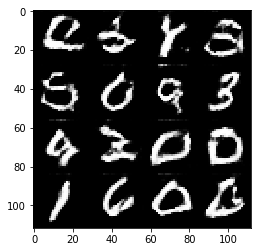

Timestamp 20170803-14-06-54.631 -  Epoch 1/2 -  Step 2710 -  D Loss: 1.2108 - G Loss: 1.0995
Timestamp 20170803-14-07-01.292 -  Epoch 1/2 -  Step 2720 -  D Loss: 1.2630 - G Loss: 0.7288
Timestamp 20170803-14-07-07.865 -  Epoch 1/2 -  Step 2730 -  D Loss: 1.0313 - G Loss: 2.5730
Timestamp 20170803-14-07-14.472 -  Epoch 1/2 -  Step 2740 -  D Loss: 0.7132 - G Loss: 2.1332
Timestamp 20170803-14-07-21.001 -  Epoch 1/2 -  Step 2750 -  D Loss: 0.7596 - G Loss: 1.4452
Timestamp 20170803-14-07-27.554 -  Epoch 1/2 -  Step 2760 -  D Loss: 0.9562 - G Loss: 1.0849
Timestamp 20170803-14-07-34.088 -  Epoch 1/2 -  Step 2770 -  D Loss: 0.9444 - G Loss: 1.5952
Timestamp 20170803-14-07-40.601 -  Epoch 1/2 -  Step 2780 -  D Loss: 0.5532 - G Loss: 1.5423
Timestamp 20170803-14-07-47.088 -  Epoch 1/2 -  Step 2790 -  D Loss: 1.2385 - G Loss: 3.1024
Timestamp 20170803-14-07-53.558 -  Epoch 1/2 -  Step 2800 -  D Loss: 0.9152 - G Loss: 1.8108


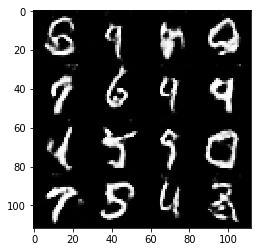

Timestamp 20170803-14-08-00.885 -  Epoch 1/2 -  Step 2810 -  D Loss: 0.5871 - G Loss: 1.7662
Timestamp 20170803-14-08-07.375 -  Epoch 1/2 -  Step 2820 -  D Loss: 0.7833 - G Loss: 1.5286
Timestamp 20170803-14-08-13.893 -  Epoch 1/2 -  Step 2830 -  D Loss: 1.1295 - G Loss: 0.9077
Timestamp 20170803-14-08-20.371 -  Epoch 1/2 -  Step 2840 -  D Loss: 0.8592 - G Loss: 1.4385
Timestamp 20170803-14-08-26.876 -  Epoch 1/2 -  Step 2850 -  D Loss: 0.8339 - G Loss: 1.3054
Timestamp 20170803-14-08-33.406 -  Epoch 1/2 -  Step 2860 -  D Loss: 0.9171 - G Loss: 1.9209
Timestamp 20170803-14-08-39.899 -  Epoch 1/2 -  Step 2870 -  D Loss: 0.6889 - G Loss: 1.8392
Timestamp 20170803-14-08-46.380 -  Epoch 1/2 -  Step 2880 -  D Loss: 0.8724 - G Loss: 1.5193
Timestamp 20170803-14-08-52.877 -  Epoch 1/2 -  Step 2890 -  D Loss: 0.6370 - G Loss: 2.1989
Timestamp 20170803-14-08-59.594 -  Epoch 1/2 -  Step 2900 -  D Loss: 0.7406 - G Loss: 1.4962


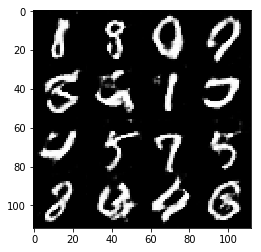

Timestamp 20170803-14-09-06.714 -  Epoch 1/2 -  Step 2910 -  D Loss: 0.8304 - G Loss: 1.7271
Timestamp 20170803-14-09-13.206 -  Epoch 1/2 -  Step 2920 -  D Loss: 0.6347 - G Loss: 1.3135
Timestamp 20170803-14-09-19.736 -  Epoch 1/2 -  Step 2930 -  D Loss: 0.8468 - G Loss: 1.0995
Timestamp 20170803-14-09-26.244 -  Epoch 1/2 -  Step 2940 -  D Loss: 0.9088 - G Loss: 1.4211
Timestamp 20170803-14-09-32.746 -  Epoch 1/2 -  Step 2950 -  D Loss: 0.7998 - G Loss: 1.3102
Timestamp 20170803-14-09-39.312 -  Epoch 1/2 -  Step 2960 -  D Loss: 0.7932 - G Loss: 1.5576
Timestamp 20170803-14-09-45.797 -  Epoch 1/2 -  Step 2970 -  D Loss: 0.6489 - G Loss: 2.5103
Timestamp 20170803-14-09-52.284 -  Epoch 1/2 -  Step 2980 -  D Loss: 1.1482 - G Loss: 1.9906
Timestamp 20170803-14-09-58.790 -  Epoch 1/2 -  Step 2990 -  D Loss: 0.7417 - G Loss: 1.4663
Timestamp 20170803-14-10-05.286 -  Epoch 1/2 -  Step 3000 -  D Loss: 0.6785 - G Loss: 2.1028


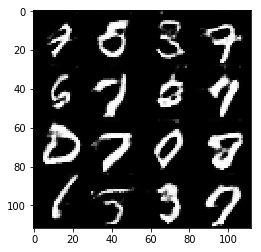

Timestamp 20170803-14-10-12.300 -  Epoch 1/2 -  Step 3010 -  D Loss: 0.6417 - G Loss: 2.3445
Timestamp 20170803-14-10-18.786 -  Epoch 1/2 -  Step 3020 -  D Loss: 1.0535 - G Loss: 1.0329
Timestamp 20170803-14-10-25.281 -  Epoch 1/2 -  Step 3030 -  D Loss: 0.6952 - G Loss: 1.7456
Timestamp 20170803-14-10-31.770 -  Epoch 1/2 -  Step 3040 -  D Loss: 0.7337 - G Loss: 1.4273
Timestamp 20170803-14-10-38.267 -  Epoch 1/2 -  Step 3050 -  D Loss: 0.8182 - G Loss: 1.2221
Timestamp 20170803-14-10-44.794 -  Epoch 1/2 -  Step 3060 -  D Loss: 0.7451 - G Loss: 1.5554
Timestamp 20170803-14-10-51.279 -  Epoch 1/2 -  Step 3070 -  D Loss: 0.8609 - G Loss: 0.9794
Timestamp 20170803-14-10-57.761 -  Epoch 1/2 -  Step 3080 -  D Loss: 0.6919 - G Loss: 2.3568
Timestamp 20170803-14-11-04.247 -  Epoch 1/2 -  Step 3090 -  D Loss: 0.8361 - G Loss: 1.4832
Timestamp 20170803-14-11-10.752 -  Epoch 1/2 -  Step 3100 -  D Loss: 0.9429 - G Loss: 1.0548


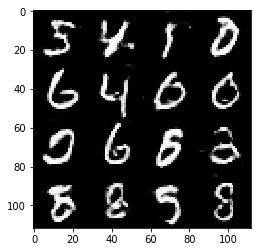

Timestamp 20170803-14-11-18.475 -  Epoch 1/2 -  Step 3110 -  D Loss: 0.9020 - G Loss: 1.5883
Timestamp 20170803-14-11-24.972 -  Epoch 1/2 -  Step 3120 -  D Loss: 1.1856 - G Loss: 1.1269
Timestamp 20170803-14-11-31.487 -  Epoch 1/2 -  Step 3130 -  D Loss: 0.6919 - G Loss: 1.5423
Timestamp 20170803-14-11-37.992 -  Epoch 1/2 -  Step 3140 -  D Loss: 1.0207 - G Loss: 0.8595
Timestamp 20170803-14-11-44.472 -  Epoch 1/2 -  Step 3150 -  D Loss: 1.1334 - G Loss: 2.7275
Timestamp 20170803-14-11-50.967 -  Epoch 1/2 -  Step 3160 -  D Loss: 0.8463 - G Loss: 1.2708
Timestamp 20170803-14-11-57.488 -  Epoch 1/2 -  Step 3170 -  D Loss: 0.9888 - G Loss: 0.9182
Timestamp 20170803-14-12-03.962 -  Epoch 1/2 -  Step 3180 -  D Loss: 1.0602 - G Loss: 1.4230
Timestamp 20170803-14-12-10.428 -  Epoch 1/2 -  Step 3190 -  D Loss: 0.7184 - G Loss: 1.7103
Timestamp 20170803-14-12-16.920 -  Epoch 1/2 -  Step 3200 -  D Loss: 0.7097 - G Loss: 2.0730


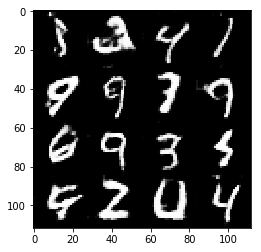

Timestamp 20170803-14-12-23.942 -  Epoch 1/2 -  Step 3210 -  D Loss: 0.6900 - G Loss: 2.0256
Timestamp 20170803-14-12-30.430 -  Epoch 1/2 -  Step 3220 -  D Loss: 0.8923 - G Loss: 1.8557
Timestamp 20170803-14-12-36.907 -  Epoch 1/2 -  Step 3230 -  D Loss: 0.7104 - G Loss: 1.5775
Timestamp 20170803-14-12-43.416 -  Epoch 1/2 -  Step 3240 -  D Loss: 0.9445 - G Loss: 0.8043
Timestamp 20170803-14-12-49.915 -  Epoch 1/2 -  Step 3250 -  D Loss: 1.0345 - G Loss: 0.9753
Timestamp 20170803-14-12-56.405 -  Epoch 1/2 -  Step 3260 -  D Loss: 0.6628 - G Loss: 1.7055
Timestamp 20170803-14-13-02.883 -  Epoch 1/2 -  Step 3270 -  D Loss: 1.0048 - G Loss: 2.7885
Timestamp 20170803-14-13-09.378 -  Epoch 1/2 -  Step 3280 -  D Loss: 0.7581 - G Loss: 1.5987
Timestamp 20170803-14-13-15.864 -  Epoch 1/2 -  Step 3290 -  D Loss: 0.6271 - G Loss: 3.3688
Timestamp 20170803-14-13-22.426 -  Epoch 1/2 -  Step 3300 -  D Loss: 0.6744 - G Loss: 2.3378


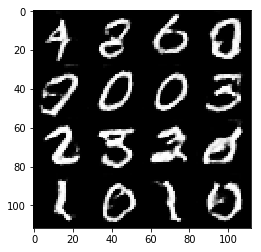

Timestamp 20170803-14-13-29.480 -  Epoch 1/2 -  Step 3310 -  D Loss: 0.6880 - G Loss: 1.5750
Timestamp 20170803-14-13-35.966 -  Epoch 1/2 -  Step 3320 -  D Loss: 0.9483 - G Loss: 1.4137
Timestamp 20170803-14-13-42.483 -  Epoch 1/2 -  Step 3330 -  D Loss: 0.7287 - G Loss: 1.6196
Timestamp 20170803-14-13-48.980 -  Epoch 1/2 -  Step 3340 -  D Loss: 0.9446 - G Loss: 1.3701
Timestamp 20170803-14-13-55.763 -  Epoch 1/2 -  Step 3350 -  D Loss: 0.6210 - G Loss: 2.3053
Timestamp 20170803-14-14-02.261 -  Epoch 1/2 -  Step 3360 -  D Loss: 0.5188 - G Loss: 2.5026
Timestamp 20170803-14-14-08.812 -  Epoch 1/2 -  Step 3370 -  D Loss: 0.7290 - G Loss: 1.6155
Timestamp 20170803-14-14-15.294 -  Epoch 1/2 -  Step 3380 -  D Loss: 0.6844 - G Loss: 1.7027
Timestamp 20170803-14-14-21.818 -  Epoch 1/2 -  Step 3390 -  D Loss: 0.8463 - G Loss: 1.0025
Timestamp 20170803-14-14-28.397 -  Epoch 1/2 -  Step 3400 -  D Loss: 0.7006 - G Loss: 1.8066


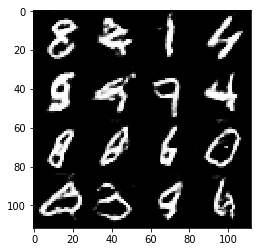

Timestamp 20170803-14-14-35.423 -  Epoch 1/2 -  Step 3410 -  D Loss: 0.9584 - G Loss: 1.2335
Timestamp 20170803-14-14-41.901 -  Epoch 1/2 -  Step 3420 -  D Loss: 0.7249 - G Loss: 1.7857
Timestamp 20170803-14-14-48.741 -  Epoch 1/2 -  Step 3430 -  D Loss: 1.9887 - G Loss: 0.5075
Timestamp 20170803-14-14-55.282 -  Epoch 1/2 -  Step 3440 -  D Loss: 0.6012 - G Loss: 2.3079
Timestamp 20170803-14-15-01.774 -  Epoch 1/2 -  Step 3450 -  D Loss: 0.8901 - G Loss: 1.7377
Timestamp 20170803-14-15-08.262 -  Epoch 1/2 -  Step 3460 -  D Loss: 0.6101 - G Loss: 1.7453
Timestamp 20170803-14-15-14.759 -  Epoch 1/2 -  Step 3470 -  D Loss: 0.5466 - G Loss: 3.1206
Timestamp 20170803-14-15-21.268 -  Epoch 1/2 -  Step 3480 -  D Loss: 0.5836 - G Loss: 2.4319
Timestamp 20170803-14-15-27.793 -  Epoch 1/2 -  Step 3490 -  D Loss: 0.7263 - G Loss: 1.5540
Timestamp 20170803-14-15-34.315 -  Epoch 1/2 -  Step 3500 -  D Loss: 1.1649 - G Loss: 0.7364


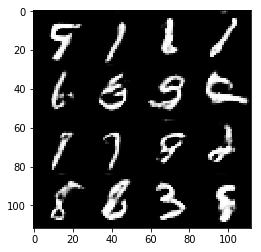

Timestamp 20170803-14-15-41.363 -  Epoch 1/2 -  Step 3510 -  D Loss: 0.7057 - G Loss: 1.5475
Timestamp 20170803-14-15-47.873 -  Epoch 1/2 -  Step 3520 -  D Loss: 0.9275 - G Loss: 1.4223
Timestamp 20170803-14-15-54.365 -  Epoch 1/2 -  Step 3530 -  D Loss: 0.8684 - G Loss: 1.9206
Timestamp 20170803-14-16-01.145 -  Epoch 1/2 -  Step 3540 -  D Loss: 1.2113 - G Loss: 0.7003
Timestamp 20170803-14-16-07.628 -  Epoch 1/2 -  Step 3550 -  D Loss: 0.8075 - G Loss: 1.0660
Timestamp 20170803-14-16-14.201 -  Epoch 1/2 -  Step 3560 -  D Loss: 0.6154 - G Loss: 1.5726
Timestamp 20170803-14-16-20.700 -  Epoch 1/2 -  Step 3570 -  D Loss: 1.1866 - G Loss: 0.9509
Timestamp 20170803-14-16-27.189 -  Epoch 1/2 -  Step 3580 -  D Loss: 0.8565 - G Loss: 0.8600
Timestamp 20170803-14-16-33.691 -  Epoch 1/2 -  Step 3590 -  D Loss: 1.4667 - G Loss: 0.7387
Timestamp 20170803-14-16-40.183 -  Epoch 1/2 -  Step 3600 -  D Loss: 0.6050 - G Loss: 1.5352


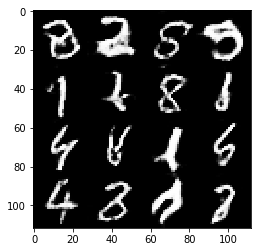

Timestamp 20170803-14-16-47.259 -  Epoch 1/2 -  Step 3610 -  D Loss: 1.0402 - G Loss: 1.6641
Timestamp 20170803-14-16-53.755 -  Epoch 1/2 -  Step 3620 -  D Loss: 0.6447 - G Loss: 2.8298
Timestamp 20170803-14-17-00.282 -  Epoch 1/2 -  Step 3630 -  D Loss: 1.0255 - G Loss: 1.2439
Timestamp 20170803-14-17-06.861 -  Epoch 1/2 -  Step 3640 -  D Loss: 0.6244 - G Loss: 1.7341
Timestamp 20170803-14-17-13.412 -  Epoch 1/2 -  Step 3650 -  D Loss: 0.7051 - G Loss: 1.5806
Timestamp 20170803-14-17-19.926 -  Epoch 1/2 -  Step 3660 -  D Loss: 0.7468 - G Loss: 1.6412
Timestamp 20170803-14-17-26.454 -  Epoch 1/2 -  Step 3670 -  D Loss: 0.6257 - G Loss: 2.0656
Timestamp 20170803-14-17-32.984 -  Epoch 1/2 -  Step 3680 -  D Loss: 0.7226 - G Loss: 1.3543
Timestamp 20170803-14-17-39.497 -  Epoch 1/2 -  Step 3690 -  D Loss: 0.7902 - G Loss: 1.3395
Timestamp 20170803-14-17-45.999 -  Epoch 1/2 -  Step 3700 -  D Loss: 0.8415 - G Loss: 1.4049


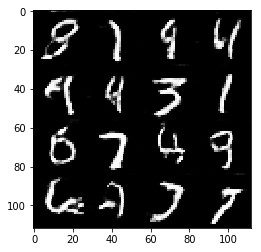

Timestamp 20170803-14-17-53.081 -  Epoch 1/2 -  Step 3710 -  D Loss: 0.8128 - G Loss: 1.3351
Timestamp 20170803-14-17-59.650 -  Epoch 1/2 -  Step 3720 -  D Loss: 0.8196 - G Loss: 2.6247
Timestamp 20170803-14-18-06.185 -  Epoch 1/2 -  Step 3730 -  D Loss: 0.6562 - G Loss: 1.9767
Timestamp 20170803-14-18-12.711 -  Epoch 1/2 -  Step 3740 -  D Loss: 0.6602 - G Loss: 1.6718
Timestamp 20170803-14-18-19.250 -  Epoch 1/2 -  Step 3750 -  D Loss: 0.6405 - G Loss: 1.8817
Timestamp 20170803-14-18-19.414 -  Epoch 1/2 -  Step 3750 -  D Loss: 0.7239 - G Loss: 2.0606


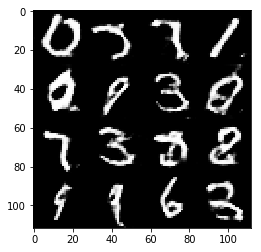

Timestamp 20170803-14-18-26.357 -  Epoch 2/2 -  Step 3760 -  D Loss: 0.5833 - G Loss: 1.8857
Timestamp 20170803-14-18-32.784 -  Epoch 2/2 -  Step 3770 -  D Loss: 0.8693 - G Loss: 2.7842
Timestamp 20170803-14-18-39.205 -  Epoch 2/2 -  Step 3780 -  D Loss: 0.9219 - G Loss: 1.3328
Timestamp 20170803-14-18-45.628 -  Epoch 2/2 -  Step 3790 -  D Loss: 1.0832 - G Loss: 1.1200
Timestamp 20170803-14-18-52.058 -  Epoch 2/2 -  Step 3800 -  D Loss: 0.8053 - G Loss: 1.4109


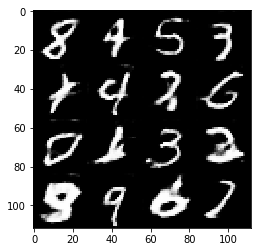

Timestamp 20170803-14-18-59.007 -  Epoch 2/2 -  Step 3810 -  D Loss: 0.8684 - G Loss: 2.4404
Timestamp 20170803-14-19-05.430 -  Epoch 2/2 -  Step 3820 -  D Loss: 0.6978 - G Loss: 2.1732
Timestamp 20170803-14-19-11.874 -  Epoch 2/2 -  Step 3830 -  D Loss: 0.6654 - G Loss: 1.6544
Timestamp 20170803-14-19-18.290 -  Epoch 2/2 -  Step 3840 -  D Loss: 0.9219 - G Loss: 1.2973
Timestamp 20170803-14-19-24.716 -  Epoch 2/2 -  Step 3850 -  D Loss: 0.9884 - G Loss: 2.9705
Timestamp 20170803-14-19-31.138 -  Epoch 2/2 -  Step 3860 -  D Loss: 1.0303 - G Loss: 1.2902
Timestamp 20170803-14-19-37.556 -  Epoch 2/2 -  Step 3870 -  D Loss: 1.1015 - G Loss: 0.7676
Timestamp 20170803-14-19-43.988 -  Epoch 2/2 -  Step 3880 -  D Loss: 0.8726 - G Loss: 0.9091
Timestamp 20170803-14-19-50.407 -  Epoch 2/2 -  Step 3890 -  D Loss: 0.6182 - G Loss: 2.6778
Timestamp 20170803-14-19-56.826 -  Epoch 2/2 -  Step 3900 -  D Loss: 0.5323 - G Loss: 1.7117


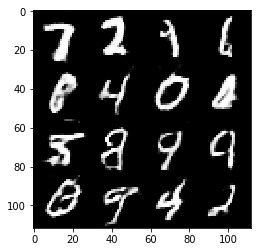

Timestamp 20170803-14-20-03.769 -  Epoch 2/2 -  Step 3910 -  D Loss: 0.5659 - G Loss: 2.8063
Timestamp 20170803-14-20-10.213 -  Epoch 2/2 -  Step 3920 -  D Loss: 0.9025 - G Loss: 0.9630
Timestamp 20170803-14-20-16.634 -  Epoch 2/2 -  Step 3930 -  D Loss: 0.4944 - G Loss: 2.8427
Timestamp 20170803-14-20-23.052 -  Epoch 2/2 -  Step 3940 -  D Loss: 0.9186 - G Loss: 1.7572
Timestamp 20170803-14-20-29.487 -  Epoch 2/2 -  Step 3950 -  D Loss: 0.9803 - G Loss: 3.2475
Timestamp 20170803-14-20-35.902 -  Epoch 2/2 -  Step 3960 -  D Loss: 0.7619 - G Loss: 2.1343
Timestamp 20170803-14-20-42.343 -  Epoch 2/2 -  Step 3970 -  D Loss: 0.6127 - G Loss: 2.0786
Timestamp 20170803-14-20-48.784 -  Epoch 2/2 -  Step 3980 -  D Loss: 0.6087 - G Loss: 2.5125
Timestamp 20170803-14-20-55.212 -  Epoch 2/2 -  Step 3990 -  D Loss: 0.6816 - G Loss: 1.2711
Timestamp 20170803-14-21-01.641 -  Epoch 2/2 -  Step 4000 -  D Loss: 0.5160 - G Loss: 2.0924


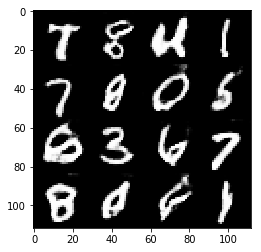

Timestamp 20170803-14-21-08.607 -  Epoch 2/2 -  Step 4010 -  D Loss: 1.0382 - G Loss: 0.9823
Timestamp 20170803-14-21-15.031 -  Epoch 2/2 -  Step 4020 -  D Loss: 0.7306 - G Loss: 2.4048
Timestamp 20170803-14-21-21.465 -  Epoch 2/2 -  Step 4030 -  D Loss: 1.1188 - G Loss: 1.0237
Timestamp 20170803-14-21-27.898 -  Epoch 2/2 -  Step 4040 -  D Loss: 0.7996 - G Loss: 1.5485
Timestamp 20170803-14-21-34.321 -  Epoch 2/2 -  Step 4050 -  D Loss: 1.2871 - G Loss: 0.7820
Timestamp 20170803-14-21-40.767 -  Epoch 2/2 -  Step 4060 -  D Loss: 0.5432 - G Loss: 1.9072
Timestamp 20170803-14-21-47.188 -  Epoch 2/2 -  Step 4070 -  D Loss: 0.7902 - G Loss: 1.1635
Timestamp 20170803-14-21-53.616 -  Epoch 2/2 -  Step 4080 -  D Loss: 0.5417 - G Loss: 3.5250
Timestamp 20170803-14-22-00.049 -  Epoch 2/2 -  Step 4090 -  D Loss: 0.9577 - G Loss: 1.5714
Timestamp 20170803-14-22-06.494 -  Epoch 2/2 -  Step 4100 -  D Loss: 0.7771 - G Loss: 2.4598


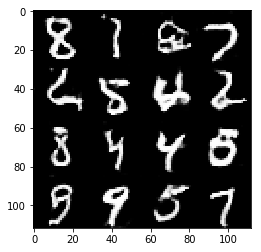

Timestamp 20170803-14-22-13.463 -  Epoch 2/2 -  Step 4110 -  D Loss: 1.2947 - G Loss: 0.5919
Timestamp 20170803-14-22-19.893 -  Epoch 2/2 -  Step 4120 -  D Loss: 0.6181 - G Loss: 2.1520
Timestamp 20170803-14-22-26.314 -  Epoch 2/2 -  Step 4130 -  D Loss: 0.8879 - G Loss: 1.0671
Timestamp 20170803-14-22-32.750 -  Epoch 2/2 -  Step 4140 -  D Loss: 0.7097 - G Loss: 1.8624
Timestamp 20170803-14-22-39.179 -  Epoch 2/2 -  Step 4150 -  D Loss: 0.7450 - G Loss: 2.2917
Timestamp 20170803-14-22-45.591 -  Epoch 2/2 -  Step 4160 -  D Loss: 0.5838 - G Loss: 2.0758
Timestamp 20170803-14-22-52.030 -  Epoch 2/2 -  Step 4170 -  D Loss: 1.2545 - G Loss: 0.8688
Timestamp 20170803-14-22-58.469 -  Epoch 2/2 -  Step 4180 -  D Loss: 1.0231 - G Loss: 1.1688
Timestamp 20170803-14-23-04.895 -  Epoch 2/2 -  Step 4190 -  D Loss: 0.5893 - G Loss: 2.6543
Timestamp 20170803-14-23-11.314 -  Epoch 2/2 -  Step 4200 -  D Loss: 0.7460 - G Loss: 2.8682


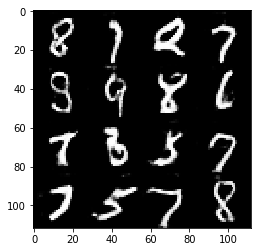

Timestamp 20170803-14-23-18.346 -  Epoch 2/2 -  Step 4210 -  D Loss: 1.0544 - G Loss: 1.0818
Timestamp 20170803-14-23-24.773 -  Epoch 2/2 -  Step 4220 -  D Loss: 0.7801 - G Loss: 1.0933
Timestamp 20170803-14-23-31.183 -  Epoch 2/2 -  Step 4230 -  D Loss: 1.1104 - G Loss: 0.8453
Timestamp 20170803-14-23-37.615 -  Epoch 2/2 -  Step 4240 -  D Loss: 0.8316 - G Loss: 1.3482
Timestamp 20170803-14-23-44.039 -  Epoch 2/2 -  Step 4250 -  D Loss: 0.9236 - G Loss: 0.8786
Timestamp 20170803-14-23-50.467 -  Epoch 2/2 -  Step 4260 -  D Loss: 0.8492 - G Loss: 1.8495
Timestamp 20170803-14-23-56.890 -  Epoch 2/2 -  Step 4270 -  D Loss: 0.5616 - G Loss: 2.0421
Timestamp 20170803-14-24-03.306 -  Epoch 2/2 -  Step 4280 -  D Loss: 0.5359 - G Loss: 2.4005
Timestamp 20170803-14-24-09.737 -  Epoch 2/2 -  Step 4290 -  D Loss: 1.5021 - G Loss: 0.6343
Timestamp 20170803-14-24-16.154 -  Epoch 2/2 -  Step 4300 -  D Loss: 1.0619 - G Loss: 0.9725


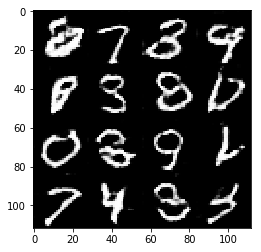

Timestamp 20170803-14-24-23.164 -  Epoch 2/2 -  Step 4310 -  D Loss: 0.5856 - G Loss: 2.0660
Timestamp 20170803-14-24-29.595 -  Epoch 2/2 -  Step 4320 -  D Loss: 0.6009 - G Loss: 1.8223
Timestamp 20170803-14-24-36.011 -  Epoch 2/2 -  Step 4330 -  D Loss: 1.3077 - G Loss: 0.4706
Timestamp 20170803-14-24-42.439 -  Epoch 2/2 -  Step 4340 -  D Loss: 0.8302 - G Loss: 2.6398
Timestamp 20170803-14-24-48.910 -  Epoch 2/2 -  Step 4350 -  D Loss: 0.7440 - G Loss: 2.4222
Timestamp 20170803-14-24-55.347 -  Epoch 2/2 -  Step 4360 -  D Loss: 0.7954 - G Loss: 1.8315
Timestamp 20170803-14-25-01.776 -  Epoch 2/2 -  Step 4370 -  D Loss: 0.7231 - G Loss: 1.5752
Timestamp 20170803-14-25-08.192 -  Epoch 2/2 -  Step 4380 -  D Loss: 0.5431 - G Loss: 2.9197
Timestamp 20170803-14-25-14.621 -  Epoch 2/2 -  Step 4390 -  D Loss: 0.7939 - G Loss: 2.6616
Timestamp 20170803-14-25-21.052 -  Epoch 2/2 -  Step 4400 -  D Loss: 0.9605 - G Loss: 1.2243


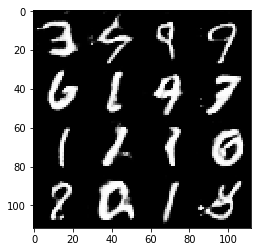

Timestamp 20170803-14-25-28.015 -  Epoch 2/2 -  Step 4410 -  D Loss: 0.8437 - G Loss: 2.1538
Timestamp 20170803-14-25-34.450 -  Epoch 2/2 -  Step 4420 -  D Loss: 0.9282 - G Loss: 2.0468
Timestamp 20170803-14-25-40.863 -  Epoch 2/2 -  Step 4430 -  D Loss: 0.7976 - G Loss: 1.8199
Timestamp 20170803-14-25-47.313 -  Epoch 2/2 -  Step 4440 -  D Loss: 0.6165 - G Loss: 2.3302
Timestamp 20170803-14-25-53.736 -  Epoch 2/2 -  Step 4450 -  D Loss: 0.7633 - G Loss: 1.6421
Timestamp 20170803-14-26-00.164 -  Epoch 2/2 -  Step 4460 -  D Loss: 0.7548 - G Loss: 1.3565
Timestamp 20170803-14-26-06.594 -  Epoch 2/2 -  Step 4470 -  D Loss: 0.5780 - G Loss: 1.6967
Timestamp 20170803-14-26-13.030 -  Epoch 2/2 -  Step 4480 -  D Loss: 0.7637 - G Loss: 1.3583
Timestamp 20170803-14-26-19.480 -  Epoch 2/2 -  Step 4490 -  D Loss: 0.7826 - G Loss: 1.3906
Timestamp 20170803-14-26-25.915 -  Epoch 2/2 -  Step 4500 -  D Loss: 0.6472 - G Loss: 1.7567


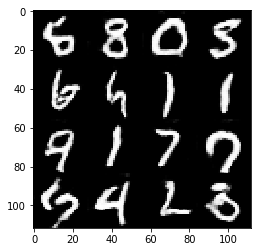

Timestamp 20170803-14-26-32.870 -  Epoch 2/2 -  Step 4510 -  D Loss: 0.6163 - G Loss: 1.5804
Timestamp 20170803-14-26-39.295 -  Epoch 2/2 -  Step 4520 -  D Loss: 0.9290 - G Loss: 1.0725
Timestamp 20170803-14-26-45.706 -  Epoch 2/2 -  Step 4530 -  D Loss: 0.5078 - G Loss: 1.8725
Timestamp 20170803-14-26-52.138 -  Epoch 2/2 -  Step 4540 -  D Loss: 0.7779 - G Loss: 1.9608
Timestamp 20170803-14-26-58.559 -  Epoch 2/2 -  Step 4550 -  D Loss: 0.5758 - G Loss: 2.4339
Timestamp 20170803-14-27-04.979 -  Epoch 2/2 -  Step 4560 -  D Loss: 0.5909 - G Loss: 2.1068
Timestamp 20170803-14-27-11.405 -  Epoch 2/2 -  Step 4570 -  D Loss: 0.5576 - G Loss: 2.2671
Timestamp 20170803-14-27-17.835 -  Epoch 2/2 -  Step 4580 -  D Loss: 1.1531 - G Loss: 1.0346
Timestamp 20170803-14-27-24.257 -  Epoch 2/2 -  Step 4590 -  D Loss: 0.7937 - G Loss: 3.0706
Timestamp 20170803-14-27-30.698 -  Epoch 2/2 -  Step 4600 -  D Loss: 0.6166 - G Loss: 2.2580


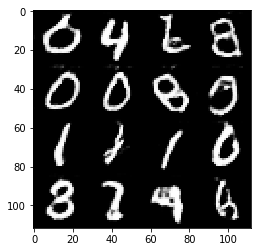

Timestamp 20170803-14-27-37.685 -  Epoch 2/2 -  Step 4610 -  D Loss: 0.6900 - G Loss: 2.4878
Timestamp 20170803-14-27-44.105 -  Epoch 2/2 -  Step 4620 -  D Loss: 0.6806 - G Loss: 1.1775
Timestamp 20170803-14-27-50.533 -  Epoch 2/2 -  Step 4630 -  D Loss: 0.8220 - G Loss: 1.2882
Timestamp 20170803-14-27-56.970 -  Epoch 2/2 -  Step 4640 -  D Loss: 0.7108 - G Loss: 2.3260
Timestamp 20170803-14-28-03.383 -  Epoch 2/2 -  Step 4650 -  D Loss: 0.7709 - G Loss: 1.9199
Timestamp 20170803-14-28-09.814 -  Epoch 2/2 -  Step 4660 -  D Loss: 0.6685 - G Loss: 1.9415
Timestamp 20170803-14-28-16.265 -  Epoch 2/2 -  Step 4670 -  D Loss: 0.9074 - G Loss: 1.7126
Timestamp 20170803-14-28-22.688 -  Epoch 2/2 -  Step 4680 -  D Loss: 0.6388 - G Loss: 2.6828
Timestamp 20170803-14-28-29.127 -  Epoch 2/2 -  Step 4690 -  D Loss: 0.8446 - G Loss: 1.2639
Timestamp 20170803-14-28-35.554 -  Epoch 2/2 -  Step 4700 -  D Loss: 0.5516 - G Loss: 1.8853


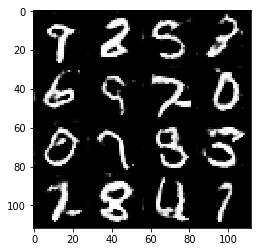

Timestamp 20170803-14-28-42.834 -  Epoch 2/2 -  Step 4710 -  D Loss: 0.6075 - G Loss: 2.1169
Timestamp 20170803-14-28-49.263 -  Epoch 2/2 -  Step 4720 -  D Loss: 0.5112 - G Loss: 2.5054
Timestamp 20170803-14-28-55.686 -  Epoch 2/2 -  Step 4730 -  D Loss: 1.1576 - G Loss: 0.7094
Timestamp 20170803-14-29-02.112 -  Epoch 2/2 -  Step 4740 -  D Loss: 0.6805 - G Loss: 1.5870
Timestamp 20170803-14-29-08.557 -  Epoch 2/2 -  Step 4750 -  D Loss: 1.2947 - G Loss: 0.7416
Timestamp 20170803-14-29-14.980 -  Epoch 2/2 -  Step 4760 -  D Loss: 0.9185 - G Loss: 1.0117
Timestamp 20170803-14-29-21.419 -  Epoch 2/2 -  Step 4770 -  D Loss: 0.7784 - G Loss: 1.7361
Timestamp 20170803-14-29-27.831 -  Epoch 2/2 -  Step 4780 -  D Loss: 0.8677 - G Loss: 1.0833
Timestamp 20170803-14-29-34.281 -  Epoch 2/2 -  Step 4790 -  D Loss: 0.6189 - G Loss: 2.4058
Timestamp 20170803-14-29-40.707 -  Epoch 2/2 -  Step 4800 -  D Loss: 0.7456 - G Loss: 1.3546


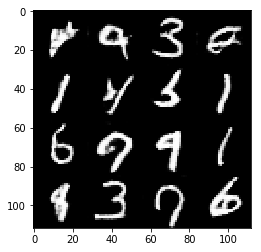

Timestamp 20170803-14-29-47.712 -  Epoch 2/2 -  Step 4810 -  D Loss: 0.6992 - G Loss: 1.8962
Timestamp 20170803-14-29-54.142 -  Epoch 2/2 -  Step 4820 -  D Loss: 0.5453 - G Loss: 2.4332
Timestamp 20170803-14-30-00.561 -  Epoch 2/2 -  Step 4830 -  D Loss: 0.6577 - G Loss: 1.9565
Timestamp 20170803-14-30-07.003 -  Epoch 2/2 -  Step 4840 -  D Loss: 0.5310 - G Loss: 2.0839
Timestamp 20170803-14-30-13.433 -  Epoch 2/2 -  Step 4850 -  D Loss: 0.6802 - G Loss: 2.8369
Timestamp 20170803-14-30-19.857 -  Epoch 2/2 -  Step 4860 -  D Loss: 0.8051 - G Loss: 2.1592
Timestamp 20170803-14-30-26.299 -  Epoch 2/2 -  Step 4870 -  D Loss: 0.7302 - G Loss: 3.1164
Timestamp 20170803-14-30-32.726 -  Epoch 2/2 -  Step 4880 -  D Loss: 1.3133 - G Loss: 0.7558
Timestamp 20170803-14-30-39.154 -  Epoch 2/2 -  Step 4890 -  D Loss: 0.7044 - G Loss: 1.8953
Timestamp 20170803-14-30-45.568 -  Epoch 2/2 -  Step 4900 -  D Loss: 1.0419 - G Loss: 1.1167


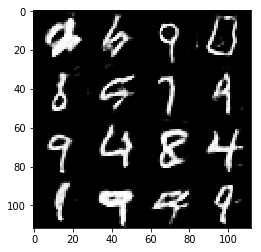

Timestamp 20170803-14-30-52.569 -  Epoch 2/2 -  Step 4910 -  D Loss: 0.6961 - G Loss: 2.7340
Timestamp 20170803-14-30-58.997 -  Epoch 2/2 -  Step 4920 -  D Loss: 0.5317 - G Loss: 1.8636
Timestamp 20170803-14-31-05.435 -  Epoch 2/2 -  Step 4930 -  D Loss: 1.2499 - G Loss: 1.0186
Timestamp 20170803-14-31-11.865 -  Epoch 2/2 -  Step 4940 -  D Loss: 0.8035 - G Loss: 1.8595
Timestamp 20170803-14-31-18.283 -  Epoch 2/2 -  Step 4950 -  D Loss: 0.6225 - G Loss: 2.0164
Timestamp 20170803-14-31-24.708 -  Epoch 2/2 -  Step 4960 -  D Loss: 0.7567 - G Loss: 1.8400
Timestamp 20170803-14-31-31.128 -  Epoch 2/2 -  Step 4970 -  D Loss: 1.5878 - G Loss: 0.7343
Timestamp 20170803-14-31-37.549 -  Epoch 2/2 -  Step 4980 -  D Loss: 0.7642 - G Loss: 1.3191
Timestamp 20170803-14-31-43.960 -  Epoch 2/2 -  Step 4990 -  D Loss: 0.4964 - G Loss: 2.0599
Timestamp 20170803-14-31-50.420 -  Epoch 2/2 -  Step 5000 -  D Loss: 0.7213 - G Loss: 1.1075


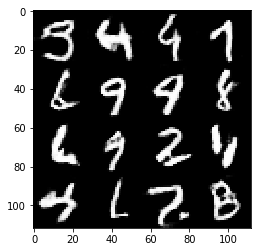

Timestamp 20170803-14-31-57.401 -  Epoch 2/2 -  Step 5010 -  D Loss: 0.6536 - G Loss: 1.8393
Timestamp 20170803-14-32-03.834 -  Epoch 2/2 -  Step 5020 -  D Loss: 0.5710 - G Loss: 1.8669
Timestamp 20170803-14-32-10.286 -  Epoch 2/2 -  Step 5030 -  D Loss: 0.6485 - G Loss: 2.9964
Timestamp 20170803-14-32-16.718 -  Epoch 2/2 -  Step 5040 -  D Loss: 0.6052 - G Loss: 1.6506
Timestamp 20170803-14-32-23.139 -  Epoch 2/2 -  Step 5050 -  D Loss: 0.7188 - G Loss: 1.0845
Timestamp 20170803-14-32-29.573 -  Epoch 2/2 -  Step 5060 -  D Loss: 0.6424 - G Loss: 1.5966
Timestamp 20170803-14-32-35.992 -  Epoch 2/2 -  Step 5070 -  D Loss: 0.5304 - G Loss: 2.0406
Timestamp 20170803-14-32-42.417 -  Epoch 2/2 -  Step 5080 -  D Loss: 0.5800 - G Loss: 1.6298
Timestamp 20170803-14-32-48.839 -  Epoch 2/2 -  Step 5090 -  D Loss: 0.7814 - G Loss: 1.8153
Timestamp 20170803-14-32-55.290 -  Epoch 2/2 -  Step 5100 -  D Loss: 1.2611 - G Loss: 1.0787


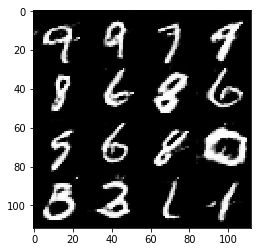

Timestamp 20170803-14-33-02.282 -  Epoch 2/2 -  Step 5110 -  D Loss: 0.5501 - G Loss: 2.6278
Timestamp 20170803-14-33-08.719 -  Epoch 2/2 -  Step 5120 -  D Loss: 0.9689 - G Loss: 1.2936
Timestamp 20170803-14-33-15.144 -  Epoch 2/2 -  Step 5130 -  D Loss: 0.7420 - G Loss: 1.5847
Timestamp 20170803-14-33-21.562 -  Epoch 2/2 -  Step 5140 -  D Loss: 0.5433 - G Loss: 2.5454
Timestamp 20170803-14-33-27.997 -  Epoch 2/2 -  Step 5150 -  D Loss: 0.4816 - G Loss: 1.9808
Timestamp 20170803-14-33-34.426 -  Epoch 2/2 -  Step 5160 -  D Loss: 0.4954 - G Loss: 2.6309
Timestamp 20170803-14-33-40.834 -  Epoch 2/2 -  Step 5170 -  D Loss: 0.9456 - G Loss: 1.2949
Timestamp 20170803-14-33-47.288 -  Epoch 2/2 -  Step 5180 -  D Loss: 0.5136 - G Loss: 2.1345
Timestamp 20170803-14-33-53.716 -  Epoch 2/2 -  Step 5190 -  D Loss: 0.6504 - G Loss: 1.5132
Timestamp 20170803-14-34-00.143 -  Epoch 2/2 -  Step 5200 -  D Loss: 0.8909 - G Loss: 1.8781


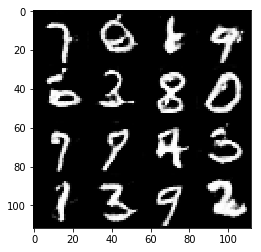

Timestamp 20170803-14-34-07.152 -  Epoch 2/2 -  Step 5210 -  D Loss: 0.6871 - G Loss: 2.3150
Timestamp 20170803-14-34-13.576 -  Epoch 2/2 -  Step 5220 -  D Loss: 0.6376 - G Loss: 1.6395
Timestamp 20170803-14-34-20.013 -  Epoch 2/2 -  Step 5230 -  D Loss: 0.5550 - G Loss: 2.3725
Timestamp 20170803-14-34-26.436 -  Epoch 2/2 -  Step 5240 -  D Loss: 0.5545 - G Loss: 3.1281
Timestamp 20170803-14-34-32.864 -  Epoch 2/2 -  Step 5250 -  D Loss: 0.6837 - G Loss: 1.2256
Timestamp 20170803-14-34-39.292 -  Epoch 2/2 -  Step 5260 -  D Loss: 0.6517 - G Loss: 1.4976
Timestamp 20170803-14-34-45.716 -  Epoch 2/2 -  Step 5270 -  D Loss: 0.4439 - G Loss: 3.5423
Timestamp 20170803-14-34-52.139 -  Epoch 2/2 -  Step 5280 -  D Loss: 0.6227 - G Loss: 1.7279
Timestamp 20170803-14-34-58.574 -  Epoch 2/2 -  Step 5290 -  D Loss: 0.8298 - G Loss: 1.7281
Timestamp 20170803-14-35-05.008 -  Epoch 2/2 -  Step 5300 -  D Loss: 1.0441 - G Loss: 3.7207


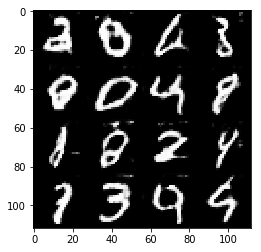

Timestamp 20170803-14-35-11.996 -  Epoch 2/2 -  Step 5310 -  D Loss: 0.8663 - G Loss: 1.1676
Timestamp 20170803-14-35-18.423 -  Epoch 2/2 -  Step 5320 -  D Loss: 0.9320 - G Loss: 1.3924
Timestamp 20170803-14-35-24.857 -  Epoch 2/2 -  Step 5330 -  D Loss: 0.7001 - G Loss: 2.1871
Timestamp 20170803-14-35-31.284 -  Epoch 2/2 -  Step 5340 -  D Loss: 0.6314 - G Loss: 1.7196
Timestamp 20170803-14-35-37.717 -  Epoch 2/2 -  Step 5350 -  D Loss: 1.2608 - G Loss: 0.7592
Timestamp 20170803-14-35-44.134 -  Epoch 2/2 -  Step 5360 -  D Loss: 0.6077 - G Loss: 2.9120
Timestamp 20170803-14-35-50.556 -  Epoch 2/2 -  Step 5370 -  D Loss: 0.5786 - G Loss: 1.7409
Timestamp 20170803-14-35-56.993 -  Epoch 2/2 -  Step 5380 -  D Loss: 0.5258 - G Loss: 1.9782
Timestamp 20170803-14-36-03.425 -  Epoch 2/2 -  Step 5390 -  D Loss: 0.4352 - G Loss: 2.2493
Timestamp 20170803-14-36-09.832 -  Epoch 2/2 -  Step 5400 -  D Loss: 0.7582 - G Loss: 1.9337


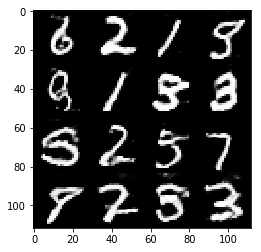

Timestamp 20170803-14-36-16.870 -  Epoch 2/2 -  Step 5410 -  D Loss: 0.5667 - G Loss: 2.1575
Timestamp 20170803-14-36-23.299 -  Epoch 2/2 -  Step 5420 -  D Loss: 0.4745 - G Loss: 3.5057
Timestamp 20170803-14-36-29.737 -  Epoch 2/2 -  Step 5430 -  D Loss: 0.5599 - G Loss: 2.3040
Timestamp 20170803-14-36-36.163 -  Epoch 2/2 -  Step 5440 -  D Loss: 0.7814 - G Loss: 1.2618
Timestamp 20170803-14-36-42.592 -  Epoch 2/2 -  Step 5450 -  D Loss: 0.5032 - G Loss: 2.4202
Timestamp 20170803-14-36-49.035 -  Epoch 2/2 -  Step 5460 -  D Loss: 1.1816 - G Loss: 0.8190
Timestamp 20170803-14-36-55.467 -  Epoch 2/2 -  Step 5470 -  D Loss: 0.6403 - G Loss: 1.9024
Timestamp 20170803-14-37-01.901 -  Epoch 2/2 -  Step 5480 -  D Loss: 0.4834 - G Loss: 2.6036
Timestamp 20170803-14-37-08.326 -  Epoch 2/2 -  Step 5490 -  D Loss: 0.8725 - G Loss: 0.8976
Timestamp 20170803-14-37-14.750 -  Epoch 2/2 -  Step 5500 -  D Loss: 0.6770 - G Loss: 1.8963


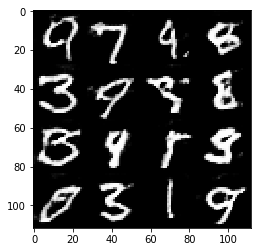

Timestamp 20170803-14-37-21.744 -  Epoch 2/2 -  Step 5510 -  D Loss: 0.5846 - G Loss: 1.6734
Timestamp 20170803-14-37-28.164 -  Epoch 2/2 -  Step 5520 -  D Loss: 0.7149 - G Loss: 1.7557
Timestamp 20170803-14-37-34.589 -  Epoch 2/2 -  Step 5530 -  D Loss: 0.7077 - G Loss: 1.7270
Timestamp 20170803-14-37-41.000 -  Epoch 2/2 -  Step 5540 -  D Loss: 0.5015 - G Loss: 1.9811
Timestamp 20170803-14-37-47.434 -  Epoch 2/2 -  Step 5550 -  D Loss: 0.9617 - G Loss: 1.0080
Timestamp 20170803-14-37-53.855 -  Epoch 2/2 -  Step 5560 -  D Loss: 0.5850 - G Loss: 3.0026
Timestamp 20170803-14-38-00.276 -  Epoch 2/2 -  Step 5570 -  D Loss: 1.0800 - G Loss: 0.7378
Timestamp 20170803-14-38-06.705 -  Epoch 2/2 -  Step 5580 -  D Loss: 0.5662 - G Loss: 2.2597
Timestamp 20170803-14-38-13.124 -  Epoch 2/2 -  Step 5590 -  D Loss: 0.9089 - G Loss: 1.6194
Timestamp 20170803-14-38-19.553 -  Epoch 2/2 -  Step 5600 -  D Loss: 1.2956 - G Loss: 0.7760


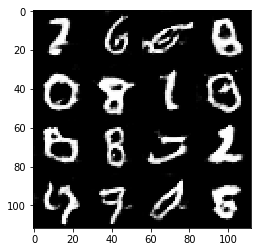

Timestamp 20170803-14-38-26.550 -  Epoch 2/2 -  Step 5610 -  D Loss: 0.5247 - G Loss: 2.2977
Timestamp 20170803-14-38-32.974 -  Epoch 2/2 -  Step 5620 -  D Loss: 0.6099 - G Loss: 2.9400
Timestamp 20170803-14-38-39.393 -  Epoch 2/2 -  Step 5630 -  D Loss: 0.6960 - G Loss: 1.2026
Timestamp 20170803-14-38-45.833 -  Epoch 2/2 -  Step 5640 -  D Loss: 0.7224 - G Loss: 2.4565
Timestamp 20170803-14-38-52.276 -  Epoch 2/2 -  Step 5650 -  D Loss: 0.6498 - G Loss: 2.2564
Timestamp 20170803-14-38-58.710 -  Epoch 2/2 -  Step 5660 -  D Loss: 0.6740 - G Loss: 3.3751
Timestamp 20170803-14-39-05.132 -  Epoch 2/2 -  Step 5670 -  D Loss: 0.5242 - G Loss: 2.0203
Timestamp 20170803-14-39-11.552 -  Epoch 2/2 -  Step 5680 -  D Loss: 0.5860 - G Loss: 2.5056
Timestamp 20170803-14-39-17.978 -  Epoch 2/2 -  Step 5690 -  D Loss: 0.8291 - G Loss: 1.0602
Timestamp 20170803-14-39-24.414 -  Epoch 2/2 -  Step 5700 -  D Loss: 0.7310 - G Loss: 1.3762


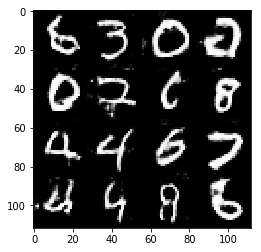

Timestamp 20170803-14-39-31.415 -  Epoch 2/2 -  Step 5710 -  D Loss: 0.9112 - G Loss: 1.5159
Timestamp 20170803-14-39-37.853 -  Epoch 2/2 -  Step 5720 -  D Loss: 0.9071 - G Loss: 1.5483
Timestamp 20170803-14-39-44.274 -  Epoch 2/2 -  Step 5730 -  D Loss: 0.6506 - G Loss: 1.2748
Timestamp 20170803-14-39-50.709 -  Epoch 2/2 -  Step 5740 -  D Loss: 0.5226 - G Loss: 2.6931
Timestamp 20170803-14-39-57.121 -  Epoch 2/2 -  Step 5750 -  D Loss: 0.6861 - G Loss: 1.3398
Timestamp 20170803-14-40-03.545 -  Epoch 2/2 -  Step 5760 -  D Loss: 0.4534 - G Loss: 1.7900
Timestamp 20170803-14-40-09.981 -  Epoch 2/2 -  Step 5770 -  D Loss: 0.5722 - G Loss: 1.7749
Timestamp 20170803-14-40-16.403 -  Epoch 2/2 -  Step 5780 -  D Loss: 0.5375 - G Loss: 2.1594
Timestamp 20170803-14-40-22.848 -  Epoch 2/2 -  Step 5790 -  D Loss: 0.5867 - G Loss: 2.5429
Timestamp 20170803-14-40-29.259 -  Epoch 2/2 -  Step 5800 -  D Loss: 0.6235 - G Loss: 2.1921


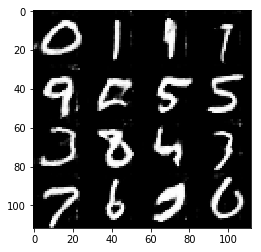

Timestamp 20170803-14-40-36.300 -  Epoch 2/2 -  Step 5810 -  D Loss: 0.6913 - G Loss: 1.6131
Timestamp 20170803-14-40-42.730 -  Epoch 2/2 -  Step 5820 -  D Loss: 0.4290 - G Loss: 3.3302
Timestamp 20170803-14-40-49.158 -  Epoch 2/2 -  Step 5830 -  D Loss: 1.0867 - G Loss: 0.5051
Timestamp 20170803-14-40-55.588 -  Epoch 2/2 -  Step 5840 -  D Loss: 0.6446 - G Loss: 1.4662
Timestamp 20170803-14-41-02.025 -  Epoch 2/2 -  Step 5850 -  D Loss: 0.5619 - G Loss: 2.1040
Timestamp 20170803-14-41-08.472 -  Epoch 2/2 -  Step 5860 -  D Loss: 1.1141 - G Loss: 3.8543
Timestamp 20170803-14-41-14.909 -  Epoch 2/2 -  Step 5870 -  D Loss: 0.9461 - G Loss: 1.0805
Timestamp 20170803-14-41-21.340 -  Epoch 2/2 -  Step 5880 -  D Loss: 0.9410 - G Loss: 2.1373
Timestamp 20170803-14-41-27.765 -  Epoch 2/2 -  Step 5890 -  D Loss: 0.6052 - G Loss: 1.6350
Timestamp 20170803-14-41-34.183 -  Epoch 2/2 -  Step 5900 -  D Loss: 0.6348 - G Loss: 2.1479


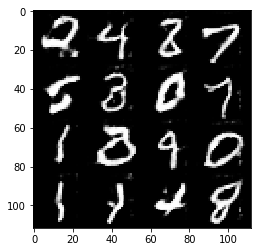

Timestamp 20170803-14-41-41.206 -  Epoch 2/2 -  Step 5910 -  D Loss: 1.1062 - G Loss: 1.4693
Timestamp 20170803-14-41-47.627 -  Epoch 2/2 -  Step 5920 -  D Loss: 0.6965 - G Loss: 2.1709
Timestamp 20170803-14-41-54.078 -  Epoch 2/2 -  Step 5930 -  D Loss: 0.3996 - G Loss: 3.0287
Timestamp 20170803-14-42-00.526 -  Epoch 2/2 -  Step 5940 -  D Loss: 0.5332 - G Loss: 2.4908
Timestamp 20170803-14-42-06.958 -  Epoch 2/2 -  Step 5950 -  D Loss: 0.5966 - G Loss: 3.3969
Timestamp 20170803-14-42-13.377 -  Epoch 2/2 -  Step 5960 -  D Loss: 0.6908 - G Loss: 2.0263
Timestamp 20170803-14-42-19.820 -  Epoch 2/2 -  Step 5970 -  D Loss: 0.8026 - G Loss: 1.4802
Timestamp 20170803-14-42-26.257 -  Epoch 2/2 -  Step 5980 -  D Loss: 0.7031 - G Loss: 2.3690
Timestamp 20170803-14-42-32.685 -  Epoch 2/2 -  Step 5990 -  D Loss: 0.5262 - G Loss: 2.8670
Timestamp 20170803-14-42-39.107 -  Epoch 2/2 -  Step 6000 -  D Loss: 0.5749 - G Loss: 2.3877


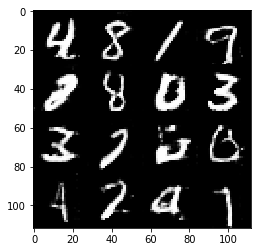

Timestamp 20170803-14-42-46.099 -  Epoch 2/2 -  Step 6010 -  D Loss: 0.4849 - G Loss: 2.4637
Timestamp 20170803-14-42-52.556 -  Epoch 2/2 -  Step 6020 -  D Loss: 0.9681 - G Loss: 0.7771
Timestamp 20170803-14-42-58.971 -  Epoch 2/2 -  Step 6030 -  D Loss: 0.5709 - G Loss: 2.5270
Timestamp 20170803-14-43-05.399 -  Epoch 2/2 -  Step 6040 -  D Loss: 0.5729 - G Loss: 3.2182
Timestamp 20170803-14-43-11.819 -  Epoch 2/2 -  Step 6050 -  D Loss: 0.5641 - G Loss: 1.9851
Timestamp 20170803-14-43-18.247 -  Epoch 2/2 -  Step 6060 -  D Loss: 0.8288 - G Loss: 1.4165
Timestamp 20170803-14-43-24.697 -  Epoch 2/2 -  Step 6070 -  D Loss: 0.6076 - G Loss: 1.4952
Timestamp 20170803-14-43-31.126 -  Epoch 2/2 -  Step 6080 -  D Loss: 0.7286 - G Loss: 0.9122
Timestamp 20170803-14-43-37.565 -  Epoch 2/2 -  Step 6090 -  D Loss: 0.6668 - G Loss: 2.0560
Timestamp 20170803-14-43-44.000 -  Epoch 2/2 -  Step 6100 -  D Loss: 0.6498 - G Loss: 1.8030


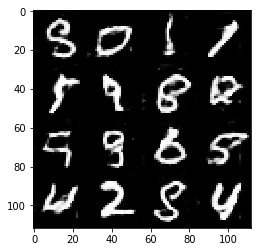

Timestamp 20170803-14-43-51.006 -  Epoch 2/2 -  Step 6110 -  D Loss: 0.5462 - G Loss: 2.2943
Timestamp 20170803-14-43-57.434 -  Epoch 2/2 -  Step 6120 -  D Loss: 0.5411 - G Loss: 2.4929
Timestamp 20170803-14-44-03.868 -  Epoch 2/2 -  Step 6130 -  D Loss: 0.4878 - G Loss: 3.4982
Timestamp 20170803-14-44-10.301 -  Epoch 2/2 -  Step 6140 -  D Loss: 0.3995 - G Loss: 3.2697
Timestamp 20170803-14-44-16.729 -  Epoch 2/2 -  Step 6150 -  D Loss: 0.6493 - G Loss: 1.9038
Timestamp 20170803-14-44-23.164 -  Epoch 2/2 -  Step 6160 -  D Loss: 0.5837 - G Loss: 2.3889
Timestamp 20170803-14-44-29.583 -  Epoch 2/2 -  Step 6170 -  D Loss: 0.4678 - G Loss: 2.9492
Timestamp 20170803-14-44-36.018 -  Epoch 2/2 -  Step 6180 -  D Loss: 1.1904 - G Loss: 1.7923
Timestamp 20170803-14-44-42.454 -  Epoch 2/2 -  Step 6190 -  D Loss: 0.7660 - G Loss: 1.6957
Timestamp 20170803-14-44-48.883 -  Epoch 2/2 -  Step 6200 -  D Loss: 0.6263 - G Loss: 1.9661


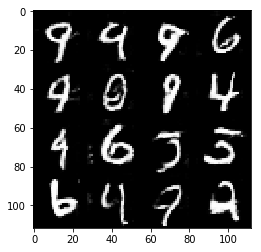

Timestamp 20170803-14-44-55.895 -  Epoch 2/2 -  Step 6210 -  D Loss: 0.6704 - G Loss: 1.8350
Timestamp 20170803-14-45-02.334 -  Epoch 2/2 -  Step 6220 -  D Loss: 0.8574 - G Loss: 1.7792
Timestamp 20170803-14-45-08.800 -  Epoch 2/2 -  Step 6230 -  D Loss: 0.4754 - G Loss: 3.2661
Timestamp 20170803-14-45-15.223 -  Epoch 2/2 -  Step 6240 -  D Loss: 0.6005 - G Loss: 2.8166
Timestamp 20170803-14-45-21.650 -  Epoch 2/2 -  Step 6250 -  D Loss: 0.6741 - G Loss: 2.7944
Timestamp 20170803-14-45-28.093 -  Epoch 2/2 -  Step 6260 -  D Loss: 0.7510 - G Loss: 1.6966
Timestamp 20170803-14-45-34.535 -  Epoch 2/2 -  Step 6270 -  D Loss: 0.6997 - G Loss: 1.7083
Timestamp 20170803-14-45-40.962 -  Epoch 2/2 -  Step 6280 -  D Loss: 0.6893 - G Loss: 1.9394
Timestamp 20170803-14-45-47.377 -  Epoch 2/2 -  Step 6290 -  D Loss: 0.5390 - G Loss: 2.0650
Timestamp 20170803-14-45-53.806 -  Epoch 2/2 -  Step 6300 -  D Loss: 0.4713 - G Loss: 1.9846


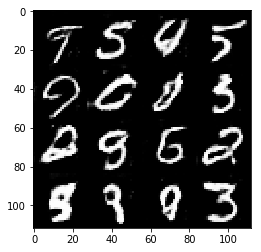

Timestamp 20170803-14-46-00.812 -  Epoch 2/2 -  Step 6310 -  D Loss: 0.7191 - G Loss: 1.4058
Timestamp 20170803-14-46-07.253 -  Epoch 2/2 -  Step 6320 -  D Loss: 0.5070 - G Loss: 2.2427
Timestamp 20170803-14-46-13.687 -  Epoch 2/2 -  Step 6330 -  D Loss: 0.5474 - G Loss: 2.4513
Timestamp 20170803-14-46-20.104 -  Epoch 2/2 -  Step 6340 -  D Loss: 0.6263 - G Loss: 2.1266
Timestamp 20170803-14-46-26.537 -  Epoch 2/2 -  Step 6350 -  D Loss: 0.6110 - G Loss: 1.9084
Timestamp 20170803-14-46-32.976 -  Epoch 2/2 -  Step 6360 -  D Loss: 0.5350 - G Loss: 2.1278
Timestamp 20170803-14-46-39.405 -  Epoch 2/2 -  Step 6370 -  D Loss: 0.5872 - G Loss: 3.3943
Timestamp 20170803-14-46-45.849 -  Epoch 2/2 -  Step 6380 -  D Loss: 0.5387 - G Loss: 2.2333
Timestamp 20170803-14-46-52.274 -  Epoch 2/2 -  Step 6390 -  D Loss: 0.8039 - G Loss: 0.9978
Timestamp 20170803-14-46-58.711 -  Epoch 2/2 -  Step 6400 -  D Loss: 0.6129 - G Loss: 2.3814


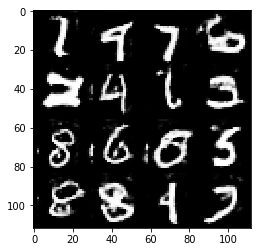

Timestamp 20170803-14-47-05.861 -  Epoch 2/2 -  Step 6410 -  D Loss: 1.3486 - G Loss: 0.6273
Timestamp 20170803-14-47-12.288 -  Epoch 2/2 -  Step 6420 -  D Loss: 0.5107 - G Loss: 4.0550
Timestamp 20170803-14-47-18.788 -  Epoch 2/2 -  Step 6430 -  D Loss: 0.6327 - G Loss: 2.2593
Timestamp 20170803-14-47-25.257 -  Epoch 2/2 -  Step 6440 -  D Loss: 0.8201 - G Loss: 3.3860
Timestamp 20170803-14-47-31.749 -  Epoch 2/2 -  Step 6450 -  D Loss: 0.7806 - G Loss: 2.0644
Timestamp 20170803-14-47-38.202 -  Epoch 2/2 -  Step 6460 -  D Loss: 0.4496 - G Loss: 2.5128
Timestamp 20170803-14-47-44.634 -  Epoch 2/2 -  Step 6470 -  D Loss: 0.8215 - G Loss: 2.0857
Timestamp 20170803-14-47-51.054 -  Epoch 2/2 -  Step 6480 -  D Loss: 0.4491 - G Loss: 2.3633
Timestamp 20170803-14-47-57.504 -  Epoch 2/2 -  Step 6490 -  D Loss: 0.5927 - G Loss: 2.2586
Timestamp 20170803-14-48-03.933 -  Epoch 2/2 -  Step 6500 -  D Loss: 0.7053 - G Loss: 2.0471


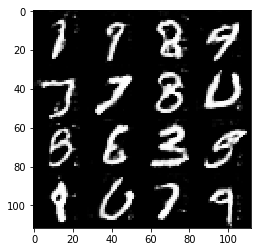

Timestamp 20170803-14-48-10.949 -  Epoch 2/2 -  Step 6510 -  D Loss: 0.4666 - G Loss: 3.0460
Timestamp 20170803-14-48-17.366 -  Epoch 2/2 -  Step 6520 -  D Loss: 0.4686 - G Loss: 2.4125
Timestamp 20170803-14-48-23.806 -  Epoch 2/2 -  Step 6530 -  D Loss: 0.5391 - G Loss: 2.4279
Timestamp 20170803-14-48-30.229 -  Epoch 2/2 -  Step 6540 -  D Loss: 0.5256 - G Loss: 4.5010
Timestamp 20170803-14-48-36.660 -  Epoch 2/2 -  Step 6550 -  D Loss: 0.7834 - G Loss: 1.7769
Timestamp 20170803-14-48-43.103 -  Epoch 2/2 -  Step 6560 -  D Loss: 0.6822 - G Loss: 1.6955
Timestamp 20170803-14-48-49.535 -  Epoch 2/2 -  Step 6570 -  D Loss: 0.7809 - G Loss: 1.5475
Timestamp 20170803-14-48-55.975 -  Epoch 2/2 -  Step 6580 -  D Loss: 0.5510 - G Loss: 2.1337
Timestamp 20170803-14-49-02.404 -  Epoch 2/2 -  Step 6590 -  D Loss: 1.0641 - G Loss: 1.6584
Timestamp 20170803-14-49-08.832 -  Epoch 2/2 -  Step 6600 -  D Loss: 0.6570 - G Loss: 1.6375


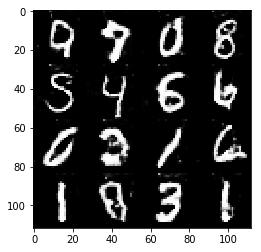

Timestamp 20170803-14-49-15.854 -  Epoch 2/2 -  Step 6610 -  D Loss: 0.5581 - G Loss: 2.6530
Timestamp 20170803-14-49-22.287 -  Epoch 2/2 -  Step 6620 -  D Loss: 0.5097 - G Loss: 2.9142
Timestamp 20170803-14-49-28.708 -  Epoch 2/2 -  Step 6630 -  D Loss: 1.1250 - G Loss: 1.0875
Timestamp 20170803-14-49-35.142 -  Epoch 2/2 -  Step 6640 -  D Loss: 0.5352 - G Loss: 3.1866
Timestamp 20170803-14-49-41.562 -  Epoch 2/2 -  Step 6650 -  D Loss: 0.4532 - G Loss: 1.9674
Timestamp 20170803-14-49-47.996 -  Epoch 2/2 -  Step 6660 -  D Loss: 1.4205 - G Loss: 0.6956
Timestamp 20170803-14-49-54.425 -  Epoch 2/2 -  Step 6670 -  D Loss: 0.6164 - G Loss: 1.6456
Timestamp 20170803-14-50-00.874 -  Epoch 2/2 -  Step 6680 -  D Loss: 0.5574 - G Loss: 2.3764
Timestamp 20170803-14-50-07.313 -  Epoch 2/2 -  Step 6690 -  D Loss: 0.6749 - G Loss: 2.2988
Timestamp 20170803-14-50-13.747 -  Epoch 2/2 -  Step 6700 -  D Loss: 0.5049 - G Loss: 2.7274


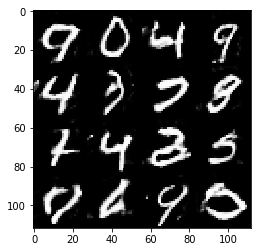

Timestamp 20170803-14-50-20.789 -  Epoch 2/2 -  Step 6710 -  D Loss: 0.5846 - G Loss: 2.7043
Timestamp 20170803-14-50-27.204 -  Epoch 2/2 -  Step 6720 -  D Loss: 0.5118 - G Loss: 3.4465
Timestamp 20170803-14-50-33.655 -  Epoch 2/2 -  Step 6730 -  D Loss: 0.5085 - G Loss: 2.2745
Timestamp 20170803-14-50-40.092 -  Epoch 2/2 -  Step 6740 -  D Loss: 0.6708 - G Loss: 1.8750
Timestamp 20170803-14-50-46.556 -  Epoch 2/2 -  Step 6750 -  D Loss: 0.8114 - G Loss: 1.9297
Timestamp 20170803-14-50-52.986 -  Epoch 2/2 -  Step 6760 -  D Loss: 0.5515 - G Loss: 3.1335
Timestamp 20170803-14-50-59.404 -  Epoch 2/2 -  Step 6770 -  D Loss: 0.6750 - G Loss: 3.3509
Timestamp 20170803-14-51-05.854 -  Epoch 2/2 -  Step 6780 -  D Loss: 0.4078 - G Loss: 3.7964
Timestamp 20170803-14-51-12.285 -  Epoch 2/2 -  Step 6790 -  D Loss: 0.6790 - G Loss: 2.4575
Timestamp 20170803-14-51-18.774 -  Epoch 2/2 -  Step 6800 -  D Loss: 0.7007 - G Loss: 1.6615


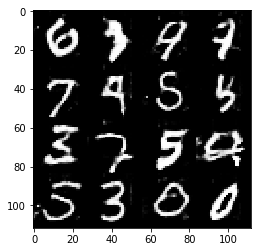

Timestamp 20170803-14-51-25.804 -  Epoch 2/2 -  Step 6810 -  D Loss: 0.4515 - G Loss: 2.9726
Timestamp 20170803-14-51-32.231 -  Epoch 2/2 -  Step 6820 -  D Loss: 0.9422 - G Loss: 1.9524
Timestamp 20170803-14-51-38.680 -  Epoch 2/2 -  Step 6830 -  D Loss: 0.5059 - G Loss: 2.3004
Timestamp 20170803-14-51-45.110 -  Epoch 2/2 -  Step 6840 -  D Loss: 0.5450 - G Loss: 2.4064
Timestamp 20170803-14-51-51.539 -  Epoch 2/2 -  Step 6850 -  D Loss: 0.8118 - G Loss: 1.4687
Timestamp 20170803-14-51-57.971 -  Epoch 2/2 -  Step 6860 -  D Loss: 0.8810 - G Loss: 1.1483
Timestamp 20170803-14-52-04.405 -  Epoch 2/2 -  Step 6870 -  D Loss: 0.8497 - G Loss: 1.0535
Timestamp 20170803-14-52-10.845 -  Epoch 2/2 -  Step 6880 -  D Loss: 0.5174 - G Loss: 2.1599
Timestamp 20170803-14-52-17.281 -  Epoch 2/2 -  Step 6890 -  D Loss: 0.5368 - G Loss: 1.7188
Timestamp 20170803-14-52-23.712 -  Epoch 2/2 -  Step 6900 -  D Loss: 0.8419 - G Loss: 0.8501


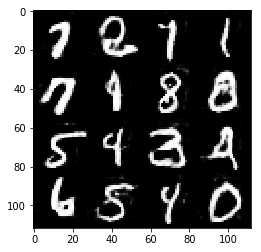

Timestamp 20170803-14-52-30.729 -  Epoch 2/2 -  Step 6910 -  D Loss: 0.6245 - G Loss: 2.5366
Timestamp 20170803-14-52-37.154 -  Epoch 2/2 -  Step 6920 -  D Loss: 0.8821 - G Loss: 1.2294
Timestamp 20170803-14-52-43.590 -  Epoch 2/2 -  Step 6930 -  D Loss: 0.5145 - G Loss: 2.5270
Timestamp 20170803-14-52-50.022 -  Epoch 2/2 -  Step 6940 -  D Loss: 0.6410 - G Loss: 1.5039
Timestamp 20170803-14-52-56.474 -  Epoch 2/2 -  Step 6950 -  D Loss: 0.6448 - G Loss: 2.9722
Timestamp 20170803-14-53-02.897 -  Epoch 2/2 -  Step 6960 -  D Loss: 0.6295 - G Loss: 2.4206
Timestamp 20170803-14-53-09.330 -  Epoch 2/2 -  Step 6970 -  D Loss: 0.6925 - G Loss: 1.9504
Timestamp 20170803-14-53-15.768 -  Epoch 2/2 -  Step 6980 -  D Loss: 1.0882 - G Loss: 4.2807
Timestamp 20170803-14-53-22.194 -  Epoch 2/2 -  Step 6990 -  D Loss: 0.7410 - G Loss: 1.3296
Timestamp 20170803-14-53-28.622 -  Epoch 2/2 -  Step 7000 -  D Loss: 1.3746 - G Loss: 0.6432


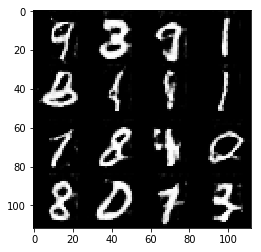

Timestamp 20170803-14-53-35.653 -  Epoch 2/2 -  Step 7010 -  D Loss: 0.5762 - G Loss: 1.7390
Timestamp 20170803-14-53-42.093 -  Epoch 2/2 -  Step 7020 -  D Loss: 0.8475 - G Loss: 1.5850
Timestamp 20170803-14-53-48.520 -  Epoch 2/2 -  Step 7030 -  D Loss: 0.4940 - G Loss: 2.7101
Timestamp 20170803-14-53-54.945 -  Epoch 2/2 -  Step 7040 -  D Loss: 0.4565 - G Loss: 2.5905
Timestamp 20170803-14-54-01.385 -  Epoch 2/2 -  Step 7050 -  D Loss: 0.4862 - G Loss: 2.9523
Timestamp 20170803-14-54-07.824 -  Epoch 2/2 -  Step 7060 -  D Loss: 0.5921 - G Loss: 2.2637
Timestamp 20170803-14-54-14.244 -  Epoch 2/2 -  Step 7070 -  D Loss: 0.5920 - G Loss: 1.3516
Timestamp 20170803-14-54-20.674 -  Epoch 2/2 -  Step 7080 -  D Loss: 0.4690 - G Loss: 2.7541
Timestamp 20170803-14-54-27.106 -  Epoch 2/2 -  Step 7090 -  D Loss: 1.0395 - G Loss: 1.1293
Timestamp 20170803-14-54-33.571 -  Epoch 2/2 -  Step 7100 -  D Loss: 0.4703 - G Loss: 2.7746


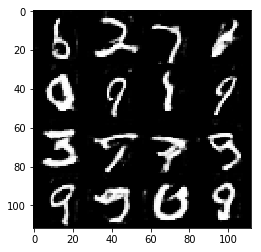

Timestamp 20170803-14-54-40.991 -  Epoch 2/2 -  Step 7110 -  D Loss: 0.5838 - G Loss: 2.9016
Timestamp 20170803-14-54-47.448 -  Epoch 2/2 -  Step 7120 -  D Loss: 0.4078 - G Loss: 2.6656
Timestamp 20170803-14-54-53.913 -  Epoch 2/2 -  Step 7130 -  D Loss: 0.7006 - G Loss: 0.8909
Timestamp 20170803-14-55-00.345 -  Epoch 2/2 -  Step 7140 -  D Loss: 0.5802 - G Loss: 1.2974
Timestamp 20170803-14-55-06.801 -  Epoch 2/2 -  Step 7150 -  D Loss: 0.6864 - G Loss: 1.8882
Timestamp 20170803-14-55-13.221 -  Epoch 2/2 -  Step 7160 -  D Loss: 0.5250 - G Loss: 2.1731
Timestamp 20170803-14-55-19.664 -  Epoch 2/2 -  Step 7170 -  D Loss: 0.5923 - G Loss: 2.0117
Timestamp 20170803-14-55-26.101 -  Epoch 2/2 -  Step 7180 -  D Loss: 0.5405 - G Loss: 2.5429
Timestamp 20170803-14-55-32.544 -  Epoch 2/2 -  Step 7190 -  D Loss: 0.4413 - G Loss: 4.6781
Timestamp 20170803-14-55-38.994 -  Epoch 2/2 -  Step 7200 -  D Loss: 0.6001 - G Loss: 3.2485


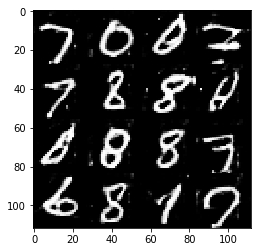

Timestamp 20170803-14-55-46.021 -  Epoch 2/2 -  Step 7210 -  D Loss: 0.6354 - G Loss: 2.1805
Timestamp 20170803-14-55-52.456 -  Epoch 2/2 -  Step 7220 -  D Loss: 0.5431 - G Loss: 3.9852
Timestamp 20170803-14-55-58.897 -  Epoch 2/2 -  Step 7230 -  D Loss: 1.2701 - G Loss: 3.6713
Timestamp 20170803-14-56-05.324 -  Epoch 2/2 -  Step 7240 -  D Loss: 0.6935 - G Loss: 1.9047
Timestamp 20170803-14-56-11.767 -  Epoch 2/2 -  Step 7250 -  D Loss: 0.7273 - G Loss: 4.2043
Timestamp 20170803-14-56-18.199 -  Epoch 2/2 -  Step 7260 -  D Loss: 0.6663 - G Loss: 1.9519
Timestamp 20170803-14-56-24.636 -  Epoch 2/2 -  Step 7270 -  D Loss: 0.8448 - G Loss: 1.9471
Timestamp 20170803-14-56-31.069 -  Epoch 2/2 -  Step 7280 -  D Loss: 0.4394 - G Loss: 2.1367
Timestamp 20170803-14-56-37.515 -  Epoch 2/2 -  Step 7290 -  D Loss: 1.0634 - G Loss: 0.5477
Timestamp 20170803-14-56-43.966 -  Epoch 2/2 -  Step 7300 -  D Loss: 0.5146 - G Loss: 2.9754


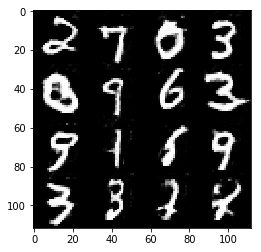

Timestamp 20170803-14-56-50.999 -  Epoch 2/2 -  Step 7310 -  D Loss: 0.5119 - G Loss: 2.0234
Timestamp 20170803-14-56-57.463 -  Epoch 2/2 -  Step 7320 -  D Loss: 1.2676 - G Loss: 1.4098
Timestamp 20170803-14-57-03.891 -  Epoch 2/2 -  Step 7330 -  D Loss: 0.4869 - G Loss: 1.6649
Timestamp 20170803-14-57-10.318 -  Epoch 2/2 -  Step 7340 -  D Loss: 0.5974 - G Loss: 1.9000
Timestamp 20170803-14-57-16.747 -  Epoch 2/2 -  Step 7350 -  D Loss: 0.3866 - G Loss: 2.6194
Timestamp 20170803-14-57-23.186 -  Epoch 2/2 -  Step 7360 -  D Loss: 0.8110 - G Loss: 1.4508
Timestamp 20170803-14-57-29.621 -  Epoch 2/2 -  Step 7370 -  D Loss: 0.8054 - G Loss: 1.2940
Timestamp 20170803-14-57-36.079 -  Epoch 2/2 -  Step 7380 -  D Loss: 0.5148 - G Loss: 1.9835
Timestamp 20170803-14-57-42.509 -  Epoch 2/2 -  Step 7390 -  D Loss: 0.5257 - G Loss: 1.9596
Timestamp 20170803-14-57-48.942 -  Epoch 2/2 -  Step 7400 -  D Loss: 1.0657 - G Loss: 2.6381


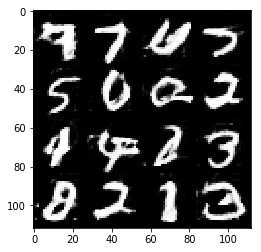

Timestamp 20170803-14-57-55.971 -  Epoch 2/2 -  Step 7410 -  D Loss: 0.6701 - G Loss: 1.9778
Timestamp 20170803-14-58-02.414 -  Epoch 2/2 -  Step 7420 -  D Loss: 0.4191 - G Loss: 4.3820
Timestamp 20170803-14-58-08.841 -  Epoch 2/2 -  Step 7430 -  D Loss: 0.5975 - G Loss: 1.3252
Timestamp 20170803-14-58-15.271 -  Epoch 2/2 -  Step 7440 -  D Loss: 0.5746 - G Loss: 2.0609
Timestamp 20170803-14-58-21.718 -  Epoch 2/2 -  Step 7450 -  D Loss: 0.7439 - G Loss: 1.4211
Timestamp 20170803-14-58-28.154 -  Epoch 2/2 -  Step 7460 -  D Loss: 0.5716 - G Loss: 2.5055
Timestamp 20170803-14-58-34.575 -  Epoch 2/2 -  Step 7470 -  D Loss: 0.8000 - G Loss: 2.7589
Timestamp 20170803-14-58-41.004 -  Epoch 2/2 -  Step 7480 -  D Loss: 0.8770 - G Loss: 1.2260
Timestamp 20170803-14-58-47.423 -  Epoch 2/2 -  Step 7490 -  D Loss: 0.4368 - G Loss: 2.4685
Timestamp 20170803-14-58-53.878 -  Epoch 2/2 -  Step 7500 -  D Loss: 0.5288 - G Loss: 3.8213


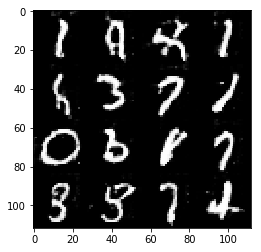

In [14]:
batch_size = 16
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5

tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Timestamp 20170803-14-59-09.896 -  Epoch 1/1 -  Step 10 -  D Loss: 0.6397 - G Loss: 2.0504
Timestamp 20170803-14-59-18.085 -  Epoch 1/1 -  Step 20 -  D Loss: 1.4562 - G Loss: 12.1536
Timestamp 20170803-14-59-25.688 -  Epoch 1/1 -  Step 30 -  D Loss: 3.0998 - G Loss: 0.0961
Timestamp 20170803-14-59-32.965 -  Epoch 1/1 -  Step 40 -  D Loss: 0.4701 - G Loss: 11.1154
Timestamp 20170803-14-59-40.209 -  Epoch 1/1 -  Step 50 -  D Loss: 0.7029 - G Loss: 10.7419
Timestamp 20170803-14-59-47.695 -  Epoch 1/1 -  Step 60 -  D Loss: 2.6902 - G Loss: 0.2693
Timestamp 20170803-14-59-55.104 -  Epoch 1/1 -  Step 70 -  D Loss: 1.0841 - G Loss: 1.7201
Timestamp 20170803-15-00-02.443 -  Epoch 1/1 -  Step 80 -  D Loss: 0.5870 - G Loss: 3.4213
Timestamp 20170803-15-00-09.682 -  Epoch 1/1 -  Step 90 -  D Loss: 0.6004 - G Loss: 8.1487
Timestamp 20170803-15-00-17.147 -  Epoch 1/1 -  Step 100 -  D Loss: 0.4530 - G Loss: 4.0199


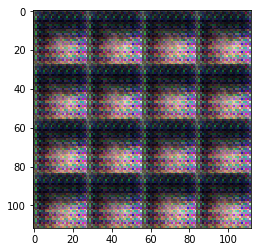

Timestamp 20170803-15-00-24.733 -  Epoch 1/1 -  Step 110 -  D Loss: 0.6937 - G Loss: 2.1250
Timestamp 20170803-15-00-32.039 -  Epoch 1/1 -  Step 120 -  D Loss: 0.6201 - G Loss: 2.9607
Timestamp 20170803-15-00-39.438 -  Epoch 1/1 -  Step 130 -  D Loss: 0.6079 - G Loss: 2.1566
Timestamp 20170803-15-00-46.821 -  Epoch 1/1 -  Step 140 -  D Loss: 1.3110 - G Loss: 0.9751
Timestamp 20170803-15-00-54.367 -  Epoch 1/1 -  Step 150 -  D Loss: 0.4667 - G Loss: 3.1103
Timestamp 20170803-15-01-01.987 -  Epoch 1/1 -  Step 160 -  D Loss: 0.5187 - G Loss: 2.5501
Timestamp 20170803-15-01-09.489 -  Epoch 1/1 -  Step 170 -  D Loss: 0.4189 - G Loss: 3.2119
Timestamp 20170803-15-01-16.836 -  Epoch 1/1 -  Step 180 -  D Loss: 0.4515 - G Loss: 2.7347
Timestamp 20170803-15-01-24.357 -  Epoch 1/1 -  Step 190 -  D Loss: 0.4489 - G Loss: 3.3500
Timestamp 20170803-15-01-31.901 -  Epoch 1/1 -  Step 200 -  D Loss: 0.6087 - G Loss: 2.0175


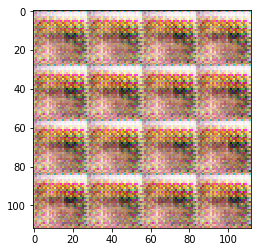

Timestamp 20170803-15-01-39.974 -  Epoch 1/1 -  Step 210 -  D Loss: 0.3832 - G Loss: 3.6749
Timestamp 20170803-15-01-47.794 -  Epoch 1/1 -  Step 220 -  D Loss: 0.3822 - G Loss: 3.7479
Timestamp 20170803-15-01-55.512 -  Epoch 1/1 -  Step 230 -  D Loss: 0.4315 - G Loss: 3.8403
Timestamp 20170803-15-02-03.136 -  Epoch 1/1 -  Step 240 -  D Loss: 0.3894 - G Loss: 3.7713
Timestamp 20170803-15-02-10.789 -  Epoch 1/1 -  Step 250 -  D Loss: 0.4201 - G Loss: 3.8035
Timestamp 20170803-15-02-18.591 -  Epoch 1/1 -  Step 260 -  D Loss: 0.4360 - G Loss: 4.0239
Timestamp 20170803-15-02-25.907 -  Epoch 1/1 -  Step 270 -  D Loss: 0.4089 - G Loss: 3.9752
Timestamp 20170803-15-02-33.259 -  Epoch 1/1 -  Step 280 -  D Loss: 0.4709 - G Loss: 1.8158
Timestamp 20170803-15-02-40.957 -  Epoch 1/1 -  Step 290 -  D Loss: 0.4419 - G Loss: 4.1192
Timestamp 20170803-15-02-48.292 -  Epoch 1/1 -  Step 300 -  D Loss: 0.3728 - G Loss: 4.9171


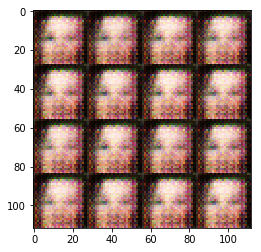

Timestamp 20170803-15-02-56.057 -  Epoch 1/1 -  Step 310 -  D Loss: 0.4212 - G Loss: 3.6149
Timestamp 20170803-15-03-03.215 -  Epoch 1/1 -  Step 320 -  D Loss: 0.3818 - G Loss: 4.2056
Timestamp 20170803-15-03-10.380 -  Epoch 1/1 -  Step 330 -  D Loss: 0.4396 - G Loss: 3.6399
Timestamp 20170803-15-03-17.553 -  Epoch 1/1 -  Step 340 -  D Loss: 0.3758 - G Loss: 3.8156
Timestamp 20170803-15-03-24.855 -  Epoch 1/1 -  Step 350 -  D Loss: 0.4465 - G Loss: 3.3076
Timestamp 20170803-15-03-32.226 -  Epoch 1/1 -  Step 360 -  D Loss: 0.3820 - G Loss: 3.9850
Timestamp 20170803-15-03-39.400 -  Epoch 1/1 -  Step 370 -  D Loss: 0.3777 - G Loss: 4.0273
Timestamp 20170803-15-03-46.785 -  Epoch 1/1 -  Step 380 -  D Loss: 0.3991 - G Loss: 3.4861
Timestamp 20170803-15-03-54.026 -  Epoch 1/1 -  Step 390 -  D Loss: 0.3962 - G Loss: 3.3368
Timestamp 20170803-15-04-01.188 -  Epoch 1/1 -  Step 400 -  D Loss: 0.3913 - G Loss: 3.2573


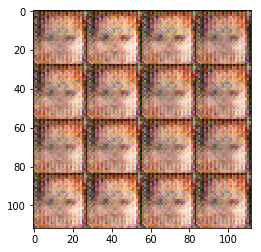

Timestamp 20170803-15-04-09.116 -  Epoch 1/1 -  Step 410 -  D Loss: 0.5340 - G Loss: 3.2912
Timestamp 20170803-15-04-16.376 -  Epoch 1/1 -  Step 420 -  D Loss: 0.8403 - G Loss: 1.4374
Timestamp 20170803-15-04-23.701 -  Epoch 1/1 -  Step 430 -  D Loss: 1.0421 - G Loss: 1.3815
Timestamp 20170803-15-04-30.883 -  Epoch 1/1 -  Step 440 -  D Loss: 0.6303 - G Loss: 1.8611
Timestamp 20170803-15-04-38.037 -  Epoch 1/1 -  Step 450 -  D Loss: 0.5812 - G Loss: 2.2738
Timestamp 20170803-15-04-45.471 -  Epoch 1/1 -  Step 460 -  D Loss: 0.8299 - G Loss: 2.6096
Timestamp 20170803-15-04-52.882 -  Epoch 1/1 -  Step 470 -  D Loss: 0.6298 - G Loss: 1.8553
Timestamp 20170803-15-05-00.335 -  Epoch 1/1 -  Step 480 -  D Loss: 0.5510 - G Loss: 2.6139
Timestamp 20170803-15-05-07.308 -  Epoch 1/1 -  Step 490 -  D Loss: 0.4582 - G Loss: 3.9950
Timestamp 20170803-15-05-14.360 -  Epoch 1/1 -  Step 500 -  D Loss: 0.5359 - G Loss: 2.9315


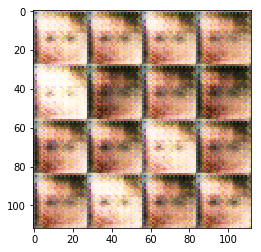

Timestamp 20170803-15-05-21.967 -  Epoch 1/1 -  Step 510 -  D Loss: 0.5125 - G Loss: 4.0990
Timestamp 20170803-15-05-28.981 -  Epoch 1/1 -  Step 520 -  D Loss: 0.5292 - G Loss: 2.2269
Timestamp 20170803-15-05-36.052 -  Epoch 1/1 -  Step 530 -  D Loss: 0.5568 - G Loss: 3.1952
Timestamp 20170803-15-05-43.118 -  Epoch 1/1 -  Step 540 -  D Loss: 0.4113 - G Loss: 5.2319
Timestamp 20170803-15-05-50.271 -  Epoch 1/1 -  Step 550 -  D Loss: 0.3961 - G Loss: 4.4600
Timestamp 20170803-15-05-57.325 -  Epoch 1/1 -  Step 560 -  D Loss: 0.4227 - G Loss: 3.4019
Timestamp 20170803-15-06-04.367 -  Epoch 1/1 -  Step 570 -  D Loss: 0.5521 - G Loss: 2.0763
Timestamp 20170803-15-06-11.915 -  Epoch 1/1 -  Step 580 -  D Loss: 0.5155 - G Loss: 2.1579
Timestamp 20170803-15-06-18.972 -  Epoch 1/1 -  Step 590 -  D Loss: 0.4049 - G Loss: 3.7223
Timestamp 20170803-15-06-26.086 -  Epoch 1/1 -  Step 600 -  D Loss: 0.4536 - G Loss: 4.1528


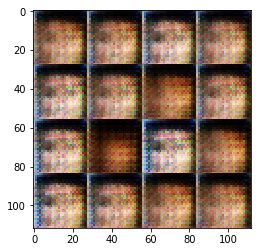

Timestamp 20170803-15-06-33.634 -  Epoch 1/1 -  Step 610 -  D Loss: 0.5064 - G Loss: 2.6120
Timestamp 20170803-15-06-40.676 -  Epoch 1/1 -  Step 620 -  D Loss: 0.3870 - G Loss: 4.4015
Timestamp 20170803-15-06-47.837 -  Epoch 1/1 -  Step 630 -  D Loss: 1.0867 - G Loss: 0.7419
Timestamp 20170803-15-06-55.070 -  Epoch 1/1 -  Step 640 -  D Loss: 0.5599 - G Loss: 2.1616
Timestamp 20170803-15-07-02.206 -  Epoch 1/1 -  Step 650 -  D Loss: 1.0593 - G Loss: 7.6563
Timestamp 20170803-15-07-09.439 -  Epoch 1/1 -  Step 660 -  D Loss: 0.4473 - G Loss: 2.8024
Timestamp 20170803-15-07-16.596 -  Epoch 1/1 -  Step 670 -  D Loss: 0.4511 - G Loss: 4.8523
Timestamp 20170803-15-07-23.667 -  Epoch 1/1 -  Step 680 -  D Loss: 0.8226 - G Loss: 1.0953
Timestamp 20170803-15-07-31.032 -  Epoch 1/1 -  Step 690 -  D Loss: 0.4176 - G Loss: 4.5788
Timestamp 20170803-15-07-38.201 -  Epoch 1/1 -  Step 700 -  D Loss: 0.8277 - G Loss: 1.5157


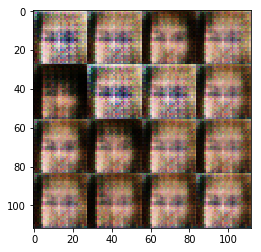

Timestamp 20170803-15-07-45.674 -  Epoch 1/1 -  Step 710 -  D Loss: 0.5553 - G Loss: 2.3572
Timestamp 20170803-15-07-52.735 -  Epoch 1/1 -  Step 720 -  D Loss: 1.0316 - G Loss: 5.7367
Timestamp 20170803-15-07-59.867 -  Epoch 1/1 -  Step 730 -  D Loss: 0.6409 - G Loss: 2.4078
Timestamp 20170803-15-08-06.989 -  Epoch 1/1 -  Step 740 -  D Loss: 0.5067 - G Loss: 2.9453
Timestamp 20170803-15-08-13.913 -  Epoch 1/1 -  Step 750 -  D Loss: 0.5613 - G Loss: 2.1877
Timestamp 20170803-15-08-20.653 -  Epoch 1/1 -  Step 760 -  D Loss: 1.4738 - G Loss: 0.6245
Timestamp 20170803-15-08-27.415 -  Epoch 1/1 -  Step 770 -  D Loss: 0.5687 - G Loss: 3.6045
Timestamp 20170803-15-08-34.145 -  Epoch 1/1 -  Step 780 -  D Loss: 0.4940 - G Loss: 3.2505
Timestamp 20170803-15-08-40.841 -  Epoch 1/1 -  Step 790 -  D Loss: 0.7011 - G Loss: 4.8994
Timestamp 20170803-15-08-47.586 -  Epoch 1/1 -  Step 800 -  D Loss: 0.5122 - G Loss: 2.4595


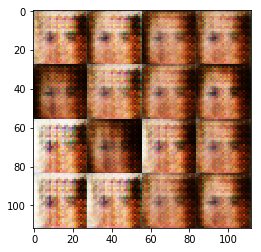

Timestamp 20170803-15-08-54.761 -  Epoch 1/1 -  Step 810 -  D Loss: 0.7855 - G Loss: 1.2419
Timestamp 20170803-15-09-01.633 -  Epoch 1/1 -  Step 820 -  D Loss: 1.0541 - G Loss: 0.8478
Timestamp 20170803-15-09-08.813 -  Epoch 1/1 -  Step 830 -  D Loss: 0.7632 - G Loss: 2.2477
Timestamp 20170803-15-09-15.808 -  Epoch 1/1 -  Step 840 -  D Loss: 0.7395 - G Loss: 1.4054
Timestamp 20170803-15-09-22.595 -  Epoch 1/1 -  Step 850 -  D Loss: 0.9164 - G Loss: 1.3984
Timestamp 20170803-15-09-29.519 -  Epoch 1/1 -  Step 860 -  D Loss: 0.5784 - G Loss: 2.8356
Timestamp 20170803-15-09-36.666 -  Epoch 1/1 -  Step 870 -  D Loss: 0.4619 - G Loss: 3.0155
Timestamp 20170803-15-09-43.447 -  Epoch 1/1 -  Step 880 -  D Loss: 0.6845 - G Loss: 1.4529
Timestamp 20170803-15-09-50.260 -  Epoch 1/1 -  Step 890 -  D Loss: 0.9617 - G Loss: 1.7102
Timestamp 20170803-15-09-57.227 -  Epoch 1/1 -  Step 900 -  D Loss: 0.5857 - G Loss: 2.0831


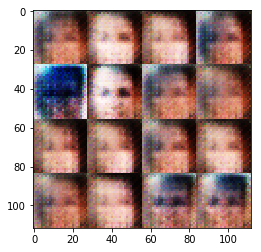

Timestamp 20170803-15-10-04.455 -  Epoch 1/1 -  Step 910 -  D Loss: 1.5436 - G Loss: 0.7767
Timestamp 20170803-15-10-11.291 -  Epoch 1/1 -  Step 920 -  D Loss: 0.5858 - G Loss: 2.5470
Timestamp 20170803-15-10-18.503 -  Epoch 1/1 -  Step 930 -  D Loss: 0.7365 - G Loss: 2.0325
Timestamp 20170803-15-10-25.286 -  Epoch 1/1 -  Step 940 -  D Loss: 0.6046 - G Loss: 2.8981
Timestamp 20170803-15-10-32.007 -  Epoch 1/1 -  Step 950 -  D Loss: 0.5148 - G Loss: 2.9536
Timestamp 20170803-15-10-38.844 -  Epoch 1/1 -  Step 960 -  D Loss: 0.7111 - G Loss: 3.0275
Timestamp 20170803-15-10-45.598 -  Epoch 1/1 -  Step 970 -  D Loss: 0.5409 - G Loss: 2.7974
Timestamp 20170803-15-10-52.443 -  Epoch 1/1 -  Step 980 -  D Loss: 0.5161 - G Loss: 2.5960
Timestamp 20170803-15-10-59.284 -  Epoch 1/1 -  Step 990 -  D Loss: 0.6697 - G Loss: 2.1663
Timestamp 20170803-15-11-06.216 -  Epoch 1/1 -  Step 1000 -  D Loss: 1.0446 - G Loss: 0.9367


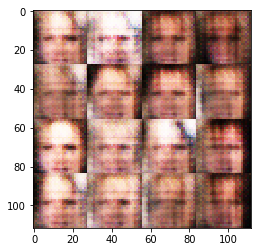

Timestamp 20170803-15-11-13.797 -  Epoch 1/1 -  Step 1010 -  D Loss: 0.8806 - G Loss: 5.1241
Timestamp 20170803-15-11-20.904 -  Epoch 1/1 -  Step 1020 -  D Loss: 0.8176 - G Loss: 1.4030
Timestamp 20170803-15-11-27.664 -  Epoch 1/1 -  Step 1030 -  D Loss: 0.6953 - G Loss: 3.8033
Timestamp 20170803-15-11-34.904 -  Epoch 1/1 -  Step 1040 -  D Loss: 0.4970 - G Loss: 3.0441
Timestamp 20170803-15-11-41.847 -  Epoch 1/1 -  Step 1050 -  D Loss: 0.6434 - G Loss: 2.0573
Timestamp 20170803-15-11-48.609 -  Epoch 1/1 -  Step 1060 -  D Loss: 1.0495 - G Loss: 3.2579
Timestamp 20170803-15-11-55.500 -  Epoch 1/1 -  Step 1070 -  D Loss: 0.6689 - G Loss: 2.2495
Timestamp 20170803-15-12-02.286 -  Epoch 1/1 -  Step 1080 -  D Loss: 0.6540 - G Loss: 2.1625
Timestamp 20170803-15-12-09.152 -  Epoch 1/1 -  Step 1090 -  D Loss: 0.5463 - G Loss: 2.3427
Timestamp 20170803-15-12-16.008 -  Epoch 1/1 -  Step 1100 -  D Loss: 0.8302 - G Loss: 1.5244


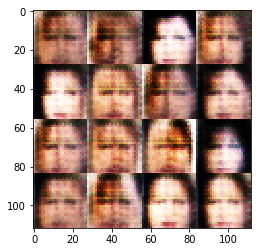

Timestamp 20170803-15-12-23.357 -  Epoch 1/1 -  Step 1110 -  D Loss: 1.0875 - G Loss: 1.0679
Timestamp 20170803-15-12-30.201 -  Epoch 1/1 -  Step 1120 -  D Loss: 0.9372 - G Loss: 1.0996
Timestamp 20170803-15-12-37.037 -  Epoch 1/1 -  Step 1130 -  D Loss: 0.8011 - G Loss: 1.9686
Timestamp 20170803-15-12-43.832 -  Epoch 1/1 -  Step 1140 -  D Loss: 0.9470 - G Loss: 1.1164
Timestamp 20170803-15-12-50.582 -  Epoch 1/1 -  Step 1150 -  D Loss: 0.5677 - G Loss: 2.1190
Timestamp 20170803-15-12-57.319 -  Epoch 1/1 -  Step 1160 -  D Loss: 0.5504 - G Loss: 2.6625
Timestamp 20170803-15-13-04.108 -  Epoch 1/1 -  Step 1170 -  D Loss: 0.5606 - G Loss: 2.0158
Timestamp 20170803-15-13-10.964 -  Epoch 1/1 -  Step 1180 -  D Loss: 1.0517 - G Loss: 1.1501
Timestamp 20170803-15-13-17.942 -  Epoch 1/1 -  Step 1190 -  D Loss: 0.6274 - G Loss: 1.7122
Timestamp 20170803-15-13-24.974 -  Epoch 1/1 -  Step 1200 -  D Loss: 0.7679 - G Loss: 2.2785


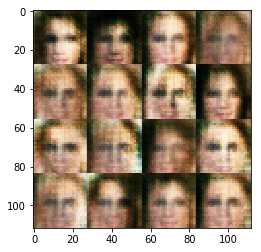

Timestamp 20170803-15-13-32.513 -  Epoch 1/1 -  Step 1210 -  D Loss: 1.0548 - G Loss: 1.1513
Timestamp 20170803-15-13-39.352 -  Epoch 1/1 -  Step 1220 -  D Loss: 0.5634 - G Loss: 2.5420
Timestamp 20170803-15-13-46.096 -  Epoch 1/1 -  Step 1230 -  D Loss: 0.6704 - G Loss: 2.0565
Timestamp 20170803-15-13-53.043 -  Epoch 1/1 -  Step 1240 -  D Loss: 0.5602 - G Loss: 2.8098
Timestamp 20170803-15-13-59.825 -  Epoch 1/1 -  Step 1250 -  D Loss: 0.7966 - G Loss: 1.3518
Timestamp 20170803-15-14-06.710 -  Epoch 1/1 -  Step 1260 -  D Loss: 1.1065 - G Loss: 1.2098
Timestamp 20170803-15-14-13.506 -  Epoch 1/1 -  Step 1270 -  D Loss: 0.6838 - G Loss: 3.1406
Timestamp 20170803-15-14-20.481 -  Epoch 1/1 -  Step 1280 -  D Loss: 0.7204 - G Loss: 2.3665
Timestamp 20170803-15-14-27.587 -  Epoch 1/1 -  Step 1290 -  D Loss: 1.1892 - G Loss: 0.8475
Timestamp 20170803-15-14-34.655 -  Epoch 1/1 -  Step 1300 -  D Loss: 0.7276 - G Loss: 1.4467


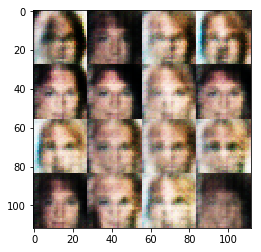

Timestamp 20170803-15-14-41.860 -  Epoch 1/1 -  Step 1310 -  D Loss: 0.8234 - G Loss: 1.6329
Timestamp 20170803-15-14-48.592 -  Epoch 1/1 -  Step 1320 -  D Loss: 0.7400 - G Loss: 1.1258
Timestamp 20170803-15-14-55.473 -  Epoch 1/1 -  Step 1330 -  D Loss: 0.6851 - G Loss: 2.1628
Timestamp 20170803-15-15-02.529 -  Epoch 1/1 -  Step 1340 -  D Loss: 0.4415 - G Loss: 2.8583
Timestamp 20170803-15-15-09.445 -  Epoch 1/1 -  Step 1350 -  D Loss: 0.6350 - G Loss: 3.2965
Timestamp 20170803-15-15-16.366 -  Epoch 1/1 -  Step 1360 -  D Loss: 0.8434 - G Loss: 1.9114
Timestamp 20170803-15-15-23.353 -  Epoch 1/1 -  Step 1370 -  D Loss: 0.8587 - G Loss: 1.7531
Timestamp 20170803-15-15-30.177 -  Epoch 1/1 -  Step 1380 -  D Loss: 0.6880 - G Loss: 2.1222
Timestamp 20170803-15-15-36.992 -  Epoch 1/1 -  Step 1390 -  D Loss: 0.7176 - G Loss: 2.2009
Timestamp 20170803-15-15-43.741 -  Epoch 1/1 -  Step 1400 -  D Loss: 0.6303 - G Loss: 2.8877


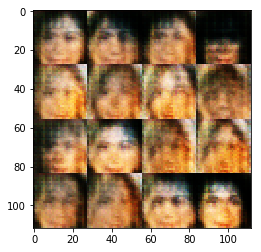

Timestamp 20170803-15-15-51.451 -  Epoch 1/1 -  Step 1410 -  D Loss: 0.5338 - G Loss: 4.4286
Timestamp 20170803-15-15-58.332 -  Epoch 1/1 -  Step 1420 -  D Loss: 0.8108 - G Loss: 1.4847
Timestamp 20170803-15-16-05.109 -  Epoch 1/1 -  Step 1430 -  D Loss: 0.7157 - G Loss: 1.6206
Timestamp 20170803-15-16-11.936 -  Epoch 1/1 -  Step 1440 -  D Loss: 0.7923 - G Loss: 1.6687
Timestamp 20170803-15-16-18.784 -  Epoch 1/1 -  Step 1450 -  D Loss: 0.7953 - G Loss: 3.2461
Timestamp 20170803-15-16-25.492 -  Epoch 1/1 -  Step 1460 -  D Loss: 1.0622 - G Loss: 0.9610
Timestamp 20170803-15-16-32.197 -  Epoch 1/1 -  Step 1470 -  D Loss: 0.8382 - G Loss: 1.2216
Timestamp 20170803-15-16-38.900 -  Epoch 1/1 -  Step 1480 -  D Loss: 0.7434 - G Loss: 1.6526
Timestamp 20170803-15-16-45.635 -  Epoch 1/1 -  Step 1490 -  D Loss: 0.8331 - G Loss: 1.5126
Timestamp 20170803-15-16-52.347 -  Epoch 1/1 -  Step 1500 -  D Loss: 0.5772 - G Loss: 3.0856


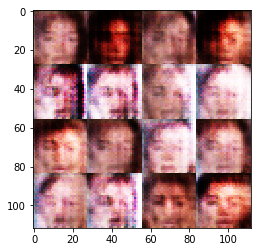

Timestamp 20170803-15-16-59.984 -  Epoch 1/1 -  Step 1510 -  D Loss: 0.6462 - G Loss: 2.5365
Timestamp 20170803-15-17-07.179 -  Epoch 1/1 -  Step 1520 -  D Loss: 0.7351 - G Loss: 1.5545
Timestamp 20170803-15-17-14.483 -  Epoch 1/1 -  Step 1530 -  D Loss: 0.7230 - G Loss: 4.8260
Timestamp 20170803-15-17-21.181 -  Epoch 1/1 -  Step 1540 -  D Loss: 0.5449 - G Loss: 2.4544
Timestamp 20170803-15-17-28.046 -  Epoch 1/1 -  Step 1550 -  D Loss: 0.6250 - G Loss: 2.2125
Timestamp 20170803-15-17-34.914 -  Epoch 1/1 -  Step 1560 -  D Loss: 0.7137 - G Loss: 2.3157
Timestamp 20170803-15-17-41.667 -  Epoch 1/1 -  Step 1570 -  D Loss: 0.8009 - G Loss: 4.0484
Timestamp 20170803-15-17-48.566 -  Epoch 1/1 -  Step 1580 -  D Loss: 0.9056 - G Loss: 1.6206
Timestamp 20170803-15-17-55.918 -  Epoch 1/1 -  Step 1590 -  D Loss: 0.5699 - G Loss: 2.3357
Timestamp 20170803-15-18-03.117 -  Epoch 1/1 -  Step 1600 -  D Loss: 0.5770 - G Loss: 1.9754


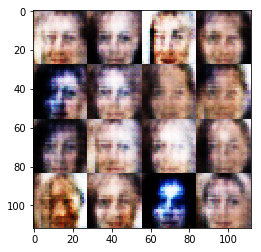

Timestamp 20170803-15-18-10.931 -  Epoch 1/1 -  Step 1610 -  D Loss: 0.6248 - G Loss: 2.0522
Timestamp 20170803-15-18-17.862 -  Epoch 1/1 -  Step 1620 -  D Loss: 0.8511 - G Loss: 1.1673
Timestamp 20170803-15-18-24.593 -  Epoch 1/1 -  Step 1630 -  D Loss: 0.8061 - G Loss: 1.2712
Timestamp 20170803-15-18-31.385 -  Epoch 1/1 -  Step 1640 -  D Loss: 0.6872 - G Loss: 2.1408
Timestamp 20170803-15-18-38.187 -  Epoch 1/1 -  Step 1650 -  D Loss: 0.8438 - G Loss: 2.0297
Timestamp 20170803-15-18-45.691 -  Epoch 1/1 -  Step 1660 -  D Loss: 0.7110 - G Loss: 2.2395
Timestamp 20170803-15-18-52.904 -  Epoch 1/1 -  Step 1670 -  D Loss: 0.6375 - G Loss: 1.6407
Timestamp 20170803-15-18-59.870 -  Epoch 1/1 -  Step 1680 -  D Loss: 0.9888 - G Loss: 1.2870
Timestamp 20170803-15-19-06.745 -  Epoch 1/1 -  Step 1690 -  D Loss: 0.5099 - G Loss: 2.8271
Timestamp 20170803-15-19-13.572 -  Epoch 1/1 -  Step 1700 -  D Loss: 0.6926 - G Loss: 3.6984


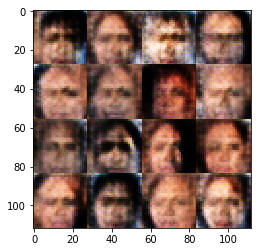

Timestamp 20170803-15-19-20.842 -  Epoch 1/1 -  Step 1710 -  D Loss: 0.8266 - G Loss: 1.1920
Timestamp 20170803-15-19-27.786 -  Epoch 1/1 -  Step 1720 -  D Loss: 0.5386 - G Loss: 3.9279
Timestamp 20170803-15-19-34.801 -  Epoch 1/1 -  Step 1730 -  D Loss: 0.5766 - G Loss: 1.8611
Timestamp 20170803-15-19-41.825 -  Epoch 1/1 -  Step 1740 -  D Loss: 1.1445 - G Loss: 0.7749
Timestamp 20170803-15-19-48.870 -  Epoch 1/1 -  Step 1750 -  D Loss: 0.7668 - G Loss: 1.4374
Timestamp 20170803-15-19-55.718 -  Epoch 1/1 -  Step 1760 -  D Loss: 1.3720 - G Loss: 0.7628
Timestamp 20170803-15-20-03.115 -  Epoch 1/1 -  Step 1770 -  D Loss: 1.0132 - G Loss: 1.2206
Timestamp 20170803-15-20-09.972 -  Epoch 1/1 -  Step 1780 -  D Loss: 0.6776 - G Loss: 2.3847
Timestamp 20170803-15-20-16.878 -  Epoch 1/1 -  Step 1790 -  D Loss: 0.5987 - G Loss: 2.0638
Timestamp 20170803-15-20-23.913 -  Epoch 1/1 -  Step 1800 -  D Loss: 0.7396 - G Loss: 2.5212


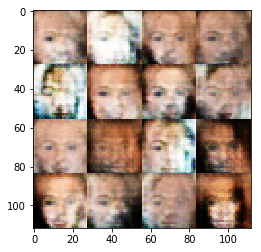

Timestamp 20170803-15-20-31.347 -  Epoch 1/1 -  Step 1810 -  D Loss: 0.7314 - G Loss: 2.7981
Timestamp 20170803-15-20-38.297 -  Epoch 1/1 -  Step 1820 -  D Loss: 0.8808 - G Loss: 1.8352
Timestamp 20170803-15-20-45.068 -  Epoch 1/1 -  Step 1830 -  D Loss: 1.0337 - G Loss: 0.8881
Timestamp 20170803-15-20-51.920 -  Epoch 1/1 -  Step 1840 -  D Loss: 0.7301 - G Loss: 1.7056
Timestamp 20170803-15-20-58.686 -  Epoch 1/1 -  Step 1850 -  D Loss: 0.8575 - G Loss: 1.2895
Timestamp 20170803-15-21-05.473 -  Epoch 1/1 -  Step 1860 -  D Loss: 0.6695 - G Loss: 2.6902
Timestamp 20170803-15-21-12.373 -  Epoch 1/1 -  Step 1870 -  D Loss: 1.1858 - G Loss: 0.8536
Timestamp 20170803-15-21-19.277 -  Epoch 1/1 -  Step 1880 -  D Loss: 0.6840 - G Loss: 2.0661
Timestamp 20170803-15-21-26.014 -  Epoch 1/1 -  Step 1890 -  D Loss: 0.9651 - G Loss: 1.7176
Timestamp 20170803-15-21-32.748 -  Epoch 1/1 -  Step 1900 -  D Loss: 0.6535 - G Loss: 2.4003


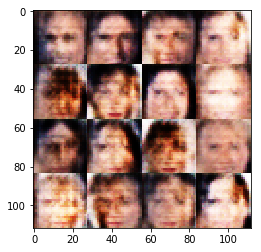

Timestamp 20170803-15-21-39.999 -  Epoch 1/1 -  Step 1910 -  D Loss: 0.7831 - G Loss: 1.7362
Timestamp 20170803-15-21-46.810 -  Epoch 1/1 -  Step 1920 -  D Loss: 0.8495 - G Loss: 2.6996
Timestamp 20170803-15-21-53.553 -  Epoch 1/1 -  Step 1930 -  D Loss: 0.7240 - G Loss: 1.6475
Timestamp 20170803-15-22-00.421 -  Epoch 1/1 -  Step 1940 -  D Loss: 1.0686 - G Loss: 0.9094
Timestamp 20170803-15-22-07.687 -  Epoch 1/1 -  Step 1950 -  D Loss: 0.8864 - G Loss: 1.5711
Timestamp 20170803-15-22-14.505 -  Epoch 1/1 -  Step 1960 -  D Loss: 0.9696 - G Loss: 1.5789
Timestamp 20170803-15-22-21.361 -  Epoch 1/1 -  Step 1970 -  D Loss: 0.6773 - G Loss: 1.6561
Timestamp 20170803-15-22-28.129 -  Epoch 1/1 -  Step 1980 -  D Loss: 0.7420 - G Loss: 2.1497
Timestamp 20170803-15-22-35.061 -  Epoch 1/1 -  Step 1990 -  D Loss: 1.0240 - G Loss: 1.1817
Timestamp 20170803-15-22-41.856 -  Epoch 1/1 -  Step 2000 -  D Loss: 0.6511 - G Loss: 2.9077


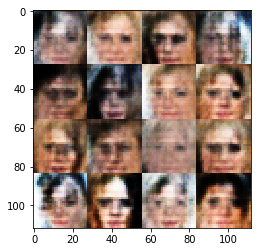

Timestamp 20170803-15-22-49.098 -  Epoch 1/1 -  Step 2010 -  D Loss: 0.9559 - G Loss: 0.9759
Timestamp 20170803-15-22-56.099 -  Epoch 1/1 -  Step 2020 -  D Loss: 0.6056 - G Loss: 2.2291
Timestamp 20170803-15-23-03.184 -  Epoch 1/1 -  Step 2030 -  D Loss: 0.8989 - G Loss: 2.5250
Timestamp 20170803-15-23-09.969 -  Epoch 1/1 -  Step 2040 -  D Loss: 0.7581 - G Loss: 1.5909
Timestamp 20170803-15-23-16.775 -  Epoch 1/1 -  Step 2050 -  D Loss: 0.7240 - G Loss: 1.3724
Timestamp 20170803-15-23-23.469 -  Epoch 1/1 -  Step 2060 -  D Loss: 0.8192 - G Loss: 1.9233
Timestamp 20170803-15-23-30.190 -  Epoch 1/1 -  Step 2070 -  D Loss: 0.7346 - G Loss: 1.7511
Timestamp 20170803-15-23-36.965 -  Epoch 1/1 -  Step 2080 -  D Loss: 0.6527 - G Loss: 1.7238
Timestamp 20170803-15-23-43.680 -  Epoch 1/1 -  Step 2090 -  D Loss: 0.4932 - G Loss: 2.7616
Timestamp 20170803-15-23-50.717 -  Epoch 1/1 -  Step 2100 -  D Loss: 0.7484 - G Loss: 1.2937


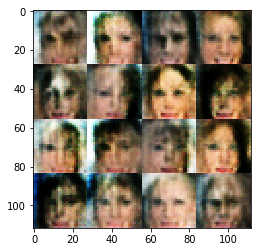

Timestamp 20170803-15-23-59.166 -  Epoch 1/1 -  Step 2110 -  D Loss: 0.7256 - G Loss: 1.4895
Timestamp 20170803-15-24-06.852 -  Epoch 1/1 -  Step 2120 -  D Loss: 0.5558 - G Loss: 2.4592
Timestamp 20170803-15-24-14.709 -  Epoch 1/1 -  Step 2130 -  D Loss: 0.8681 - G Loss: 1.3707
Timestamp 20170803-15-24-22.123 -  Epoch 1/1 -  Step 2140 -  D Loss: 1.3369 - G Loss: 0.8766
Timestamp 20170803-15-24-29.044 -  Epoch 1/1 -  Step 2150 -  D Loss: 1.0572 - G Loss: 0.7034
Timestamp 20170803-15-24-36.063 -  Epoch 1/1 -  Step 2160 -  D Loss: 0.8565 - G Loss: 1.3687
Timestamp 20170803-15-24-42.908 -  Epoch 1/1 -  Step 2170 -  D Loss: 0.7337 - G Loss: 2.2542
Timestamp 20170803-15-24-49.754 -  Epoch 1/1 -  Step 2180 -  D Loss: 0.7614 - G Loss: 2.2025
Timestamp 20170803-15-24-56.577 -  Epoch 1/1 -  Step 2190 -  D Loss: 0.9587 - G Loss: 1.1479
Timestamp 20170803-15-25-03.514 -  Epoch 1/1 -  Step 2200 -  D Loss: 0.9225 - G Loss: 4.0570


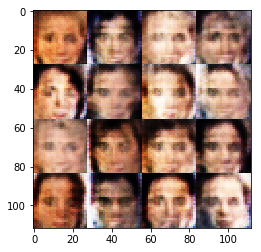

Timestamp 20170803-15-25-10.839 -  Epoch 1/1 -  Step 2210 -  D Loss: 0.4693 - G Loss: 3.8470
Timestamp 20170803-15-25-17.838 -  Epoch 1/1 -  Step 2220 -  D Loss: 1.0774 - G Loss: 0.7759
Timestamp 20170803-15-25-24.906 -  Epoch 1/1 -  Step 2230 -  D Loss: 0.7414 - G Loss: 1.8371
Timestamp 20170803-15-25-31.961 -  Epoch 1/1 -  Step 2240 -  D Loss: 0.9159 - G Loss: 1.4472
Timestamp 20170803-15-25-38.841 -  Epoch 1/1 -  Step 2250 -  D Loss: 0.6275 - G Loss: 2.7388
Timestamp 20170803-15-25-45.833 -  Epoch 1/1 -  Step 2260 -  D Loss: 0.6555 - G Loss: 2.4824
Timestamp 20170803-15-25-52.529 -  Epoch 1/1 -  Step 2270 -  D Loss: 0.5918 - G Loss: 2.3236
Timestamp 20170803-15-25-59.245 -  Epoch 1/1 -  Step 2280 -  D Loss: 0.5433 - G Loss: 2.2992
Timestamp 20170803-15-26-05.997 -  Epoch 1/1 -  Step 2290 -  D Loss: 0.6503 - G Loss: 2.4353
Timestamp 20170803-15-26-12.717 -  Epoch 1/1 -  Step 2300 -  D Loss: 1.2522 - G Loss: 0.7816


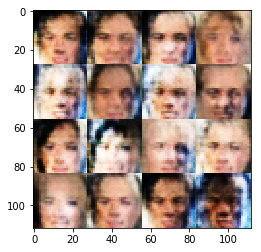

Timestamp 20170803-15-26-19.906 -  Epoch 1/1 -  Step 2310 -  D Loss: 1.9593 - G Loss: 0.4478
Timestamp 20170803-15-26-26.656 -  Epoch 1/1 -  Step 2320 -  D Loss: 0.7264 - G Loss: 1.5570
Timestamp 20170803-15-26-33.812 -  Epoch 1/1 -  Step 2330 -  D Loss: 0.8171 - G Loss: 1.5651
Timestamp 20170803-15-26-40.767 -  Epoch 1/1 -  Step 2340 -  D Loss: 0.8272 - G Loss: 2.7150
Timestamp 20170803-15-26-47.756 -  Epoch 1/1 -  Step 2350 -  D Loss: 0.7054 - G Loss: 3.3189
Timestamp 20170803-15-26-54.696 -  Epoch 1/1 -  Step 2360 -  D Loss: 0.6674 - G Loss: 1.4387
Timestamp 20170803-15-27-01.621 -  Epoch 1/1 -  Step 2370 -  D Loss: 0.5934 - G Loss: 1.9725
Timestamp 20170803-15-27-08.359 -  Epoch 1/1 -  Step 2380 -  D Loss: 0.7454 - G Loss: 1.7719
Timestamp 20170803-15-27-15.142 -  Epoch 1/1 -  Step 2390 -  D Loss: 1.0542 - G Loss: 1.0063
Timestamp 20170803-15-27-21.861 -  Epoch 1/1 -  Step 2400 -  D Loss: 0.5701 - G Loss: 2.2744


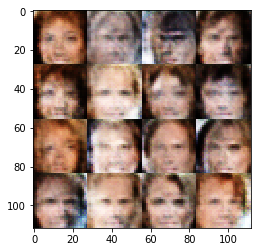

Timestamp 20170803-15-27-29.242 -  Epoch 1/1 -  Step 2410 -  D Loss: 0.5389 - G Loss: 2.7078
Timestamp 20170803-15-27-36.188 -  Epoch 1/1 -  Step 2420 -  D Loss: 0.8382 - G Loss: 1.3069
Timestamp 20170803-15-27-43.265 -  Epoch 1/1 -  Step 2430 -  D Loss: 0.7916 - G Loss: 1.4879
Timestamp 20170803-15-27-50.359 -  Epoch 1/1 -  Step 2440 -  D Loss: 0.8771 - G Loss: 2.0765
Timestamp 20170803-15-27-57.282 -  Epoch 1/1 -  Step 2450 -  D Loss: 1.2553 - G Loss: 0.7386
Timestamp 20170803-15-28-04.344 -  Epoch 1/1 -  Step 2460 -  D Loss: 1.3838 - G Loss: 0.5995
Timestamp 20170803-15-28-11.405 -  Epoch 1/1 -  Step 2470 -  D Loss: 0.6318 - G Loss: 1.8455
Timestamp 20170803-15-28-18.298 -  Epoch 1/1 -  Step 2480 -  D Loss: 1.5105 - G Loss: 0.7558
Timestamp 20170803-15-28-25.042 -  Epoch 1/1 -  Step 2490 -  D Loss: 0.6765 - G Loss: 1.5362
Timestamp 20170803-15-28-31.923 -  Epoch 1/1 -  Step 2500 -  D Loss: 0.7295 - G Loss: 3.0476


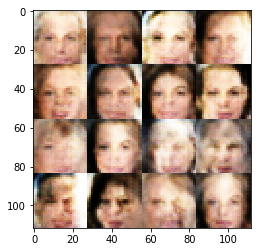

Timestamp 20170803-15-28-39.133 -  Epoch 1/1 -  Step 2510 -  D Loss: 0.9877 - G Loss: 1.3945
Timestamp 20170803-15-28-45.859 -  Epoch 1/1 -  Step 2520 -  D Loss: 0.5244 - G Loss: 2.4010
Timestamp 20170803-15-28-52.583 -  Epoch 1/1 -  Step 2530 -  D Loss: 1.2284 - G Loss: 3.8859
Timestamp 20170803-15-29-00.152 -  Epoch 1/1 -  Step 2540 -  D Loss: 0.6746 - G Loss: 2.8438
Timestamp 20170803-15-29-07.547 -  Epoch 1/1 -  Step 2550 -  D Loss: 0.7434 - G Loss: 3.0276
Timestamp 20170803-15-29-14.465 -  Epoch 1/1 -  Step 2560 -  D Loss: 0.6219 - G Loss: 2.0052
Timestamp 20170803-15-29-21.448 -  Epoch 1/1 -  Step 2570 -  D Loss: 0.9978 - G Loss: 1.3215
Timestamp 20170803-15-29-28.423 -  Epoch 1/1 -  Step 2580 -  D Loss: 0.8871 - G Loss: 1.4408
Timestamp 20170803-15-29-35.375 -  Epoch 1/1 -  Step 2590 -  D Loss: 0.7982 - G Loss: 2.5152
Timestamp 20170803-15-29-42.191 -  Epoch 1/1 -  Step 2600 -  D Loss: 0.6794 - G Loss: 1.9158


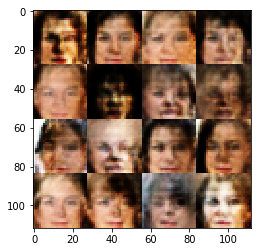

Timestamp 20170803-15-29-49.454 -  Epoch 1/1 -  Step 2610 -  D Loss: 0.8919 - G Loss: 1.4903
Timestamp 20170803-15-29-56.154 -  Epoch 1/1 -  Step 2620 -  D Loss: 0.5184 - G Loss: 2.7129
Timestamp 20170803-15-30-03.043 -  Epoch 1/1 -  Step 2630 -  D Loss: 1.2341 - G Loss: 0.8150
Timestamp 20170803-15-30-10.314 -  Epoch 1/1 -  Step 2640 -  D Loss: 0.6964 - G Loss: 1.8839
Timestamp 20170803-15-30-17.342 -  Epoch 1/1 -  Step 2650 -  D Loss: 0.4938 - G Loss: 2.4662
Timestamp 20170803-15-30-24.275 -  Epoch 1/1 -  Step 2660 -  D Loss: 0.6590 - G Loss: 2.2527
Timestamp 20170803-15-30-31.283 -  Epoch 1/1 -  Step 2670 -  D Loss: 0.7259 - G Loss: 1.8116
Timestamp 20170803-15-30-38.069 -  Epoch 1/1 -  Step 2680 -  D Loss: 0.7873 - G Loss: 1.2249
Timestamp 20170803-15-30-44.854 -  Epoch 1/1 -  Step 2690 -  D Loss: 1.7666 - G Loss: 0.2654
Timestamp 20170803-15-30-51.643 -  Epoch 1/1 -  Step 2700 -  D Loss: 0.7217 - G Loss: 1.2690


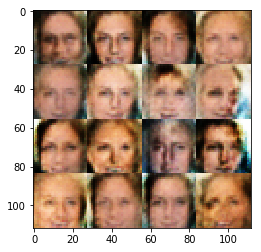

Timestamp 20170803-15-30-59.123 -  Epoch 1/1 -  Step 2710 -  D Loss: 0.6387 - G Loss: 1.8515
Timestamp 20170803-15-31-06.020 -  Epoch 1/1 -  Step 2720 -  D Loss: 0.8449 - G Loss: 1.5118
Timestamp 20170803-15-31-13.165 -  Epoch 1/1 -  Step 2730 -  D Loss: 0.7882 - G Loss: 1.1784
Timestamp 20170803-15-31-20.181 -  Epoch 1/1 -  Step 2740 -  D Loss: 0.6730 - G Loss: 1.7942
Timestamp 20170803-15-31-27.146 -  Epoch 1/1 -  Step 2750 -  D Loss: 1.5051 - G Loss: 0.6142
Timestamp 20170803-15-31-34.190 -  Epoch 1/1 -  Step 2760 -  D Loss: 0.7603 - G Loss: 1.3329
Timestamp 20170803-15-31-41.242 -  Epoch 1/1 -  Step 2770 -  D Loss: 1.0947 - G Loss: 1.1443
Timestamp 20170803-15-31-48.204 -  Epoch 1/1 -  Step 2780 -  D Loss: 1.0179 - G Loss: 1.1404
Timestamp 20170803-15-31-55.114 -  Epoch 1/1 -  Step 2790 -  D Loss: 0.6787 - G Loss: 1.6976
Timestamp 20170803-15-32-01.884 -  Epoch 1/1 -  Step 2800 -  D Loss: 0.8216 - G Loss: 1.4657


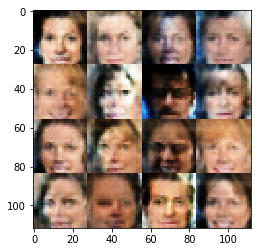

Timestamp 20170803-15-32-09.441 -  Epoch 1/1 -  Step 2810 -  D Loss: 0.7607 - G Loss: 2.5201
Timestamp 20170803-15-32-16.187 -  Epoch 1/1 -  Step 2820 -  D Loss: 0.8580 - G Loss: 1.3905
Timestamp 20170803-15-32-23.150 -  Epoch 1/1 -  Step 2830 -  D Loss: 0.7372 - G Loss: 1.7485
Timestamp 20170803-15-32-29.874 -  Epoch 1/1 -  Step 2840 -  D Loss: 0.9451 - G Loss: 1.2822
Timestamp 20170803-15-32-36.656 -  Epoch 1/1 -  Step 2850 -  D Loss: 1.2822 - G Loss: 0.6345
Timestamp 20170803-15-32-43.361 -  Epoch 1/1 -  Step 2860 -  D Loss: 0.8621 - G Loss: 1.8910
Timestamp 20170803-15-32-50.064 -  Epoch 1/1 -  Step 2870 -  D Loss: 0.6299 - G Loss: 3.1326
Timestamp 20170803-15-32-56.842 -  Epoch 1/1 -  Step 2880 -  D Loss: 1.0328 - G Loss: 1.1756
Timestamp 20170803-15-33-03.706 -  Epoch 1/1 -  Step 2890 -  D Loss: 0.7395 - G Loss: 1.6619
Timestamp 20170803-15-33-10.426 -  Epoch 1/1 -  Step 2900 -  D Loss: 0.9317 - G Loss: 1.8388


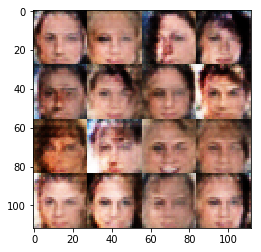

Timestamp 20170803-15-33-18.348 -  Epoch 1/1 -  Step 2910 -  D Loss: 0.4708 - G Loss: 3.3157
Timestamp 20170803-15-33-25.472 -  Epoch 1/1 -  Step 2920 -  D Loss: 0.9302 - G Loss: 1.7506
Timestamp 20170803-15-33-32.417 -  Epoch 1/1 -  Step 2930 -  D Loss: 0.7482 - G Loss: 1.6806
Timestamp 20170803-15-33-39.353 -  Epoch 1/1 -  Step 2940 -  D Loss: 0.8147 - G Loss: 1.4563
Timestamp 20170803-15-33-46.395 -  Epoch 1/1 -  Step 2950 -  D Loss: 0.7885 - G Loss: 1.3329
Timestamp 20170803-15-33-53.233 -  Epoch 1/1 -  Step 2960 -  D Loss: 0.8854 - G Loss: 1.8191
Timestamp 20170803-15-34-00.184 -  Epoch 1/1 -  Step 2970 -  D Loss: 0.8338 - G Loss: 1.4260
Timestamp 20170803-15-34-06.961 -  Epoch 1/1 -  Step 2980 -  D Loss: 0.8683 - G Loss: 2.5782
Timestamp 20170803-15-34-13.708 -  Epoch 1/1 -  Step 2990 -  D Loss: 0.7491 - G Loss: 2.6441
Timestamp 20170803-15-34-20.572 -  Epoch 1/1 -  Step 3000 -  D Loss: 0.7060 - G Loss: 1.9622


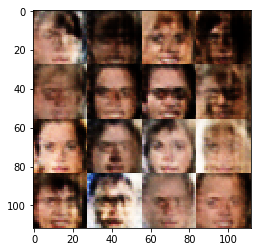

Timestamp 20170803-15-34-27.882 -  Epoch 1/1 -  Step 3010 -  D Loss: 0.7009 - G Loss: 2.1822
Timestamp 20170803-15-34-34.848 -  Epoch 1/1 -  Step 3020 -  D Loss: 0.5704 - G Loss: 2.1848
Timestamp 20170803-15-34-41.910 -  Epoch 1/1 -  Step 3030 -  D Loss: 0.7980 - G Loss: 1.5899
Timestamp 20170803-15-34-48.816 -  Epoch 1/1 -  Step 3040 -  D Loss: 0.8716 - G Loss: 1.4161
Timestamp 20170803-15-34-55.681 -  Epoch 1/1 -  Step 3050 -  D Loss: 0.7694 - G Loss: 2.0275
Timestamp 20170803-15-35-02.390 -  Epoch 1/1 -  Step 3060 -  D Loss: 0.7916 - G Loss: 2.1642
Timestamp 20170803-15-35-09.103 -  Epoch 1/1 -  Step 3070 -  D Loss: 0.9200 - G Loss: 1.3341
Timestamp 20170803-15-35-15.893 -  Epoch 1/1 -  Step 3080 -  D Loss: 0.6765 - G Loss: 1.8875
Timestamp 20170803-15-35-22.729 -  Epoch 1/1 -  Step 3090 -  D Loss: 0.9766 - G Loss: 1.1658
Timestamp 20170803-15-35-29.481 -  Epoch 1/1 -  Step 3100 -  D Loss: 1.3370 - G Loss: 0.6494


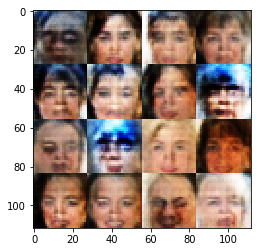

Timestamp 20170803-15-35-36.728 -  Epoch 1/1 -  Step 3110 -  D Loss: 0.4918 - G Loss: 2.6842
Timestamp 20170803-15-35-43.721 -  Epoch 1/1 -  Step 3120 -  D Loss: 1.1694 - G Loss: 0.7506
Timestamp 20170803-15-35-50.746 -  Epoch 1/1 -  Step 3130 -  D Loss: 0.7808 - G Loss: 1.5015
Timestamp 20170803-15-35-57.684 -  Epoch 1/1 -  Step 3140 -  D Loss: 0.8281 - G Loss: 1.5001
Timestamp 20170803-15-36-04.676 -  Epoch 1/1 -  Step 3150 -  D Loss: 0.7669 - G Loss: 1.2910
Timestamp 20170803-15-36-11.537 -  Epoch 1/1 -  Step 3160 -  D Loss: 1.1324 - G Loss: 0.8593
Timestamp 20170803-15-36-18.524 -  Epoch 1/1 -  Step 3170 -  D Loss: 0.9462 - G Loss: 1.0938
Timestamp 20170803-15-36-25.392 -  Epoch 1/1 -  Step 3180 -  D Loss: 0.6960 - G Loss: 2.1974
Timestamp 20170803-15-36-32.191 -  Epoch 1/1 -  Step 3190 -  D Loss: 0.6057 - G Loss: 1.7921
Timestamp 20170803-15-36-38.938 -  Epoch 1/1 -  Step 3200 -  D Loss: 0.7134 - G Loss: 2.6077


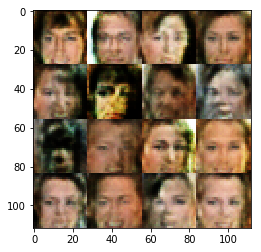

Timestamp 20170803-15-36-46.287 -  Epoch 1/1 -  Step 3210 -  D Loss: 0.6522 - G Loss: 1.8181
Timestamp 20170803-15-36-53.261 -  Epoch 1/1 -  Step 3220 -  D Loss: 0.4348 - G Loss: 3.2746
Timestamp 20170803-15-37-00.201 -  Epoch 1/1 -  Step 3230 -  D Loss: 0.5188 - G Loss: 2.5880
Timestamp 20170803-15-37-06.938 -  Epoch 1/1 -  Step 3240 -  D Loss: 0.6800 - G Loss: 2.2871
Timestamp 20170803-15-37-13.706 -  Epoch 1/1 -  Step 3250 -  D Loss: 0.9809 - G Loss: 3.3376
Timestamp 20170803-15-37-20.482 -  Epoch 1/1 -  Step 3260 -  D Loss: 1.1347 - G Loss: 1.1032
Timestamp 20170803-15-37-27.492 -  Epoch 1/1 -  Step 3270 -  D Loss: 0.9424 - G Loss: 0.9970
Timestamp 20170803-15-37-34.502 -  Epoch 1/1 -  Step 3280 -  D Loss: 1.5708 - G Loss: 3.7065
Timestamp 20170803-15-37-41.195 -  Epoch 1/1 -  Step 3290 -  D Loss: 1.1900 - G Loss: 3.9517
Timestamp 20170803-15-37-48.387 -  Epoch 1/1 -  Step 3300 -  D Loss: 0.6524 - G Loss: 2.3875


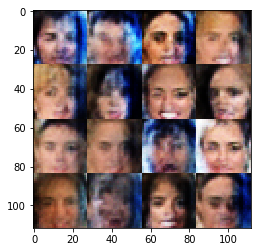

Timestamp 20170803-15-37-55.852 -  Epoch 1/1 -  Step 3310 -  D Loss: 0.8024 - G Loss: 1.2391
Timestamp 20170803-15-38-02.874 -  Epoch 1/1 -  Step 3320 -  D Loss: 0.6645 - G Loss: 1.4545
Timestamp 20170803-15-38-09.654 -  Epoch 1/1 -  Step 3330 -  D Loss: 0.7203 - G Loss: 2.1063
Timestamp 20170803-15-38-16.353 -  Epoch 1/1 -  Step 3340 -  D Loss: 0.8410 - G Loss: 1.6951
Timestamp 20170803-15-38-23.077 -  Epoch 1/1 -  Step 3350 -  D Loss: 0.7343 - G Loss: 1.9392
Timestamp 20170803-15-38-29.917 -  Epoch 1/1 -  Step 3360 -  D Loss: 0.8701 - G Loss: 2.7469
Timestamp 20170803-15-38-36.687 -  Epoch 1/1 -  Step 3370 -  D Loss: 0.5041 - G Loss: 2.2840
Timestamp 20170803-15-38-43.393 -  Epoch 1/1 -  Step 3380 -  D Loss: 0.5879 - G Loss: 1.8059
Timestamp 20170803-15-38-50.084 -  Epoch 1/1 -  Step 3390 -  D Loss: 0.5266 - G Loss: 2.4266
Timestamp 20170803-15-38-56.837 -  Epoch 1/1 -  Step 3400 -  D Loss: 1.3454 - G Loss: 1.0487


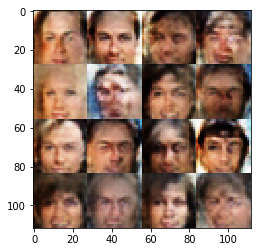

Timestamp 20170803-15-39-04.181 -  Epoch 1/1 -  Step 3410 -  D Loss: 0.4805 - G Loss: 3.0922
Timestamp 20170803-15-39-11.182 -  Epoch 1/1 -  Step 3420 -  D Loss: 0.6594 - G Loss: 2.3456
Timestamp 20170803-15-39-18.341 -  Epoch 1/1 -  Step 3430 -  D Loss: 1.0176 - G Loss: 1.2216
Timestamp 20170803-15-39-25.220 -  Epoch 1/1 -  Step 3440 -  D Loss: 0.6641 - G Loss: 2.9484
Timestamp 20170803-15-39-32.244 -  Epoch 1/1 -  Step 3450 -  D Loss: 0.6584 - G Loss: 3.2481
Timestamp 20170803-15-39-39.243 -  Epoch 1/1 -  Step 3460 -  D Loss: 0.8654 - G Loss: 1.0299
Timestamp 20170803-15-39-46.213 -  Epoch 1/1 -  Step 3470 -  D Loss: 0.7040 - G Loss: 1.9442
Timestamp 20170803-15-39-53.078 -  Epoch 1/1 -  Step 3480 -  D Loss: 0.8553 - G Loss: 1.3510
Timestamp 20170803-15-40-00.001 -  Epoch 1/1 -  Step 3490 -  D Loss: 0.5921 - G Loss: 2.0829
Timestamp 20170803-15-40-07.050 -  Epoch 1/1 -  Step 3500 -  D Loss: 1.3018 - G Loss: 0.7182


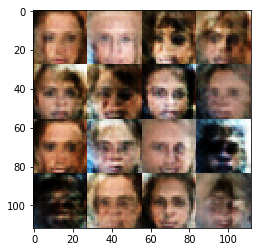

Timestamp 20170803-15-40-14.960 -  Epoch 1/1 -  Step 3510 -  D Loss: 0.6394 - G Loss: 2.1812
Timestamp 20170803-15-40-21.810 -  Epoch 1/1 -  Step 3520 -  D Loss: 0.6870 - G Loss: 2.0211
Timestamp 20170803-15-40-28.698 -  Epoch 1/1 -  Step 3530 -  D Loss: 1.0087 - G Loss: 1.0445
Timestamp 20170803-15-40-35.847 -  Epoch 1/1 -  Step 3540 -  D Loss: 1.1318 - G Loss: 2.3018
Timestamp 20170803-15-40-42.913 -  Epoch 1/1 -  Step 3550 -  D Loss: 0.9080 - G Loss: 1.3206
Timestamp 20170803-15-40-50.127 -  Epoch 1/1 -  Step 3560 -  D Loss: 1.0502 - G Loss: 0.8557
Timestamp 20170803-15-40-56.989 -  Epoch 1/1 -  Step 3570 -  D Loss: 0.8546 - G Loss: 3.1552
Timestamp 20170803-15-41-03.915 -  Epoch 1/1 -  Step 3580 -  D Loss: 0.8004 - G Loss: 1.0819
Timestamp 20170803-15-41-10.913 -  Epoch 1/1 -  Step 3590 -  D Loss: 0.7925 - G Loss: 1.2746
Timestamp 20170803-15-41-18.126 -  Epoch 1/1 -  Step 3600 -  D Loss: 0.5905 - G Loss: 2.2164


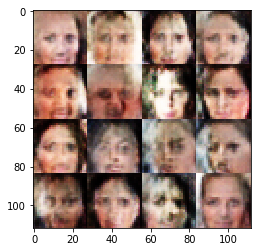

Timestamp 20170803-15-41-25.703 -  Epoch 1/1 -  Step 3610 -  D Loss: 1.2884 - G Loss: 0.7541
Timestamp 20170803-15-41-32.480 -  Epoch 1/1 -  Step 3620 -  D Loss: 0.9419 - G Loss: 2.5499
Timestamp 20170803-15-41-39.305 -  Epoch 1/1 -  Step 3630 -  D Loss: 0.5938 - G Loss: 1.9809
Timestamp 20170803-15-41-46.281 -  Epoch 1/1 -  Step 3640 -  D Loss: 0.4839 - G Loss: 2.3460
Timestamp 20170803-15-41-53.210 -  Epoch 1/1 -  Step 3650 -  D Loss: 1.1338 - G Loss: 0.7798
Timestamp 20170803-15-42-00.256 -  Epoch 1/1 -  Step 3660 -  D Loss: 1.4225 - G Loss: 0.6275
Timestamp 20170803-15-42-07.209 -  Epoch 1/1 -  Step 3670 -  D Loss: 0.7548 - G Loss: 1.3032
Timestamp 20170803-15-42-14.336 -  Epoch 1/1 -  Step 3680 -  D Loss: 1.0522 - G Loss: 0.9200
Timestamp 20170803-15-42-21.300 -  Epoch 1/1 -  Step 3690 -  D Loss: 0.9539 - G Loss: 0.8792
Timestamp 20170803-15-42-28.305 -  Epoch 1/1 -  Step 3700 -  D Loss: 0.6638 - G Loss: 2.7486


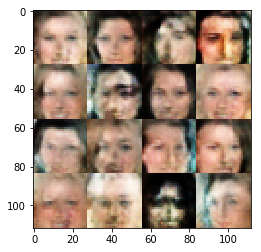

Timestamp 20170803-15-42-35.781 -  Epoch 1/1 -  Step 3710 -  D Loss: 0.9968 - G Loss: 1.7855
Timestamp 20170803-15-42-42.781 -  Epoch 1/1 -  Step 3720 -  D Loss: 0.5183 - G Loss: 3.0646
Timestamp 20170803-15-42-49.488 -  Epoch 1/1 -  Step 3730 -  D Loss: 0.6341 - G Loss: 1.9960
Timestamp 20170803-15-42-56.295 -  Epoch 1/1 -  Step 3740 -  D Loss: 0.7407 - G Loss: 1.7965
Timestamp 20170803-15-43-03.052 -  Epoch 1/1 -  Step 3750 -  D Loss: 0.7128 - G Loss: 1.4660
Timestamp 20170803-15-43-10.156 -  Epoch 1/1 -  Step 3760 -  D Loss: 0.4862 - G Loss: 2.4960
Timestamp 20170803-15-43-17.285 -  Epoch 1/1 -  Step 3770 -  D Loss: 0.4567 - G Loss: 3.2218
Timestamp 20170803-15-43-24.284 -  Epoch 1/1 -  Step 3780 -  D Loss: 0.6791 - G Loss: 1.5223
Timestamp 20170803-15-43-31.335 -  Epoch 1/1 -  Step 3790 -  D Loss: 0.9376 - G Loss: 2.2897
Timestamp 20170803-15-43-38.473 -  Epoch 1/1 -  Step 3800 -  D Loss: 1.0824 - G Loss: 0.7015


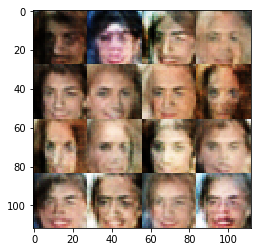

Timestamp 20170803-15-43-46.505 -  Epoch 1/1 -  Step 3810 -  D Loss: 0.5361 - G Loss: 2.2109
Timestamp 20170803-15-43-53.924 -  Epoch 1/1 -  Step 3820 -  D Loss: 0.5546 - G Loss: 3.4303
Timestamp 20170803-15-44-01.129 -  Epoch 1/1 -  Step 3830 -  D Loss: 0.9544 - G Loss: 2.0582
Timestamp 20170803-15-44-08.316 -  Epoch 1/1 -  Step 3840 -  D Loss: 0.7582 - G Loss: 2.9819
Timestamp 20170803-15-44-15.180 -  Epoch 1/1 -  Step 3850 -  D Loss: 0.6764 - G Loss: 1.3167
Timestamp 20170803-15-44-22.317 -  Epoch 1/1 -  Step 3860 -  D Loss: 0.9302 - G Loss: 1.1170
Timestamp 20170803-15-44-29.277 -  Epoch 1/1 -  Step 3870 -  D Loss: 0.8953 - G Loss: 0.9683
Timestamp 20170803-15-44-35.964 -  Epoch 1/1 -  Step 3880 -  D Loss: 1.3040 - G Loss: 0.7617
Timestamp 20170803-15-44-43.124 -  Epoch 1/1 -  Step 3890 -  D Loss: 0.7685 - G Loss: 3.2532
Timestamp 20170803-15-44-50.164 -  Epoch 1/1 -  Step 3900 -  D Loss: 1.5081 - G Loss: 5.2009


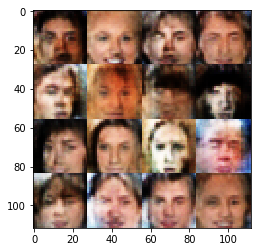

Timestamp 20170803-15-44-57.612 -  Epoch 1/1 -  Step 3910 -  D Loss: 0.8172 - G Loss: 1.2910
Timestamp 20170803-15-45-05.083 -  Epoch 1/1 -  Step 3920 -  D Loss: 0.9264 - G Loss: 1.1699
Timestamp 20170803-15-45-12.319 -  Epoch 1/1 -  Step 3930 -  D Loss: 0.6452 - G Loss: 1.7557
Timestamp 20170803-15-45-19.658 -  Epoch 1/1 -  Step 3940 -  D Loss: 0.6321 - G Loss: 1.9813
Timestamp 20170803-15-45-27.095 -  Epoch 1/1 -  Step 3950 -  D Loss: 0.8067 - G Loss: 1.2438
Timestamp 20170803-15-45-34.355 -  Epoch 1/1 -  Step 3960 -  D Loss: 0.5926 - G Loss: 2.1290
Timestamp 20170803-15-45-41.747 -  Epoch 1/1 -  Step 3970 -  D Loss: 1.5429 - G Loss: 0.5766
Timestamp 20170803-15-45-48.859 -  Epoch 1/1 -  Step 3980 -  D Loss: 1.1920 - G Loss: 0.7798
Timestamp 20170803-15-45-55.570 -  Epoch 1/1 -  Step 3990 -  D Loss: 0.6973 - G Loss: 3.2576
Timestamp 20170803-15-46-02.313 -  Epoch 1/1 -  Step 4000 -  D Loss: 0.4649 - G Loss: 2.3581


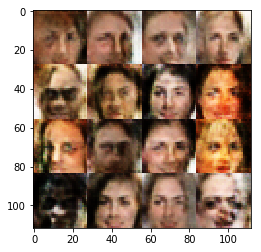

Timestamp 20170803-15-46-09.594 -  Epoch 1/1 -  Step 4010 -  D Loss: 1.2013 - G Loss: 0.9325
Timestamp 20170803-15-46-16.338 -  Epoch 1/1 -  Step 4020 -  D Loss: 0.4673 - G Loss: 2.4967
Timestamp 20170803-15-46-23.194 -  Epoch 1/1 -  Step 4030 -  D Loss: 1.0091 - G Loss: 1.2748
Timestamp 20170803-15-46-30.509 -  Epoch 1/1 -  Step 4040 -  D Loss: 1.1362 - G Loss: 0.8654
Timestamp 20170803-15-46-37.853 -  Epoch 1/1 -  Step 4050 -  D Loss: 0.7368 - G Loss: 1.2844
Timestamp 20170803-15-46-44.924 -  Epoch 1/1 -  Step 4060 -  D Loss: 0.9911 - G Loss: 2.9294
Timestamp 20170803-15-46-51.703 -  Epoch 1/1 -  Step 4070 -  D Loss: 1.1450 - G Loss: 0.8762
Timestamp 20170803-15-46-58.498 -  Epoch 1/1 -  Step 4080 -  D Loss: 0.7351 - G Loss: 1.4200
Timestamp 20170803-15-47-05.263 -  Epoch 1/1 -  Step 4090 -  D Loss: 0.8862 - G Loss: 0.9843
Timestamp 20170803-15-47-12.041 -  Epoch 1/1 -  Step 4100 -  D Loss: 0.8634 - G Loss: 1.8028


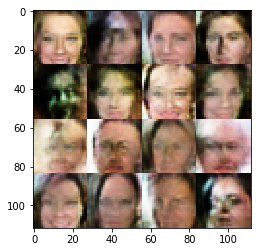

Timestamp 20170803-15-47-19.560 -  Epoch 1/1 -  Step 4110 -  D Loss: 0.7211 - G Loss: 2.4900
Timestamp 20170803-15-47-26.444 -  Epoch 1/1 -  Step 4120 -  D Loss: 0.7055 - G Loss: 2.6584
Timestamp 20170803-15-47-33.223 -  Epoch 1/1 -  Step 4130 -  D Loss: 0.8265 - G Loss: 2.9264
Timestamp 20170803-15-47-40.083 -  Epoch 1/1 -  Step 4140 -  D Loss: 0.9560 - G Loss: 1.0868
Timestamp 20170803-15-47-47.114 -  Epoch 1/1 -  Step 4150 -  D Loss: 0.8315 - G Loss: 0.9805
Timestamp 20170803-15-47-53.990 -  Epoch 1/1 -  Step 4160 -  D Loss: 0.9045 - G Loss: 2.2906
Timestamp 20170803-15-48-00.926 -  Epoch 1/1 -  Step 4170 -  D Loss: 0.4995 - G Loss: 2.1421
Timestamp 20170803-15-48-07.872 -  Epoch 1/1 -  Step 4180 -  D Loss: 0.5838 - G Loss: 2.2844
Timestamp 20170803-15-48-14.636 -  Epoch 1/1 -  Step 4190 -  D Loss: 0.9212 - G Loss: 3.4560
Timestamp 20170803-15-48-21.375 -  Epoch 1/1 -  Step 4200 -  D Loss: 0.7901 - G Loss: 1.5964


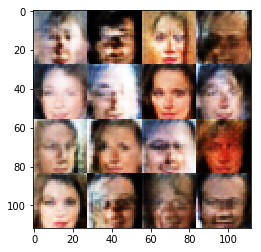

Timestamp 20170803-15-48-28.638 -  Epoch 1/1 -  Step 4210 -  D Loss: 0.6302 - G Loss: 2.0886
Timestamp 20170803-15-48-35.565 -  Epoch 1/1 -  Step 4220 -  D Loss: 0.6996 - G Loss: 1.9338
Timestamp 20170803-15-48-42.286 -  Epoch 1/1 -  Step 4230 -  D Loss: 0.6903 - G Loss: 1.6813
Timestamp 20170803-15-48-49.005 -  Epoch 1/1 -  Step 4240 -  D Loss: 0.9110 - G Loss: 1.2725
Timestamp 20170803-15-48-55.737 -  Epoch 1/1 -  Step 4250 -  D Loss: 0.8152 - G Loss: 0.9809
Timestamp 20170803-15-49-02.609 -  Epoch 1/1 -  Step 4260 -  D Loss: 0.7898 - G Loss: 2.2909
Timestamp 20170803-15-49-09.602 -  Epoch 1/1 -  Step 4270 -  D Loss: 0.9740 - G Loss: 1.3221
Timestamp 20170803-15-49-16.596 -  Epoch 1/1 -  Step 4280 -  D Loss: 0.7204 - G Loss: 2.4292
Timestamp 20170803-15-49-23.512 -  Epoch 1/1 -  Step 4290 -  D Loss: 1.6739 - G Loss: 0.4070
Timestamp 20170803-15-49-30.213 -  Epoch 1/1 -  Step 4300 -  D Loss: 0.8491 - G Loss: 0.9132


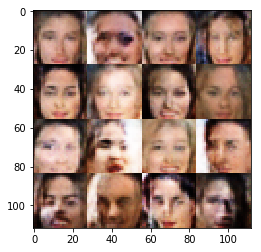

Timestamp 20170803-15-49-37.486 -  Epoch 1/1 -  Step 4310 -  D Loss: 1.2423 - G Loss: 0.7859
Timestamp 20170803-15-49-44.346 -  Epoch 1/1 -  Step 4320 -  D Loss: 0.5985 - G Loss: 2.4675
Timestamp 20170803-15-49-51.430 -  Epoch 1/1 -  Step 4330 -  D Loss: 0.5272 - G Loss: 2.3609
Timestamp 20170803-15-49-58.204 -  Epoch 1/1 -  Step 4340 -  D Loss: 0.5889 - G Loss: 1.8013
Timestamp 20170803-15-50-04.917 -  Epoch 1/1 -  Step 4350 -  D Loss: 0.7273 - G Loss: 2.6935
Timestamp 20170803-15-50-11.686 -  Epoch 1/1 -  Step 4360 -  D Loss: 0.6688 - G Loss: 1.4710
Timestamp 20170803-15-50-18.444 -  Epoch 1/1 -  Step 4370 -  D Loss: 0.5258 - G Loss: 2.5835
Timestamp 20170803-15-50-25.674 -  Epoch 1/1 -  Step 4380 -  D Loss: 0.7786 - G Loss: 1.2419
Timestamp 20170803-15-50-32.459 -  Epoch 1/1 -  Step 4390 -  D Loss: 0.9600 - G Loss: 1.1313
Timestamp 20170803-15-50-39.136 -  Epoch 1/1 -  Step 4400 -  D Loss: 0.6790 - G Loss: 2.3698


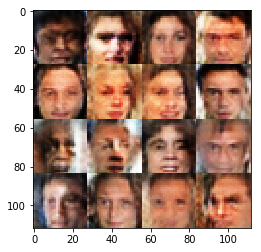

Timestamp 20170803-15-50-46.477 -  Epoch 1/1 -  Step 4410 -  D Loss: 1.4118 - G Loss: 3.9968
Timestamp 20170803-15-50-53.163 -  Epoch 1/1 -  Step 4420 -  D Loss: 0.7194 - G Loss: 1.5344
Timestamp 20170803-15-51-00.114 -  Epoch 1/1 -  Step 4430 -  D Loss: 1.0311 - G Loss: 1.0527
Timestamp 20170803-15-51-07.677 -  Epoch 1/1 -  Step 4440 -  D Loss: 1.0515 - G Loss: 1.3399
Timestamp 20170803-15-51-14.736 -  Epoch 1/1 -  Step 4450 -  D Loss: 1.3059 - G Loss: 0.5736
Timestamp 20170803-15-51-21.475 -  Epoch 1/1 -  Step 4460 -  D Loss: 0.6844 - G Loss: 3.2093
Timestamp 20170803-15-51-28.253 -  Epoch 1/1 -  Step 4470 -  D Loss: 0.4098 - G Loss: 4.2663
Timestamp 20170803-15-51-35.089 -  Epoch 1/1 -  Step 4480 -  D Loss: 0.8097 - G Loss: 1.3040
Timestamp 20170803-15-51-42.191 -  Epoch 1/1 -  Step 4490 -  D Loss: 0.6190 - G Loss: 1.8772
Timestamp 20170803-15-51-48.909 -  Epoch 1/1 -  Step 4500 -  D Loss: 1.0470 - G Loss: 1.3911


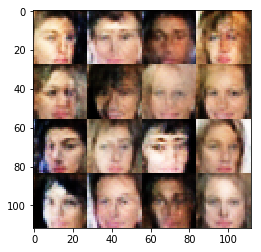

Timestamp 20170803-15-51-56.191 -  Epoch 1/1 -  Step 4510 -  D Loss: 1.1071 - G Loss: 1.1649
Timestamp 20170803-15-52-03.064 -  Epoch 1/1 -  Step 4520 -  D Loss: 0.7618 - G Loss: 1.5761
Timestamp 20170803-15-52-09.794 -  Epoch 1/1 -  Step 4530 -  D Loss: 1.1794 - G Loss: 1.1829
Timestamp 20170803-15-52-16.650 -  Epoch 1/1 -  Step 4540 -  D Loss: 0.6723 - G Loss: 2.9291
Timestamp 20170803-15-52-23.570 -  Epoch 1/1 -  Step 4550 -  D Loss: 0.7496 - G Loss: 1.6426
Timestamp 20170803-15-52-30.281 -  Epoch 1/1 -  Step 4560 -  D Loss: 0.3904 - G Loss: 5.0740
Timestamp 20170803-15-52-37.465 -  Epoch 1/1 -  Step 4570 -  D Loss: 0.5962 - G Loss: 2.5320
Timestamp 20170803-15-52-44.598 -  Epoch 1/1 -  Step 4580 -  D Loss: 0.6442 - G Loss: 3.0359
Timestamp 20170803-15-52-51.539 -  Epoch 1/1 -  Step 4590 -  D Loss: 0.8783 - G Loss: 1.2579
Timestamp 20170803-15-52-58.254 -  Epoch 1/1 -  Step 4600 -  D Loss: 1.0538 - G Loss: 0.8658


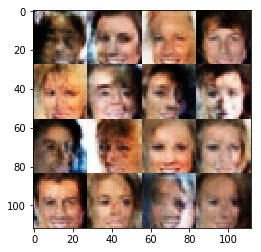

Timestamp 20170803-15-53-05.598 -  Epoch 1/1 -  Step 4610 -  D Loss: 0.6948 - G Loss: 1.1875
Timestamp 20170803-15-53-12.319 -  Epoch 1/1 -  Step 4620 -  D Loss: 0.7506 - G Loss: 1.4561
Timestamp 20170803-15-53-19.218 -  Epoch 1/1 -  Step 4630 -  D Loss: 0.7974 - G Loss: 2.0957
Timestamp 20170803-15-53-26.029 -  Epoch 1/1 -  Step 4640 -  D Loss: 0.5737 - G Loss: 2.0434
Timestamp 20170803-15-53-32.773 -  Epoch 1/1 -  Step 4650 -  D Loss: 0.9095 - G Loss: 0.9903
Timestamp 20170803-15-53-39.467 -  Epoch 1/1 -  Step 4660 -  D Loss: 0.7221 - G Loss: 2.9056
Timestamp 20170803-15-53-46.260 -  Epoch 1/1 -  Step 4670 -  D Loss: 1.0769 - G Loss: 3.5447
Timestamp 20170803-15-53-53.220 -  Epoch 1/1 -  Step 4680 -  D Loss: 1.0199 - G Loss: 1.1386
Timestamp 20170803-15-54-00.023 -  Epoch 1/1 -  Step 4690 -  D Loss: 0.8927 - G Loss: 1.2923
Timestamp 20170803-15-54-06.759 -  Epoch 1/1 -  Step 4700 -  D Loss: 0.8592 - G Loss: 3.4497


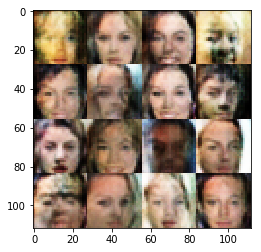

Timestamp 20170803-15-54-14.135 -  Epoch 1/1 -  Step 4710 -  D Loss: 0.7320 - G Loss: 1.7732
Timestamp 20170803-15-54-21.091 -  Epoch 1/1 -  Step 4720 -  D Loss: 1.0945 - G Loss: 0.7419
Timestamp 20170803-15-54-27.879 -  Epoch 1/1 -  Step 4730 -  D Loss: 0.9293 - G Loss: 2.4772
Timestamp 20170803-15-54-34.708 -  Epoch 1/1 -  Step 4740 -  D Loss: 0.6770 - G Loss: 1.8342
Timestamp 20170803-15-54-41.580 -  Epoch 1/1 -  Step 4750 -  D Loss: 0.6007 - G Loss: 1.6489
Timestamp 20170803-15-54-48.646 -  Epoch 1/1 -  Step 4760 -  D Loss: 0.5090 - G Loss: 2.8374
Timestamp 20170803-15-54-55.872 -  Epoch 1/1 -  Step 4770 -  D Loss: 0.6129 - G Loss: 2.2207
Timestamp 20170803-15-55-02.833 -  Epoch 1/1 -  Step 4780 -  D Loss: 1.0339 - G Loss: 4.0158
Timestamp 20170803-15-55-09.688 -  Epoch 1/1 -  Step 4790 -  D Loss: 0.5084 - G Loss: 2.5050
Timestamp 20170803-15-55-16.640 -  Epoch 1/1 -  Step 4800 -  D Loss: 0.6940 - G Loss: 2.1954


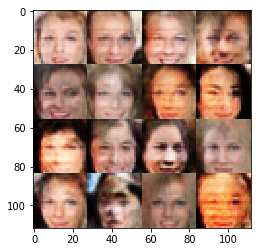

Timestamp 20170803-15-55-24.252 -  Epoch 1/1 -  Step 4810 -  D Loss: 0.8787 - G Loss: 1.5216
Timestamp 20170803-15-55-31.304 -  Epoch 1/1 -  Step 4820 -  D Loss: 0.8374 - G Loss: 1.3072
Timestamp 20170803-15-55-38.060 -  Epoch 1/1 -  Step 4830 -  D Loss: 0.9535 - G Loss: 1.3869
Timestamp 20170803-15-55-44.777 -  Epoch 1/1 -  Step 4840 -  D Loss: 0.5956 - G Loss: 2.2447
Timestamp 20170803-15-55-51.670 -  Epoch 1/1 -  Step 4850 -  D Loss: 1.0570 - G Loss: 1.4519
Timestamp 20170803-15-55-58.795 -  Epoch 1/1 -  Step 4860 -  D Loss: 0.9115 - G Loss: 2.0965
Timestamp 20170803-15-56-05.580 -  Epoch 1/1 -  Step 4870 -  D Loss: 0.7419 - G Loss: 1.5019
Timestamp 20170803-15-56-12.293 -  Epoch 1/1 -  Step 4880 -  D Loss: 0.8584 - G Loss: 0.9223
Timestamp 20170803-15-56-19.017 -  Epoch 1/1 -  Step 4890 -  D Loss: 0.7569 - G Loss: 3.0519
Timestamp 20170803-15-56-26.176 -  Epoch 1/1 -  Step 4900 -  D Loss: 0.9481 - G Loss: 0.9352


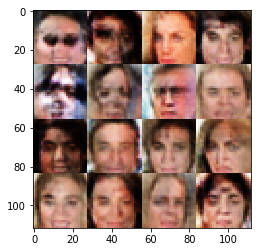

Timestamp 20170803-15-56-33.813 -  Epoch 1/1 -  Step 4910 -  D Loss: 0.6670 - G Loss: 1.7405
Timestamp 20170803-15-56-40.649 -  Epoch 1/1 -  Step 4920 -  D Loss: 1.6975 - G Loss: 0.6919
Timestamp 20170803-15-56-47.513 -  Epoch 1/1 -  Step 4930 -  D Loss: 0.7547 - G Loss: 1.5631
Timestamp 20170803-15-56-54.429 -  Epoch 1/1 -  Step 4940 -  D Loss: 0.4599 - G Loss: 2.6492
Timestamp 20170803-15-57-01.185 -  Epoch 1/1 -  Step 4950 -  D Loss: 0.7015 - G Loss: 1.6833
Timestamp 20170803-15-57-07.921 -  Epoch 1/1 -  Step 4960 -  D Loss: 0.7323 - G Loss: 1.3834
Timestamp 20170803-15-57-14.634 -  Epoch 1/1 -  Step 4970 -  D Loss: 0.5231 - G Loss: 3.0298
Timestamp 20170803-15-57-21.479 -  Epoch 1/1 -  Step 4980 -  D Loss: 0.7242 - G Loss: 3.0743
Timestamp 20170803-15-57-28.701 -  Epoch 1/1 -  Step 4990 -  D Loss: 0.6648 - G Loss: 1.9621
Timestamp 20170803-15-57-35.493 -  Epoch 1/1 -  Step 5000 -  D Loss: 0.9098 - G Loss: 1.7975


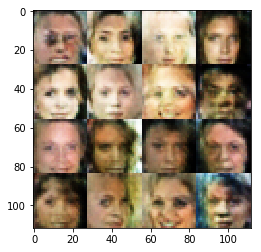

Timestamp 20170803-15-57-43.123 -  Epoch 1/1 -  Step 5010 -  D Loss: 0.7581 - G Loss: 1.7414
Timestamp 20170803-15-57-49.883 -  Epoch 1/1 -  Step 5020 -  D Loss: 0.8453 - G Loss: 1.7030
Timestamp 20170803-15-57-56.713 -  Epoch 1/1 -  Step 5030 -  D Loss: 0.7791 - G Loss: 1.7447
Timestamp 20170803-15-58-03.854 -  Epoch 1/1 -  Step 5040 -  D Loss: 0.7342 - G Loss: 2.1424
Timestamp 20170803-15-58-10.617 -  Epoch 1/1 -  Step 5050 -  D Loss: 0.7922 - G Loss: 1.4033
Timestamp 20170803-15-58-17.312 -  Epoch 1/1 -  Step 5060 -  D Loss: 0.4778 - G Loss: 4.0390
Timestamp 20170803-15-58-24.184 -  Epoch 1/1 -  Step 5070 -  D Loss: 1.4082 - G Loss: 0.4789
Timestamp 20170803-15-58-30.984 -  Epoch 1/1 -  Step 5080 -  D Loss: 1.4128 - G Loss: 3.2768
Timestamp 20170803-15-58-37.719 -  Epoch 1/1 -  Step 5090 -  D Loss: 1.1679 - G Loss: 0.7162
Timestamp 20170803-15-58-44.472 -  Epoch 1/1 -  Step 5100 -  D Loss: 0.5837 - G Loss: 1.6082


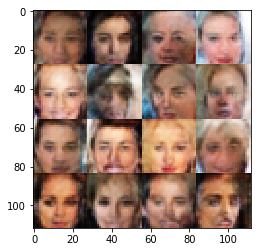

Timestamp 20170803-15-58-51.896 -  Epoch 1/1 -  Step 5110 -  D Loss: 1.0265 - G Loss: 2.4063
Timestamp 20170803-15-58-58.710 -  Epoch 1/1 -  Step 5120 -  D Loss: 0.4903 - G Loss: 3.8017
Timestamp 20170803-15-59-05.661 -  Epoch 1/1 -  Step 5130 -  D Loss: 0.7904 - G Loss: 1.7408
Timestamp 20170803-15-59-12.821 -  Epoch 1/1 -  Step 5140 -  D Loss: 0.5155 - G Loss: 2.0398
Timestamp 20170803-15-59-19.818 -  Epoch 1/1 -  Step 5150 -  D Loss: 0.6526 - G Loss: 1.7653
Timestamp 20170803-15-59-26.553 -  Epoch 1/1 -  Step 5160 -  D Loss: 0.6233 - G Loss: 2.7227
Timestamp 20170803-15-59-33.298 -  Epoch 1/1 -  Step 5170 -  D Loss: 0.7909 - G Loss: 1.5637
Timestamp 20170803-15-59-40.232 -  Epoch 1/1 -  Step 5180 -  D Loss: 0.8345 - G Loss: 2.2717
Timestamp 20170803-15-59-47.010 -  Epoch 1/1 -  Step 5190 -  D Loss: 0.7175 - G Loss: 2.2599
Timestamp 20170803-15-59-53.981 -  Epoch 1/1 -  Step 5200 -  D Loss: 0.8296 - G Loss: 2.0030


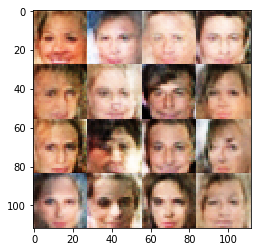

Timestamp 20170803-16-00-01.280 -  Epoch 1/1 -  Step 5210 -  D Loss: 0.9943 - G Loss: 2.4253
Timestamp 20170803-16-00-08.031 -  Epoch 1/1 -  Step 5220 -  D Loss: 0.8916 - G Loss: 0.9939
Timestamp 20170803-16-00-14.777 -  Epoch 1/1 -  Step 5230 -  D Loss: 1.3330 - G Loss: 1.0137
Timestamp 20170803-16-00-21.496 -  Epoch 1/1 -  Step 5240 -  D Loss: 0.8040 - G Loss: 1.3716
Timestamp 20170803-16-00-28.258 -  Epoch 1/1 -  Step 5250 -  D Loss: 0.7925 - G Loss: 1.3097
Timestamp 20170803-16-00-35.075 -  Epoch 1/1 -  Step 5260 -  D Loss: 0.4369 - G Loss: 3.6300
Timestamp 20170803-16-00-41.834 -  Epoch 1/1 -  Step 5270 -  D Loss: 1.6383 - G Loss: 0.4886
Timestamp 20170803-16-00-48.940 -  Epoch 1/1 -  Step 5280 -  D Loss: 0.7291 - G Loss: 2.9889
Timestamp 20170803-16-00-56.040 -  Epoch 1/1 -  Step 5290 -  D Loss: 0.4719 - G Loss: 2.9062
Timestamp 20170803-16-01-02.748 -  Epoch 1/1 -  Step 5300 -  D Loss: 0.9490 - G Loss: 1.1780


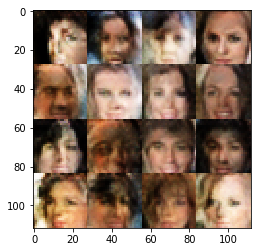

Timestamp 20170803-16-01-10.033 -  Epoch 1/1 -  Step 5310 -  D Loss: 0.9532 - G Loss: 1.5387
Timestamp 20170803-16-01-17.780 -  Epoch 1/1 -  Step 5320 -  D Loss: 0.4955 - G Loss: 2.6032
Timestamp 20170803-16-01-24.931 -  Epoch 1/1 -  Step 5330 -  D Loss: 0.6876 - G Loss: 2.1019
Timestamp 20170803-16-01-32.082 -  Epoch 1/1 -  Step 5340 -  D Loss: 1.2397 - G Loss: 0.5573
Timestamp 20170803-16-01-38.970 -  Epoch 1/1 -  Step 5350 -  D Loss: 0.6692 - G Loss: 1.0661
Timestamp 20170803-16-01-45.921 -  Epoch 1/1 -  Step 5360 -  D Loss: 0.7086 - G Loss: 1.8659
Timestamp 20170803-16-01-52.631 -  Epoch 1/1 -  Step 5370 -  D Loss: 0.7690 - G Loss: 1.3781
Timestamp 20170803-16-01-59.495 -  Epoch 1/1 -  Step 5380 -  D Loss: 0.4905 - G Loss: 2.7686
Timestamp 20170803-16-02-06.663 -  Epoch 1/1 -  Step 5390 -  D Loss: 0.9992 - G Loss: 0.9003
Timestamp 20170803-16-02-13.688 -  Epoch 1/1 -  Step 5400 -  D Loss: 0.5174 - G Loss: 2.4854


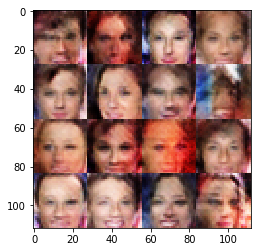

Timestamp 20170803-16-02-21.420 -  Epoch 1/1 -  Step 5410 -  D Loss: 0.6089 - G Loss: 2.2096
Timestamp 20170803-16-02-28.189 -  Epoch 1/1 -  Step 5420 -  D Loss: 0.7544 - G Loss: 1.5724
Timestamp 20170803-16-02-35.035 -  Epoch 1/1 -  Step 5430 -  D Loss: 0.5602 - G Loss: 3.2275
Timestamp 20170803-16-02-42.080 -  Epoch 1/1 -  Step 5440 -  D Loss: 0.6290 - G Loss: 1.7692
Timestamp 20170803-16-02-49.138 -  Epoch 1/1 -  Step 5450 -  D Loss: 0.7634 - G Loss: 1.6628
Timestamp 20170803-16-02-55.882 -  Epoch 1/1 -  Step 5460 -  D Loss: 0.8168 - G Loss: 2.1330
Timestamp 20170803-16-03-02.839 -  Epoch 1/1 -  Step 5470 -  D Loss: 0.5277 - G Loss: 2.5921
Timestamp 20170803-16-03-09.583 -  Epoch 1/1 -  Step 5480 -  D Loss: 0.9289 - G Loss: 0.7479
Timestamp 20170803-16-03-16.310 -  Epoch 1/1 -  Step 5490 -  D Loss: 0.7690 - G Loss: 1.7950
Timestamp 20170803-16-03-23.155 -  Epoch 1/1 -  Step 5500 -  D Loss: 0.6466 - G Loss: 2.0501


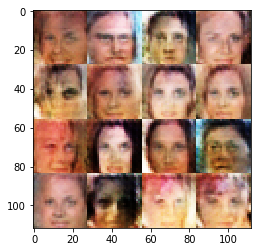

Timestamp 20170803-16-03-30.412 -  Epoch 1/1 -  Step 5510 -  D Loss: 0.5622 - G Loss: 2.5463
Timestamp 20170803-16-03-37.518 -  Epoch 1/1 -  Step 5520 -  D Loss: 0.7051 - G Loss: 1.9110
Timestamp 20170803-16-03-44.286 -  Epoch 1/1 -  Step 5530 -  D Loss: 0.7886 - G Loss: 1.8012
Timestamp 20170803-16-03-51.364 -  Epoch 1/1 -  Step 5540 -  D Loss: 0.7033 - G Loss: 1.3310
Timestamp 20170803-16-03-58.166 -  Epoch 1/1 -  Step 5550 -  D Loss: 0.8434 - G Loss: 1.6181
Timestamp 20170803-16-04-04.875 -  Epoch 1/1 -  Step 5560 -  D Loss: 0.8220 - G Loss: 1.5265
Timestamp 20170803-16-04-11.600 -  Epoch 1/1 -  Step 5570 -  D Loss: 0.9823 - G Loss: 1.1876
Timestamp 20170803-16-04-19.503 -  Epoch 1/1 -  Step 5580 -  D Loss: 0.7596 - G Loss: 1.5155
Timestamp 20170803-16-04-26.386 -  Epoch 1/1 -  Step 5590 -  D Loss: 0.9542 - G Loss: 0.8804
Timestamp 20170803-16-04-33.159 -  Epoch 1/1 -  Step 5600 -  D Loss: 0.6147 - G Loss: 2.2709


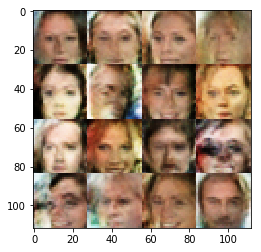

Timestamp 20170803-16-04-40.546 -  Epoch 1/1 -  Step 5610 -  D Loss: 0.9278 - G Loss: 1.0061
Timestamp 20170803-16-04-47.519 -  Epoch 1/1 -  Step 5620 -  D Loss: 0.6380 - G Loss: 3.2830
Timestamp 20170803-16-04-54.224 -  Epoch 1/1 -  Step 5630 -  D Loss: 1.0358 - G Loss: 0.6669
Timestamp 20170803-16-05-01.048 -  Epoch 1/1 -  Step 5640 -  D Loss: 0.6316 - G Loss: 3.0584
Timestamp 20170803-16-05-07.759 -  Epoch 1/1 -  Step 5650 -  D Loss: 0.9431 - G Loss: 1.2203
Timestamp 20170803-16-05-14.522 -  Epoch 1/1 -  Step 5660 -  D Loss: 0.9196 - G Loss: 1.3183
Timestamp 20170803-16-05-21.260 -  Epoch 1/1 -  Step 5670 -  D Loss: 0.9649 - G Loss: 1.3780
Timestamp 20170803-16-05-28.202 -  Epoch 1/1 -  Step 5680 -  D Loss: 0.6820 - G Loss: 1.7816
Timestamp 20170803-16-05-35.089 -  Epoch 1/1 -  Step 5690 -  D Loss: 0.8662 - G Loss: 1.3804
Timestamp 20170803-16-05-42.149 -  Epoch 1/1 -  Step 5700 -  D Loss: 0.7062 - G Loss: 1.2809


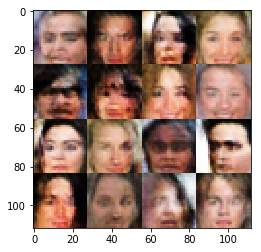

Timestamp 20170803-16-05-49.557 -  Epoch 1/1 -  Step 5710 -  D Loss: 0.7265 - G Loss: 2.4496
Timestamp 20170803-16-05-56.258 -  Epoch 1/1 -  Step 5720 -  D Loss: 0.9394 - G Loss: 1.4646
Timestamp 20170803-16-06-03.110 -  Epoch 1/1 -  Step 5730 -  D Loss: 0.5475 - G Loss: 1.5806
Timestamp 20170803-16-06-10.022 -  Epoch 1/1 -  Step 5740 -  D Loss: 0.5184 - G Loss: 2.1702
Timestamp 20170803-16-06-16.742 -  Epoch 1/1 -  Step 5750 -  D Loss: 0.6768 - G Loss: 1.8620
Timestamp 20170803-16-06-23.549 -  Epoch 1/1 -  Step 5760 -  D Loss: 0.7700 - G Loss: 2.4786
Timestamp 20170803-16-06-30.320 -  Epoch 1/1 -  Step 5770 -  D Loss: 0.6420 - G Loss: 1.9485
Timestamp 20170803-16-06-37.020 -  Epoch 1/1 -  Step 5780 -  D Loss: 1.0058 - G Loss: 0.8698
Timestamp 20170803-16-06-43.701 -  Epoch 1/1 -  Step 5790 -  D Loss: 0.7012 - G Loss: 1.9666
Timestamp 20170803-16-06-50.419 -  Epoch 1/1 -  Step 5800 -  D Loss: 0.7074 - G Loss: 1.6647


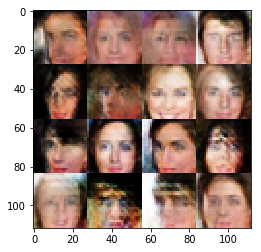

Timestamp 20170803-16-06-57.858 -  Epoch 1/1 -  Step 5810 -  D Loss: 1.0084 - G Loss: 1.1161
Timestamp 20170803-16-07-04.706 -  Epoch 1/1 -  Step 5820 -  D Loss: 0.6411 - G Loss: 1.9589
Timestamp 20170803-16-07-11.539 -  Epoch 1/1 -  Step 5830 -  D Loss: 0.6281 - G Loss: 2.1926
Timestamp 20170803-16-07-18.328 -  Epoch 1/1 -  Step 5840 -  D Loss: 1.0627 - G Loss: 0.7916
Timestamp 20170803-16-07-25.182 -  Epoch 1/1 -  Step 5850 -  D Loss: 0.7532 - G Loss: 1.7355
Timestamp 20170803-16-07-32.482 -  Epoch 1/1 -  Step 5860 -  D Loss: 0.8197 - G Loss: 1.7682
Timestamp 20170803-16-07-39.683 -  Epoch 1/1 -  Step 5870 -  D Loss: 1.0542 - G Loss: 0.8068
Timestamp 20170803-16-07-46.806 -  Epoch 1/1 -  Step 5880 -  D Loss: 1.2614 - G Loss: 0.6012
Timestamp 20170803-16-07-53.541 -  Epoch 1/1 -  Step 5890 -  D Loss: 1.1871 - G Loss: 0.7389
Timestamp 20170803-16-08-00.309 -  Epoch 1/1 -  Step 5900 -  D Loss: 0.7994 - G Loss: 2.0596


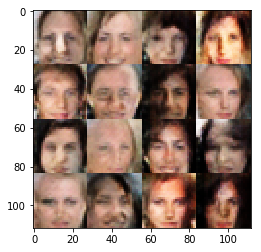

Timestamp 20170803-16-08-07.631 -  Epoch 1/1 -  Step 5910 -  D Loss: 0.8858 - G Loss: 1.4624
Timestamp 20170803-16-08-14.328 -  Epoch 1/1 -  Step 5920 -  D Loss: 1.3607 - G Loss: 0.5208
Timestamp 20170803-16-08-21.184 -  Epoch 1/1 -  Step 5930 -  D Loss: 0.9004 - G Loss: 1.5205
Timestamp 20170803-16-08-28.130 -  Epoch 1/1 -  Step 5940 -  D Loss: 0.6951 - G Loss: 2.2356
Timestamp 20170803-16-08-35.019 -  Epoch 1/1 -  Step 5950 -  D Loss: 0.8378 - G Loss: 1.3013
Timestamp 20170803-16-08-41.906 -  Epoch 1/1 -  Step 5960 -  D Loss: 0.6858 - G Loss: 2.4265
Timestamp 20170803-16-08-48.782 -  Epoch 1/1 -  Step 5970 -  D Loss: 1.1488 - G Loss: 0.7546
Timestamp 20170803-16-08-55.605 -  Epoch 1/1 -  Step 5980 -  D Loss: 0.6537 - G Loss: 2.1882
Timestamp 20170803-16-09-02.660 -  Epoch 1/1 -  Step 5990 -  D Loss: 0.6172 - G Loss: 2.2299
Timestamp 20170803-16-09-09.627 -  Epoch 1/1 -  Step 6000 -  D Loss: 0.5596 - G Loss: 2.4306


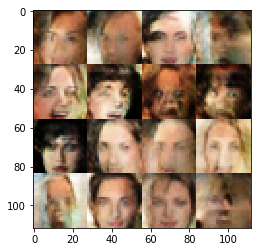

Timestamp 20170803-16-09-17.119 -  Epoch 1/1 -  Step 6010 -  D Loss: 1.0196 - G Loss: 1.0694
Timestamp 20170803-16-09-24.157 -  Epoch 1/1 -  Step 6020 -  D Loss: 0.7771 - G Loss: 1.7894
Timestamp 20170803-16-09-31.120 -  Epoch 1/1 -  Step 6030 -  D Loss: 0.8204 - G Loss: 1.6889
Timestamp 20170803-16-09-37.910 -  Epoch 1/1 -  Step 6040 -  D Loss: 0.7066 - G Loss: 1.6010
Timestamp 20170803-16-09-44.683 -  Epoch 1/1 -  Step 6050 -  D Loss: 0.8320 - G Loss: 1.7280
Timestamp 20170803-16-09-51.538 -  Epoch 1/1 -  Step 6060 -  D Loss: 0.8291 - G Loss: 1.2280
Timestamp 20170803-16-09-58.235 -  Epoch 1/1 -  Step 6070 -  D Loss: 0.8148 - G Loss: 2.5052
Timestamp 20170803-16-10-05.219 -  Epoch 1/1 -  Step 6080 -  D Loss: 0.7970 - G Loss: 1.4846
Timestamp 20170803-16-10-12.150 -  Epoch 1/1 -  Step 6090 -  D Loss: 1.0220 - G Loss: 1.2446
Timestamp 20170803-16-10-19.138 -  Epoch 1/1 -  Step 6100 -  D Loss: 0.8652 - G Loss: 2.1532


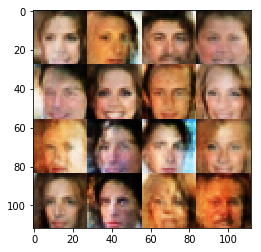

Timestamp 20170803-16-10-26.569 -  Epoch 1/1 -  Step 6110 -  D Loss: 0.4461 - G Loss: 2.8362
Timestamp 20170803-16-10-33.721 -  Epoch 1/1 -  Step 6120 -  D Loss: 0.9976 - G Loss: 1.4037
Timestamp 20170803-16-10-40.793 -  Epoch 1/1 -  Step 6130 -  D Loss: 0.6299 - G Loss: 1.9193
Timestamp 20170803-16-10-47.565 -  Epoch 1/1 -  Step 6140 -  D Loss: 0.7345 - G Loss: 2.4066
Timestamp 20170803-16-10-54.529 -  Epoch 1/1 -  Step 6150 -  D Loss: 0.7867 - G Loss: 1.8488
Timestamp 20170803-16-11-01.500 -  Epoch 1/1 -  Step 6160 -  D Loss: 0.5037 - G Loss: 2.9447
Timestamp 20170803-16-11-08.617 -  Epoch 1/1 -  Step 6170 -  D Loss: 1.2457 - G Loss: 0.7185
Timestamp 20170803-16-11-15.328 -  Epoch 1/1 -  Step 6180 -  D Loss: 1.5620 - G Loss: 0.6160
Timestamp 20170803-16-11-22.112 -  Epoch 1/1 -  Step 6190 -  D Loss: 1.1962 - G Loss: 2.3633
Timestamp 20170803-16-11-29.017 -  Epoch 1/1 -  Step 6200 -  D Loss: 1.0417 - G Loss: 0.7747


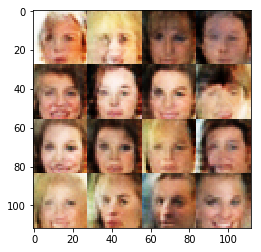

Timestamp 20170803-16-11-36.428 -  Epoch 1/1 -  Step 6210 -  D Loss: 0.6262 - G Loss: 1.7702
Timestamp 20170803-16-11-43.246 -  Epoch 1/1 -  Step 6220 -  D Loss: 0.8374 - G Loss: 1.3590
Timestamp 20170803-16-11-50.037 -  Epoch 1/1 -  Step 6230 -  D Loss: 0.6854 - G Loss: 1.5289
Timestamp 20170803-16-11-56.947 -  Epoch 1/1 -  Step 6240 -  D Loss: 0.8235 - G Loss: 1.5027
Timestamp 20170803-16-12-03.645 -  Epoch 1/1 -  Step 6250 -  D Loss: 0.5468 - G Loss: 3.0049
Timestamp 20170803-16-12-10.459 -  Epoch 1/1 -  Step 6260 -  D Loss: 0.7621 - G Loss: 1.4565
Timestamp 20170803-16-12-17.227 -  Epoch 1/1 -  Step 6270 -  D Loss: 0.6628 - G Loss: 1.6827
Timestamp 20170803-16-12-23.926 -  Epoch 1/1 -  Step 6280 -  D Loss: 0.7007 - G Loss: 1.6092
Timestamp 20170803-16-12-30.613 -  Epoch 1/1 -  Step 6290 -  D Loss: 0.5605 - G Loss: 3.0597
Timestamp 20170803-16-12-37.623 -  Epoch 1/1 -  Step 6300 -  D Loss: 0.8439 - G Loss: 1.8652


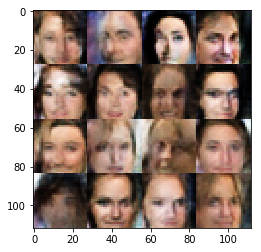

Timestamp 20170803-16-12-45.209 -  Epoch 1/1 -  Step 6310 -  D Loss: 0.8060 - G Loss: 1.7519
Timestamp 20170803-16-12-52.113 -  Epoch 1/1 -  Step 6320 -  D Loss: 0.6203 - G Loss: 1.8260
Timestamp 20170803-16-12-58.809 -  Epoch 1/1 -  Step 6330 -  D Loss: 0.7661 - G Loss: 1.9786
Timestamp 20170803-16-13-05.583 -  Epoch 1/1 -  Step 6340 -  D Loss: 0.4774 - G Loss: 2.5305
Timestamp 20170803-16-13-12.503 -  Epoch 1/1 -  Step 6350 -  D Loss: 1.0758 - G Loss: 0.8780
Timestamp 20170803-16-13-19.623 -  Epoch 1/1 -  Step 6360 -  D Loss: 0.6120 - G Loss: 1.7358
Timestamp 20170803-16-13-26.824 -  Epoch 1/1 -  Step 6370 -  D Loss: 0.9310 - G Loss: 1.3401
Timestamp 20170803-16-13-33.669 -  Epoch 1/1 -  Step 6380 -  D Loss: 0.7287 - G Loss: 1.5242
Timestamp 20170803-16-13-40.473 -  Epoch 1/1 -  Step 6390 -  D Loss: 0.8154 - G Loss: 1.0096
Timestamp 20170803-16-13-47.213 -  Epoch 1/1 -  Step 6400 -  D Loss: 1.0888 - G Loss: 0.8541


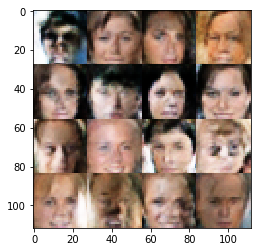

Timestamp 20170803-16-13-54.564 -  Epoch 1/1 -  Step 6410 -  D Loss: 0.8882 - G Loss: 2.4013
Timestamp 20170803-16-14-01.609 -  Epoch 1/1 -  Step 6420 -  D Loss: 0.9723 - G Loss: 0.9643
Timestamp 20170803-16-14-08.655 -  Epoch 1/1 -  Step 6430 -  D Loss: 0.9516 - G Loss: 1.3538
Timestamp 20170803-16-14-15.615 -  Epoch 1/1 -  Step 6440 -  D Loss: 0.7693 - G Loss: 2.0106
Timestamp 20170803-16-14-22.862 -  Epoch 1/1 -  Step 6450 -  D Loss: 0.8070 - G Loss: 1.1676
Timestamp 20170803-16-14-29.696 -  Epoch 1/1 -  Step 6460 -  D Loss: 0.9809 - G Loss: 0.7306
Timestamp 20170803-16-14-36.767 -  Epoch 1/1 -  Step 6470 -  D Loss: 0.9094 - G Loss: 1.1627
Timestamp 20170803-16-14-44.349 -  Epoch 1/1 -  Step 6480 -  D Loss: 0.8579 - G Loss: 1.4762
Timestamp 20170803-16-14-51.345 -  Epoch 1/1 -  Step 6490 -  D Loss: 1.2186 - G Loss: 0.9403
Timestamp 20170803-16-14-58.158 -  Epoch 1/1 -  Step 6500 -  D Loss: 1.0898 - G Loss: 1.1134


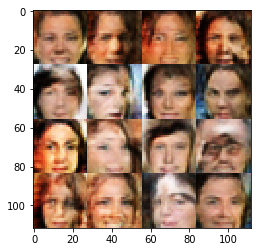

Timestamp 20170803-16-15-05.481 -  Epoch 1/1 -  Step 6510 -  D Loss: 1.1920 - G Loss: 2.9020
Timestamp 20170803-16-15-12.191 -  Epoch 1/1 -  Step 6520 -  D Loss: 0.7158 - G Loss: 1.8004
Timestamp 20170803-16-15-18.886 -  Epoch 1/1 -  Step 6530 -  D Loss: 1.4408 - G Loss: 0.6842
Timestamp 20170803-16-15-25.660 -  Epoch 1/1 -  Step 6540 -  D Loss: 0.7962 - G Loss: 1.6137
Timestamp 20170803-16-15-32.557 -  Epoch 1/1 -  Step 6550 -  D Loss: 0.6755 - G Loss: 1.6313
Timestamp 20170803-16-15-39.603 -  Epoch 1/1 -  Step 6560 -  D Loss: 0.5209 - G Loss: 2.6192
Timestamp 20170803-16-15-46.387 -  Epoch 1/1 -  Step 6570 -  D Loss: 1.6625 - G Loss: 0.6532
Timestamp 20170803-16-15-53.201 -  Epoch 1/1 -  Step 6580 -  D Loss: 0.6372 - G Loss: 1.5101
Timestamp 20170803-16-15-59.949 -  Epoch 1/1 -  Step 6590 -  D Loss: 0.6419 - G Loss: 2.1676
Timestamp 20170803-16-16-06.770 -  Epoch 1/1 -  Step 6600 -  D Loss: 0.9859 - G Loss: 0.6846


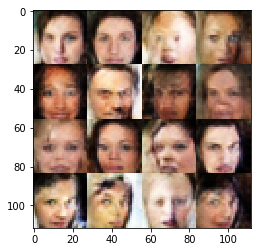

Timestamp 20170803-16-16-14.290 -  Epoch 1/1 -  Step 6610 -  D Loss: 0.9363 - G Loss: 0.9590
Timestamp 20170803-16-16-21.781 -  Epoch 1/1 -  Step 6620 -  D Loss: 0.5929 - G Loss: 1.8600
Timestamp 20170803-16-16-28.938 -  Epoch 1/1 -  Step 6630 -  D Loss: 0.8609 - G Loss: 1.2701
Timestamp 20170803-16-16-35.636 -  Epoch 1/1 -  Step 6640 -  D Loss: 0.7898 - G Loss: 1.1620
Timestamp 20170803-16-16-42.698 -  Epoch 1/1 -  Step 6650 -  D Loss: 0.6465 - G Loss: 1.9883
Timestamp 20170803-16-16-49.548 -  Epoch 1/1 -  Step 6660 -  D Loss: 1.3407 - G Loss: 3.3507
Timestamp 20170803-16-16-56.574 -  Epoch 1/1 -  Step 6670 -  D Loss: 0.6487 - G Loss: 1.5773
Timestamp 20170803-16-17-03.767 -  Epoch 1/1 -  Step 6680 -  D Loss: 0.6301 - G Loss: 2.2633
Timestamp 20170803-16-17-10.724 -  Epoch 1/1 -  Step 6690 -  D Loss: 0.7060 - G Loss: 1.8932
Timestamp 20170803-16-17-17.685 -  Epoch 1/1 -  Step 6700 -  D Loss: 0.6753 - G Loss: 1.2090


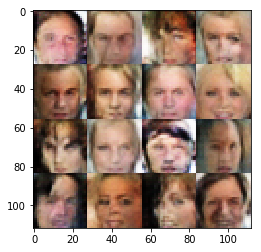

Timestamp 20170803-16-17-25.187 -  Epoch 1/1 -  Step 6710 -  D Loss: 0.8563 - G Loss: 0.8826
Timestamp 20170803-16-17-31.880 -  Epoch 1/1 -  Step 6720 -  D Loss: 0.9191 - G Loss: 1.3445
Timestamp 20170803-16-17-38.726 -  Epoch 1/1 -  Step 6730 -  D Loss: 0.7498 - G Loss: 1.4863
Timestamp 20170803-16-17-45.620 -  Epoch 1/1 -  Step 6740 -  D Loss: 0.8214 - G Loss: 2.0522
Timestamp 20170803-16-17-52.603 -  Epoch 1/1 -  Step 6750 -  D Loss: 0.5762 - G Loss: 1.7342
Timestamp 20170803-16-17-59.715 -  Epoch 1/1 -  Step 6760 -  D Loss: 0.8183 - G Loss: 1.0539
Timestamp 20170803-16-18-06.786 -  Epoch 1/1 -  Step 6770 -  D Loss: 0.7920 - G Loss: 1.1742
Timestamp 20170803-16-18-13.629 -  Epoch 1/1 -  Step 6780 -  D Loss: 0.8204 - G Loss: 2.0695
Timestamp 20170803-16-18-20.351 -  Epoch 1/1 -  Step 6790 -  D Loss: 1.0292 - G Loss: 1.5311
Timestamp 20170803-16-18-27.129 -  Epoch 1/1 -  Step 6800 -  D Loss: 0.9317 - G Loss: 0.7502


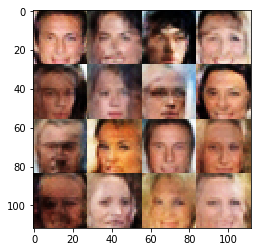

Timestamp 20170803-16-18-34.496 -  Epoch 1/1 -  Step 6810 -  D Loss: 0.9155 - G Loss: 2.1371
Timestamp 20170803-16-18-41.704 -  Epoch 1/1 -  Step 6820 -  D Loss: 0.8868 - G Loss: 1.8417
Timestamp 20170803-16-18-48.953 -  Epoch 1/1 -  Step 6830 -  D Loss: 1.4405 - G Loss: 0.6770
Timestamp 20170803-16-18-55.908 -  Epoch 1/1 -  Step 6840 -  D Loss: 0.7024 - G Loss: 2.1940
Timestamp 20170803-16-19-02.641 -  Epoch 1/1 -  Step 6850 -  D Loss: 0.6387 - G Loss: 2.3304
Timestamp 20170803-16-19-09.357 -  Epoch 1/1 -  Step 6860 -  D Loss: 0.7720 - G Loss: 1.4190
Timestamp 20170803-16-19-16.199 -  Epoch 1/1 -  Step 6870 -  D Loss: 0.6654 - G Loss: 2.7511
Timestamp 20170803-16-19-23.334 -  Epoch 1/1 -  Step 6880 -  D Loss: 0.5957 - G Loss: 2.7742
Timestamp 20170803-16-19-30.087 -  Epoch 1/1 -  Step 6890 -  D Loss: 1.2476 - G Loss: 1.1584
Timestamp 20170803-16-19-36.797 -  Epoch 1/1 -  Step 6900 -  D Loss: 1.1527 - G Loss: 0.7524


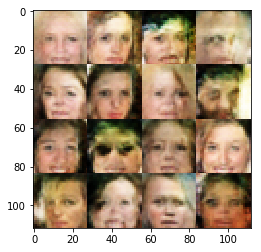

Timestamp 20170803-16-19-44.132 -  Epoch 1/1 -  Step 6910 -  D Loss: 0.4798 - G Loss: 4.0652
Timestamp 20170803-16-19-51.125 -  Epoch 1/1 -  Step 6920 -  D Loss: 0.7804 - G Loss: 1.6734
Timestamp 20170803-16-19-58.394 -  Epoch 1/1 -  Step 6930 -  D Loss: 1.3491 - G Loss: 0.8749
Timestamp 20170803-16-20-05.632 -  Epoch 1/1 -  Step 6940 -  D Loss: 0.7334 - G Loss: 2.0298
Timestamp 20170803-16-20-12.893 -  Epoch 1/1 -  Step 6950 -  D Loss: 0.7049 - G Loss: 1.4875
Timestamp 20170803-16-20-19.939 -  Epoch 1/1 -  Step 6960 -  D Loss: 0.8426 - G Loss: 1.7328
Timestamp 20170803-16-20-26.665 -  Epoch 1/1 -  Step 6970 -  D Loss: 0.7134 - G Loss: 1.6125
Timestamp 20170803-16-20-33.713 -  Epoch 1/1 -  Step 6980 -  D Loss: 0.7096 - G Loss: 1.7954
Timestamp 20170803-16-20-40.792 -  Epoch 1/1 -  Step 6990 -  D Loss: 1.0239 - G Loss: 1.0250
Timestamp 20170803-16-20-47.657 -  Epoch 1/1 -  Step 7000 -  D Loss: 0.9040 - G Loss: 0.8678


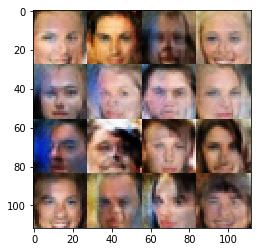

Timestamp 20170803-16-20-54.982 -  Epoch 1/1 -  Step 7010 -  D Loss: 1.1802 - G Loss: 1.0527
Timestamp 20170803-16-21-01.685 -  Epoch 1/1 -  Step 7020 -  D Loss: 0.7407 - G Loss: 1.9661
Timestamp 20170803-16-21-08.421 -  Epoch 1/1 -  Step 7030 -  D Loss: 1.0650 - G Loss: 1.5917
Timestamp 20170803-16-21-15.390 -  Epoch 1/1 -  Step 7040 -  D Loss: 0.9156 - G Loss: 1.3089
Timestamp 20170803-16-21-22.288 -  Epoch 1/1 -  Step 7050 -  D Loss: 0.7157 - G Loss: 2.0821
Timestamp 20170803-16-21-28.991 -  Epoch 1/1 -  Step 7060 -  D Loss: 0.6175 - G Loss: 1.8099
Timestamp 20170803-16-21-35.692 -  Epoch 1/1 -  Step 7070 -  D Loss: 0.7438 - G Loss: 2.1844
Timestamp 20170803-16-21-42.491 -  Epoch 1/1 -  Step 7080 -  D Loss: 0.9494 - G Loss: 1.4381
Timestamp 20170803-16-21-49.388 -  Epoch 1/1 -  Step 7090 -  D Loss: 1.3290 - G Loss: 0.7991
Timestamp 20170803-16-21-56.233 -  Epoch 1/1 -  Step 7100 -  D Loss: 0.7693 - G Loss: 1.5938


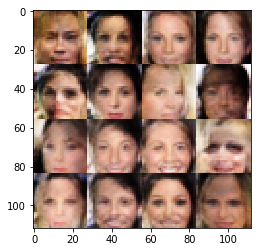

Timestamp 20170803-16-22-03.907 -  Epoch 1/1 -  Step 7110 -  D Loss: 0.7501 - G Loss: 1.0373
Timestamp 20170803-16-22-10.802 -  Epoch 1/1 -  Step 7120 -  D Loss: 0.7694 - G Loss: 1.3867
Timestamp 20170803-16-22-17.801 -  Epoch 1/1 -  Step 7130 -  D Loss: 0.7361 - G Loss: 1.1369
Timestamp 20170803-16-22-24.657 -  Epoch 1/1 -  Step 7140 -  D Loss: 0.7793 - G Loss: 1.6972
Timestamp 20170803-16-22-31.556 -  Epoch 1/1 -  Step 7150 -  D Loss: 0.5339 - G Loss: 1.6771
Timestamp 20170803-16-22-38.458 -  Epoch 1/1 -  Step 7160 -  D Loss: 0.7848 - G Loss: 1.6495
Timestamp 20170803-16-22-45.302 -  Epoch 1/1 -  Step 7170 -  D Loss: 1.1703 - G Loss: 0.7239
Timestamp 20170803-16-22-51.988 -  Epoch 1/1 -  Step 7180 -  D Loss: 0.7811 - G Loss: 1.9304
Timestamp 20170803-16-22-58.781 -  Epoch 1/1 -  Step 7190 -  D Loss: 0.7258 - G Loss: 1.9774
Timestamp 20170803-16-23-05.494 -  Epoch 1/1 -  Step 7200 -  D Loss: 0.7707 - G Loss: 1.8813


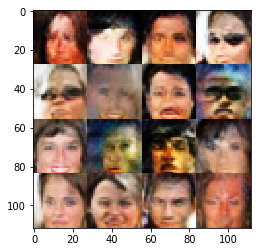

Timestamp 20170803-16-23-12.831 -  Epoch 1/1 -  Step 7210 -  D Loss: 0.5982 - G Loss: 2.2440
Timestamp 20170803-16-23-19.835 -  Epoch 1/1 -  Step 7220 -  D Loss: 0.6858 - G Loss: 1.5392
Timestamp 20170803-16-23-27.021 -  Epoch 1/1 -  Step 7230 -  D Loss: 1.1420 - G Loss: 0.8567
Timestamp 20170803-16-23-34.132 -  Epoch 1/1 -  Step 7240 -  D Loss: 0.7359 - G Loss: 2.4511
Timestamp 20170803-16-23-41.123 -  Epoch 1/1 -  Step 7250 -  D Loss: 0.4704 - G Loss: 2.3664
Timestamp 20170803-16-23-47.862 -  Epoch 1/1 -  Step 7260 -  D Loss: 0.8111 - G Loss: 1.3533
Timestamp 20170803-16-23-54.610 -  Epoch 1/1 -  Step 7270 -  D Loss: 1.2306 - G Loss: 0.7288
Timestamp 20170803-16-24-01.405 -  Epoch 1/1 -  Step 7280 -  D Loss: 1.0054 - G Loss: 1.8815
Timestamp 20170803-16-24-08.244 -  Epoch 1/1 -  Step 7290 -  D Loss: 0.7875 - G Loss: 1.3363
Timestamp 20170803-16-24-15.078 -  Epoch 1/1 -  Step 7300 -  D Loss: 1.1967 - G Loss: 1.0547


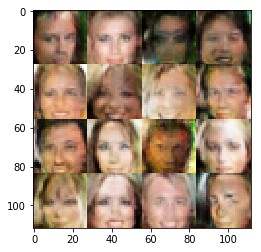

Timestamp 20170803-16-24-23.255 -  Epoch 1/1 -  Step 7310 -  D Loss: 0.9716 - G Loss: 0.9033
Timestamp 20170803-16-24-30.250 -  Epoch 1/1 -  Step 7320 -  D Loss: 0.7673 - G Loss: 1.4581
Timestamp 20170803-16-24-37.137 -  Epoch 1/1 -  Step 7330 -  D Loss: 0.9965 - G Loss: 0.8362
Timestamp 20170803-16-24-43.862 -  Epoch 1/1 -  Step 7340 -  D Loss: 1.0262 - G Loss: 1.0075
Timestamp 20170803-16-24-50.611 -  Epoch 1/1 -  Step 7350 -  D Loss: 0.9516 - G Loss: 1.4187
Timestamp 20170803-16-24-57.322 -  Epoch 1/1 -  Step 7360 -  D Loss: 0.7194 - G Loss: 1.6238
Timestamp 20170803-16-25-04.034 -  Epoch 1/1 -  Step 7370 -  D Loss: 0.6955 - G Loss: 1.8903
Timestamp 20170803-16-25-10.712 -  Epoch 1/1 -  Step 7380 -  D Loss: 0.7735 - G Loss: 1.2180
Timestamp 20170803-16-25-17.607 -  Epoch 1/1 -  Step 7390 -  D Loss: 0.8862 - G Loss: 1.4538
Timestamp 20170803-16-25-24.645 -  Epoch 1/1 -  Step 7400 -  D Loss: 0.8276 - G Loss: 1.1219


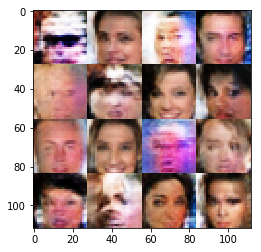

Timestamp 20170803-16-25-32.141 -  Epoch 1/1 -  Step 7410 -  D Loss: 1.0366 - G Loss: 1.1157
Timestamp 20170803-16-25-38.831 -  Epoch 1/1 -  Step 7420 -  D Loss: 1.4017 - G Loss: 3.4817
Timestamp 20170803-16-25-45.520 -  Epoch 1/1 -  Step 7430 -  D Loss: 1.0546 - G Loss: 1.3975
Timestamp 20170803-16-25-52.291 -  Epoch 1/1 -  Step 7440 -  D Loss: 0.8466 - G Loss: 1.6785
Timestamp 20170803-16-25-59.264 -  Epoch 1/1 -  Step 7450 -  D Loss: 0.8810 - G Loss: 0.9945
Timestamp 20170803-16-26-06.215 -  Epoch 1/1 -  Step 7460 -  D Loss: 0.6196 - G Loss: 1.5932
Timestamp 20170803-16-26-13.104 -  Epoch 1/1 -  Step 7470 -  D Loss: 0.6881 - G Loss: 1.8717
Timestamp 20170803-16-26-20.170 -  Epoch 1/1 -  Step 7480 -  D Loss: 0.7339 - G Loss: 1.8046
Timestamp 20170803-16-26-27.176 -  Epoch 1/1 -  Step 7490 -  D Loss: 0.5538 - G Loss: 3.0221
Timestamp 20170803-16-26-33.850 -  Epoch 1/1 -  Step 7500 -  D Loss: 0.9274 - G Loss: 1.1001


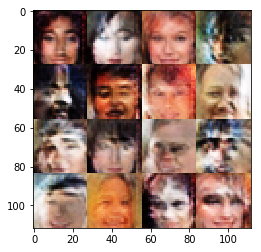

Timestamp 20170803-16-26-41.284 -  Epoch 1/1 -  Step 7510 -  D Loss: 1.3388 - G Loss: 0.6594
Timestamp 20170803-16-26-48.218 -  Epoch 1/1 -  Step 7520 -  D Loss: 0.8162 - G Loss: 2.1872
Timestamp 20170803-16-26-55.080 -  Epoch 1/1 -  Step 7530 -  D Loss: 0.9007 - G Loss: 3.0343
Timestamp 20170803-16-27-01.966 -  Epoch 1/1 -  Step 7540 -  D Loss: 0.8250 - G Loss: 1.4729
Timestamp 20170803-16-27-09.024 -  Epoch 1/1 -  Step 7550 -  D Loss: 0.9676 - G Loss: 1.0453
Timestamp 20170803-16-27-16.029 -  Epoch 1/1 -  Step 7560 -  D Loss: 0.8086 - G Loss: 1.8679
Timestamp 20170803-16-27-22.824 -  Epoch 1/1 -  Step 7570 -  D Loss: 0.8905 - G Loss: 2.6508
Timestamp 20170803-16-27-29.557 -  Epoch 1/1 -  Step 7580 -  D Loss: 0.8050 - G Loss: 1.7105
Timestamp 20170803-16-27-36.295 -  Epoch 1/1 -  Step 7590 -  D Loss: 1.1582 - G Loss: 2.0604
Timestamp 20170803-16-27-43.007 -  Epoch 1/1 -  Step 7600 -  D Loss: 0.5153 - G Loss: 2.8308


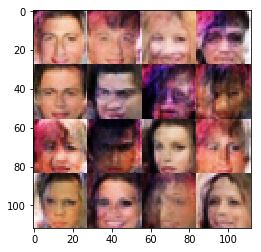

Timestamp 20170803-16-27-50.400 -  Epoch 1/1 -  Step 7610 -  D Loss: 0.7058 - G Loss: 2.3278
Timestamp 20170803-16-27-57.377 -  Epoch 1/1 -  Step 7620 -  D Loss: 1.1782 - G Loss: 1.9873
Timestamp 20170803-16-28-04.357 -  Epoch 1/1 -  Step 7630 -  D Loss: 0.9794 - G Loss: 0.8167
Timestamp 20170803-16-28-11.290 -  Epoch 1/1 -  Step 7640 -  D Loss: 0.5479 - G Loss: 2.1579
Timestamp 20170803-16-28-18.193 -  Epoch 1/1 -  Step 7650 -  D Loss: 0.8305 - G Loss: 2.0585
Timestamp 20170803-16-28-25.146 -  Epoch 1/1 -  Step 7660 -  D Loss: 0.9697 - G Loss: 1.0617
Timestamp 20170803-16-28-32.009 -  Epoch 1/1 -  Step 7670 -  D Loss: 0.7387 - G Loss: 1.4556
Timestamp 20170803-16-28-38.685 -  Epoch 1/1 -  Step 7680 -  D Loss: 1.0400 - G Loss: 1.5274
Timestamp 20170803-16-28-45.390 -  Epoch 1/1 -  Step 7690 -  D Loss: 1.1769 - G Loss: 0.7016
Timestamp 20170803-16-28-52.152 -  Epoch 1/1 -  Step 7700 -  D Loss: 0.8527 - G Loss: 1.2413


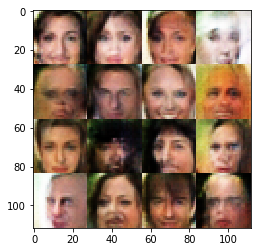

Timestamp 20170803-16-28-59.751 -  Epoch 1/1 -  Step 7710 -  D Loss: 0.9667 - G Loss: 0.9766
Timestamp 20170803-16-29-06.571 -  Epoch 1/1 -  Step 7720 -  D Loss: 0.9676 - G Loss: 2.0682
Timestamp 20170803-16-29-13.300 -  Epoch 1/1 -  Step 7730 -  D Loss: 0.6524 - G Loss: 1.8195
Timestamp 20170803-16-29-20.288 -  Epoch 1/1 -  Step 7740 -  D Loss: 1.3008 - G Loss: 0.9418
Timestamp 20170803-16-29-27.176 -  Epoch 1/1 -  Step 7750 -  D Loss: 0.7385 - G Loss: 1.9579
Timestamp 20170803-16-29-34.003 -  Epoch 1/1 -  Step 7760 -  D Loss: 0.7903 - G Loss: 1.6680
Timestamp 20170803-16-29-40.896 -  Epoch 1/1 -  Step 7770 -  D Loss: 0.8692 - G Loss: 2.5369
Timestamp 20170803-16-29-47.786 -  Epoch 1/1 -  Step 7780 -  D Loss: 0.6269 - G Loss: 1.9529
Timestamp 20170803-16-29-54.524 -  Epoch 1/1 -  Step 7790 -  D Loss: 0.7664 - G Loss: 1.6887
Timestamp 20170803-16-30-01.383 -  Epoch 1/1 -  Step 7800 -  D Loss: 0.6976 - G Loss: 1.0280


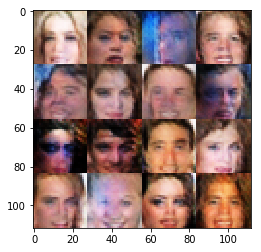

Timestamp 20170803-16-30-08.813 -  Epoch 1/1 -  Step 7810 -  D Loss: 0.8691 - G Loss: 1.1776
Timestamp 20170803-16-30-15.565 -  Epoch 1/1 -  Step 7820 -  D Loss: 0.8124 - G Loss: 1.1162
Timestamp 20170803-16-30-22.501 -  Epoch 1/1 -  Step 7830 -  D Loss: 0.9219 - G Loss: 1.7272
Timestamp 20170803-16-30-29.468 -  Epoch 1/1 -  Step 7840 -  D Loss: 0.6025 - G Loss: 1.6456
Timestamp 20170803-16-30-36.235 -  Epoch 1/1 -  Step 7850 -  D Loss: 0.7716 - G Loss: 1.3806
Timestamp 20170803-16-30-42.953 -  Epoch 1/1 -  Step 7860 -  D Loss: 0.9381 - G Loss: 1.9169
Timestamp 20170803-16-30-50.080 -  Epoch 1/1 -  Step 7870 -  D Loss: 0.6807 - G Loss: 1.9192
Timestamp 20170803-16-30-57.237 -  Epoch 1/1 -  Step 7880 -  D Loss: 1.7830 - G Loss: 0.3821
Timestamp 20170803-16-31-04.040 -  Epoch 1/1 -  Step 7890 -  D Loss: 0.5853 - G Loss: 2.3565
Timestamp 20170803-16-31-10.782 -  Epoch 1/1 -  Step 7900 -  D Loss: 0.5535 - G Loss: 2.1916


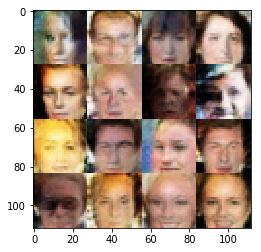

Timestamp 20170803-16-31-18.634 -  Epoch 1/1 -  Step 7910 -  D Loss: 0.8769 - G Loss: 2.4967
Timestamp 20170803-16-31-25.660 -  Epoch 1/1 -  Step 7920 -  D Loss: 0.5292 - G Loss: 2.0753
Timestamp 20170803-16-31-32.953 -  Epoch 1/1 -  Step 7930 -  D Loss: 1.0406 - G Loss: 1.0918
Timestamp 20170803-16-31-40.087 -  Epoch 1/1 -  Step 7940 -  D Loss: 0.8584 - G Loss: 1.4033
Timestamp 20170803-16-31-47.137 -  Epoch 1/1 -  Step 7950 -  D Loss: 0.9731 - G Loss: 1.3221
Timestamp 20170803-16-31-54.546 -  Epoch 1/1 -  Step 7960 -  D Loss: 0.7935 - G Loss: 2.0081
Timestamp 20170803-16-32-01.978 -  Epoch 1/1 -  Step 7970 -  D Loss: 0.8505 - G Loss: 1.9493
Timestamp 20170803-16-32-09.237 -  Epoch 1/1 -  Step 7980 -  D Loss: 0.9695 - G Loss: 0.8975
Timestamp 20170803-16-32-16.354 -  Epoch 1/1 -  Step 7990 -  D Loss: 0.7343 - G Loss: 2.4212
Timestamp 20170803-16-32-23.062 -  Epoch 1/1 -  Step 8000 -  D Loss: 0.6205 - G Loss: 1.7649


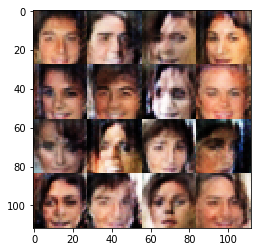

Timestamp 20170803-16-32-30.426 -  Epoch 1/1 -  Step 8010 -  D Loss: 0.8891 - G Loss: 2.7905
Timestamp 20170803-16-32-37.131 -  Epoch 1/1 -  Step 8020 -  D Loss: 0.7947 - G Loss: 1.5453
Timestamp 20170803-16-32-43.845 -  Epoch 1/1 -  Step 8030 -  D Loss: 0.6756 - G Loss: 1.2905
Timestamp 20170803-16-32-50.668 -  Epoch 1/1 -  Step 8040 -  D Loss: 1.2043 - G Loss: 0.5769
Timestamp 20170803-16-32-57.377 -  Epoch 1/1 -  Step 8050 -  D Loss: 0.6463 - G Loss: 1.6521
Timestamp 20170803-16-33-04.294 -  Epoch 1/1 -  Step 8060 -  D Loss: 0.8474 - G Loss: 1.0706
Timestamp 20170803-16-33-11.266 -  Epoch 1/1 -  Step 8070 -  D Loss: 0.6531 - G Loss: 1.7109
Timestamp 20170803-16-33-18.240 -  Epoch 1/1 -  Step 8080 -  D Loss: 1.1504 - G Loss: 1.1307
Timestamp 20170803-16-33-25.195 -  Epoch 1/1 -  Step 8090 -  D Loss: 0.6849 - G Loss: 2.3631
Timestamp 20170803-16-33-32.184 -  Epoch 1/1 -  Step 8100 -  D Loss: 1.0872 - G Loss: 0.9050


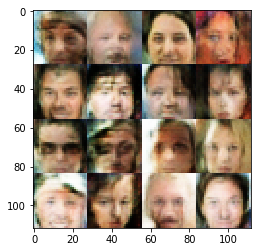

Timestamp 20170803-16-33-39.691 -  Epoch 1/1 -  Step 8110 -  D Loss: 0.9139 - G Loss: 1.2545
Timestamp 20170803-16-33-46.437 -  Epoch 1/1 -  Step 8120 -  D Loss: 0.8332 - G Loss: 1.7851
Timestamp 20170803-16-33-53.124 -  Epoch 1/1 -  Step 8130 -  D Loss: 0.5081 - G Loss: 2.3674
Timestamp 20170803-16-34-00.329 -  Epoch 1/1 -  Step 8140 -  D Loss: 0.8537 - G Loss: 0.9300
Timestamp 20170803-16-34-07.632 -  Epoch 1/1 -  Step 8150 -  D Loss: 1.0205 - G Loss: 1.3957
Timestamp 20170803-16-34-14.913 -  Epoch 1/1 -  Step 8160 -  D Loss: 0.9051 - G Loss: 1.5375
Timestamp 20170803-16-34-22.738 -  Epoch 1/1 -  Step 8170 -  D Loss: 1.1427 - G Loss: 0.8340
Timestamp 20170803-16-34-29.757 -  Epoch 1/1 -  Step 8180 -  D Loss: 0.6236 - G Loss: 2.5066
Timestamp 20170803-16-34-36.735 -  Epoch 1/1 -  Step 8190 -  D Loss: 0.6238 - G Loss: 2.1881
Timestamp 20170803-16-34-43.837 -  Epoch 1/1 -  Step 8200 -  D Loss: 1.2964 - G Loss: 0.4034


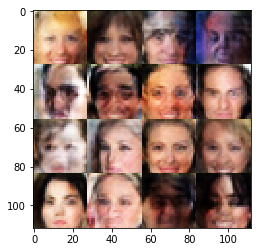

Timestamp 20170803-16-34-51.596 -  Epoch 1/1 -  Step 8210 -  D Loss: 0.6525 - G Loss: 2.4563
Timestamp 20170803-16-34-58.674 -  Epoch 1/1 -  Step 8220 -  D Loss: 1.0219 - G Loss: 1.0652
Timestamp 20170803-16-35-05.600 -  Epoch 1/1 -  Step 8230 -  D Loss: 0.5437 - G Loss: 2.3182
Timestamp 20170803-16-35-12.844 -  Epoch 1/1 -  Step 8240 -  D Loss: 0.8761 - G Loss: 1.6375
Timestamp 20170803-16-35-19.798 -  Epoch 1/1 -  Step 8250 -  D Loss: 0.9860 - G Loss: 1.6751
Timestamp 20170803-16-35-26.678 -  Epoch 1/1 -  Step 8260 -  D Loss: 0.8933 - G Loss: 1.2678
Timestamp 20170803-16-35-33.439 -  Epoch 1/1 -  Step 8270 -  D Loss: 0.7468 - G Loss: 1.5325
Timestamp 20170803-16-35-40.277 -  Epoch 1/1 -  Step 8280 -  D Loss: 1.0942 - G Loss: 1.1263
Timestamp 20170803-16-35-47.121 -  Epoch 1/1 -  Step 8290 -  D Loss: 0.6283 - G Loss: 2.4563
Timestamp 20170803-16-35-54.186 -  Epoch 1/1 -  Step 8300 -  D Loss: 0.6710 - G Loss: 1.5512


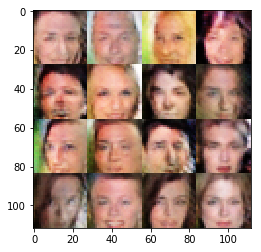

Timestamp 20170803-16-36-01.717 -  Epoch 1/1 -  Step 8310 -  D Loss: 0.4542 - G Loss: 3.2046
Timestamp 20170803-16-36-08.565 -  Epoch 1/1 -  Step 8320 -  D Loss: 0.7463 - G Loss: 1.4600
Timestamp 20170803-16-36-15.557 -  Epoch 1/1 -  Step 8330 -  D Loss: 1.0423 - G Loss: 0.9371
Timestamp 20170803-16-36-22.328 -  Epoch 1/1 -  Step 8340 -  D Loss: 1.0735 - G Loss: 0.8450
Timestamp 20170803-16-36-29.077 -  Epoch 1/1 -  Step 8350 -  D Loss: 0.6551 - G Loss: 2.3714
Timestamp 20170803-16-36-35.903 -  Epoch 1/1 -  Step 8360 -  D Loss: 0.8945 - G Loss: 1.4632
Timestamp 20170803-16-36-42.623 -  Epoch 1/1 -  Step 8370 -  D Loss: 0.6955 - G Loss: 1.5205
Timestamp 20170803-16-36-49.463 -  Epoch 1/1 -  Step 8380 -  D Loss: 0.7311 - G Loss: 1.8164
Timestamp 20170803-16-36-56.566 -  Epoch 1/1 -  Step 8390 -  D Loss: 0.7404 - G Loss: 1.4255
Timestamp 20170803-16-37-03.544 -  Epoch 1/1 -  Step 8400 -  D Loss: 0.6035 - G Loss: 1.9220


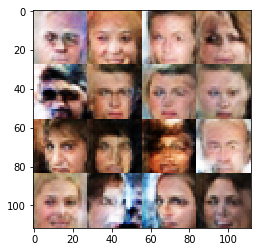

Timestamp 20170803-16-37-11.179 -  Epoch 1/1 -  Step 8410 -  D Loss: 0.7349 - G Loss: 1.0949
Timestamp 20170803-16-37-18.554 -  Epoch 1/1 -  Step 8420 -  D Loss: 0.8379 - G Loss: 1.2128
Timestamp 20170803-16-37-25.693 -  Epoch 1/1 -  Step 8430 -  D Loss: 0.5489 - G Loss: 2.3265
Timestamp 20170803-16-37-32.830 -  Epoch 1/1 -  Step 8440 -  D Loss: 0.6590 - G Loss: 1.4563
Timestamp 20170803-16-37-40.009 -  Epoch 1/1 -  Step 8450 -  D Loss: 0.8255 - G Loss: 1.2705
Timestamp 20170803-16-37-47.176 -  Epoch 1/1 -  Step 8460 -  D Loss: 0.8577 - G Loss: 2.5746
Timestamp 20170803-16-37-54.028 -  Epoch 1/1 -  Step 8470 -  D Loss: 1.1248 - G Loss: 0.5656
Timestamp 20170803-16-38-00.750 -  Epoch 1/1 -  Step 8480 -  D Loss: 0.6225 - G Loss: 2.0392
Timestamp 20170803-16-38-07.530 -  Epoch 1/1 -  Step 8490 -  D Loss: 0.7152 - G Loss: 3.3768
Timestamp 20170803-16-38-14.227 -  Epoch 1/1 -  Step 8500 -  D Loss: 0.5345 - G Loss: 2.0314


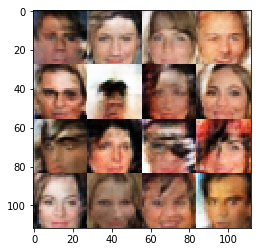

Timestamp 20170803-16-38-22.233 -  Epoch 1/1 -  Step 8510 -  D Loss: 0.7360 - G Loss: 1.4927
Timestamp 20170803-16-38-29.083 -  Epoch 1/1 -  Step 8520 -  D Loss: 0.7705 - G Loss: 2.4770
Timestamp 20170803-16-38-35.951 -  Epoch 1/1 -  Step 8530 -  D Loss: 0.7802 - G Loss: 1.6267
Timestamp 20170803-16-38-42.916 -  Epoch 1/1 -  Step 8540 -  D Loss: 1.0090 - G Loss: 1.3134
Timestamp 20170803-16-38-49.950 -  Epoch 1/1 -  Step 8550 -  D Loss: 1.0530 - G Loss: 0.9149
Timestamp 20170803-16-38-56.931 -  Epoch 1/1 -  Step 8560 -  D Loss: 0.7158 - G Loss: 1.5918
Timestamp 20170803-16-39-03.869 -  Epoch 1/1 -  Step 8570 -  D Loss: 0.9587 - G Loss: 0.9502
Timestamp 20170803-16-39-10.799 -  Epoch 1/1 -  Step 8580 -  D Loss: 0.7433 - G Loss: 2.9796
Timestamp 20170803-16-39-17.973 -  Epoch 1/1 -  Step 8590 -  D Loss: 0.7679 - G Loss: 1.7371
Timestamp 20170803-16-39-24.893 -  Epoch 1/1 -  Step 8600 -  D Loss: 0.9447 - G Loss: 0.9535


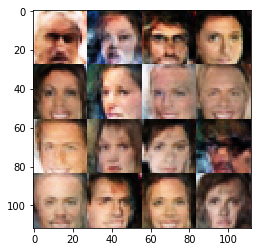

Timestamp 20170803-16-39-32.591 -  Epoch 1/1 -  Step 8610 -  D Loss: 1.0752 - G Loss: 1.1578
Timestamp 20170803-16-39-39.503 -  Epoch 1/1 -  Step 8620 -  D Loss: 0.9934 - G Loss: 1.4169
Timestamp 20170803-16-39-46.545 -  Epoch 1/1 -  Step 8630 -  D Loss: 0.7045 - G Loss: 1.8759
Timestamp 20170803-16-39-53.562 -  Epoch 1/1 -  Step 8640 -  D Loss: 0.7197 - G Loss: 3.1123
Timestamp 20170803-16-40-00.485 -  Epoch 1/1 -  Step 8650 -  D Loss: 0.8231 - G Loss: 1.6053
Timestamp 20170803-16-40-07.391 -  Epoch 1/1 -  Step 8660 -  D Loss: 0.9949 - G Loss: 0.9854
Timestamp 20170803-16-40-14.403 -  Epoch 1/1 -  Step 8670 -  D Loss: 1.3827 - G Loss: 0.8102
Timestamp 20170803-16-40-21.305 -  Epoch 1/1 -  Step 8680 -  D Loss: 0.7404 - G Loss: 1.4573
Timestamp 20170803-16-40-28.166 -  Epoch 1/1 -  Step 8690 -  D Loss: 0.9989 - G Loss: 1.1287
Timestamp 20170803-16-40-35.159 -  Epoch 1/1 -  Step 8700 -  D Loss: 0.8137 - G Loss: 1.6857


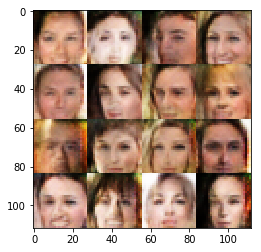

Timestamp 20170803-16-40-42.915 -  Epoch 1/1 -  Step 8710 -  D Loss: 1.0065 - G Loss: 0.8718
Timestamp 20170803-16-40-50.178 -  Epoch 1/1 -  Step 8720 -  D Loss: 0.9903 - G Loss: 1.1669
Timestamp 20170803-16-40-57.412 -  Epoch 1/1 -  Step 8730 -  D Loss: 0.8154 - G Loss: 1.4208
Timestamp 20170803-16-41-04.690 -  Epoch 1/1 -  Step 8740 -  D Loss: 1.0428 - G Loss: 1.0704
Timestamp 20170803-16-41-12.246 -  Epoch 1/1 -  Step 8750 -  D Loss: 0.8287 - G Loss: 1.2352
Timestamp 20170803-16-41-19.973 -  Epoch 1/1 -  Step 8760 -  D Loss: 0.9271 - G Loss: 1.5483
Timestamp 20170803-16-41-27.343 -  Epoch 1/1 -  Step 8770 -  D Loss: 0.7604 - G Loss: 1.5477
Timestamp 20170803-16-41-34.647 -  Epoch 1/1 -  Step 8780 -  D Loss: 0.7738 - G Loss: 1.9788
Timestamp 20170803-16-41-42.009 -  Epoch 1/1 -  Step 8790 -  D Loss: 0.9187 - G Loss: 1.1173
Timestamp 20170803-16-41-49.417 -  Epoch 1/1 -  Step 8800 -  D Loss: 0.5259 - G Loss: 2.3223


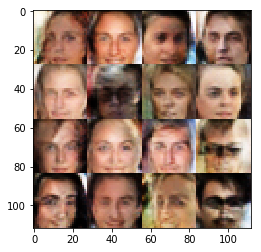

Timestamp 20170803-16-41-57.872 -  Epoch 1/1 -  Step 8810 -  D Loss: 0.6832 - G Loss: 2.3134
Timestamp 20170803-16-42-05.189 -  Epoch 1/1 -  Step 8820 -  D Loss: 1.0810 - G Loss: 2.9612
Timestamp 20170803-16-42-12.644 -  Epoch 1/1 -  Step 8830 -  D Loss: 0.7792 - G Loss: 2.2658
Timestamp 20170803-16-42-19.938 -  Epoch 1/1 -  Step 8840 -  D Loss: 0.6996 - G Loss: 1.6362
Timestamp 20170803-16-42-27.505 -  Epoch 1/1 -  Step 8850 -  D Loss: 0.6837 - G Loss: 1.3695
Timestamp 20170803-16-42-34.932 -  Epoch 1/1 -  Step 8860 -  D Loss: 0.6763 - G Loss: 1.8127
Timestamp 20170803-16-42-42.190 -  Epoch 1/1 -  Step 8870 -  D Loss: 0.7707 - G Loss: 1.7118
Timestamp 20170803-16-42-49.677 -  Epoch 1/1 -  Step 8880 -  D Loss: 0.7782 - G Loss: 1.3617
Timestamp 20170803-16-42-57.068 -  Epoch 1/1 -  Step 8890 -  D Loss: 0.7499 - G Loss: 1.5475
Timestamp 20170803-16-43-04.331 -  Epoch 1/1 -  Step 8900 -  D Loss: 0.8719 - G Loss: 1.9081


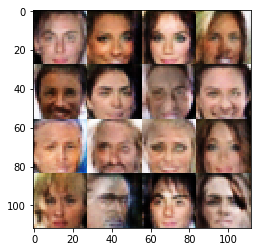

Timestamp 20170803-16-43-12.452 -  Epoch 1/1 -  Step 8910 -  D Loss: 0.9149 - G Loss: 1.0412
Timestamp 20170803-16-43-19.809 -  Epoch 1/1 -  Step 8920 -  D Loss: 0.6940 - G Loss: 2.0833
Timestamp 20170803-16-43-27.148 -  Epoch 1/1 -  Step 8930 -  D Loss: 0.6670 - G Loss: 1.4525
Timestamp 20170803-16-43-34.501 -  Epoch 1/1 -  Step 8940 -  D Loss: 1.0305 - G Loss: 0.8845
Timestamp 20170803-16-43-41.765 -  Epoch 1/1 -  Step 8950 -  D Loss: 0.7254 - G Loss: 1.1093
Timestamp 20170803-16-43-48.835 -  Epoch 1/1 -  Step 8960 -  D Loss: 0.7749 - G Loss: 1.5174
Timestamp 20170803-16-43-55.891 -  Epoch 1/1 -  Step 8970 -  D Loss: 0.7459 - G Loss: 1.7802
Timestamp 20170803-16-44-02.992 -  Epoch 1/1 -  Step 8980 -  D Loss: 0.8176 - G Loss: 1.0225
Timestamp 20170803-16-44-09.965 -  Epoch 1/1 -  Step 8990 -  D Loss: 0.9075 - G Loss: 2.0075
Timestamp 20170803-16-44-16.896 -  Epoch 1/1 -  Step 9000 -  D Loss: 0.8849 - G Loss: 1.3019


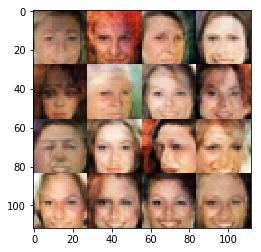

Timestamp 20170803-16-44-24.528 -  Epoch 1/1 -  Step 9010 -  D Loss: 0.9602 - G Loss: 1.5282
Timestamp 20170803-16-44-31.511 -  Epoch 1/1 -  Step 9020 -  D Loss: 0.6194 - G Loss: 2.0366
Timestamp 20170803-16-44-38.497 -  Epoch 1/1 -  Step 9030 -  D Loss: 0.8216 - G Loss: 2.7904
Timestamp 20170803-16-44-45.376 -  Epoch 1/1 -  Step 9040 -  D Loss: 0.8113 - G Loss: 1.6201
Timestamp 20170803-16-44-52.062 -  Epoch 1/1 -  Step 9050 -  D Loss: 0.7819 - G Loss: 1.6379
Timestamp 20170803-16-44-58.829 -  Epoch 1/1 -  Step 9060 -  D Loss: 1.0416 - G Loss: 1.2590
Timestamp 20170803-16-45-05.558 -  Epoch 1/1 -  Step 9070 -  D Loss: 1.1838 - G Loss: 0.7983
Timestamp 20170803-16-45-12.255 -  Epoch 1/1 -  Step 9080 -  D Loss: 0.9065 - G Loss: 1.4557
Timestamp 20170803-16-45-18.946 -  Epoch 1/1 -  Step 9090 -  D Loss: 0.8708 - G Loss: 1.6249
Timestamp 20170803-16-45-25.694 -  Epoch 1/1 -  Step 9100 -  D Loss: 0.6363 - G Loss: 2.2700


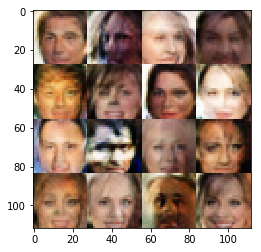

Timestamp 20170803-16-45-33.437 -  Epoch 1/1 -  Step 9110 -  D Loss: 0.8998 - G Loss: 1.5975
Timestamp 20170803-16-45-41.160 -  Epoch 1/1 -  Step 9120 -  D Loss: 0.9415 - G Loss: 1.0355
Timestamp 20170803-16-45-48.230 -  Epoch 1/1 -  Step 9130 -  D Loss: 0.8396 - G Loss: 1.7669
Timestamp 20170803-16-45-55.278 -  Epoch 1/1 -  Step 9140 -  D Loss: 0.4325 - G Loss: 3.0043
Timestamp 20170803-16-46-02.286 -  Epoch 1/1 -  Step 9150 -  D Loss: 0.7005 - G Loss: 1.6664
Timestamp 20170803-16-46-09.109 -  Epoch 1/1 -  Step 9160 -  D Loss: 0.7442 - G Loss: 0.7473
Timestamp 20170803-16-46-15.968 -  Epoch 1/1 -  Step 9170 -  D Loss: 0.6141 - G Loss: 1.6820
Timestamp 20170803-16-46-22.855 -  Epoch 1/1 -  Step 9180 -  D Loss: 0.7939 - G Loss: 1.3652
Timestamp 20170803-16-46-29.770 -  Epoch 1/1 -  Step 9190 -  D Loss: 0.7907 - G Loss: 1.4081
Timestamp 20170803-16-46-36.668 -  Epoch 1/1 -  Step 9200 -  D Loss: 0.8000 - G Loss: 2.5270


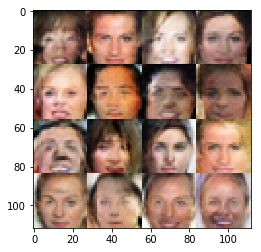

Timestamp 20170803-16-46-44.176 -  Epoch 1/1 -  Step 9210 -  D Loss: 0.8577 - G Loss: 1.3166
Timestamp 20170803-16-46-51.334 -  Epoch 1/1 -  Step 9220 -  D Loss: 0.5274 - G Loss: 2.1887
Timestamp 20170803-16-46-58.222 -  Epoch 1/1 -  Step 9230 -  D Loss: 1.1748 - G Loss: 0.7526
Timestamp 20170803-16-47-05.095 -  Epoch 1/1 -  Step 9240 -  D Loss: 0.9399 - G Loss: 1.8697
Timestamp 20170803-16-47-12.053 -  Epoch 1/1 -  Step 9250 -  D Loss: 0.7159 - G Loss: 1.5084
Timestamp 20170803-16-47-18.856 -  Epoch 1/1 -  Step 9260 -  D Loss: 0.6017 - G Loss: 1.7911
Timestamp 20170803-16-47-25.609 -  Epoch 1/1 -  Step 9270 -  D Loss: 0.6534 - G Loss: 1.9029
Timestamp 20170803-16-47-32.338 -  Epoch 1/1 -  Step 9280 -  D Loss: 0.8710 - G Loss: 1.5324
Timestamp 20170803-16-47-39.085 -  Epoch 1/1 -  Step 9290 -  D Loss: 0.9558 - G Loss: 1.0291
Timestamp 20170803-16-47-45.791 -  Epoch 1/1 -  Step 9300 -  D Loss: 0.7568 - G Loss: 2.0169


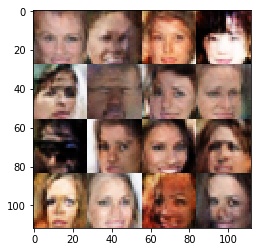

Timestamp 20170803-16-47-53.818 -  Epoch 1/1 -  Step 9310 -  D Loss: 0.6243 - G Loss: 1.9825
Timestamp 20170803-16-48-01.234 -  Epoch 1/1 -  Step 9320 -  D Loss: 0.7753 - G Loss: 1.3446
Timestamp 20170803-16-48-08.430 -  Epoch 1/1 -  Step 9330 -  D Loss: 1.1461 - G Loss: 0.7295
Timestamp 20170803-16-48-15.559 -  Epoch 1/1 -  Step 9340 -  D Loss: 0.8631 - G Loss: 0.8345
Timestamp 20170803-16-48-22.793 -  Epoch 1/1 -  Step 9350 -  D Loss: 0.8748 - G Loss: 0.8450
Timestamp 20170803-16-48-29.847 -  Epoch 1/1 -  Step 9360 -  D Loss: 0.7720 - G Loss: 1.4127
Timestamp 20170803-16-48-36.574 -  Epoch 1/1 -  Step 9370 -  D Loss: 0.9155 - G Loss: 0.6915
Timestamp 20170803-16-48-43.274 -  Epoch 1/1 -  Step 9380 -  D Loss: 0.9571 - G Loss: 1.3945
Timestamp 20170803-16-48-50.098 -  Epoch 1/1 -  Step 9390 -  D Loss: 0.8670 - G Loss: 1.5049
Timestamp 20170803-16-48-56.775 -  Epoch 1/1 -  Step 9400 -  D Loss: 0.6753 - G Loss: 1.4689


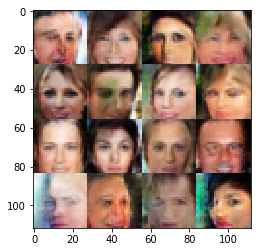

Timestamp 20170803-16-49-04.134 -  Epoch 1/1 -  Step 9410 -  D Loss: 0.7492 - G Loss: 1.7415
Timestamp 20170803-16-49-10.856 -  Epoch 1/1 -  Step 9420 -  D Loss: 0.7351 - G Loss: 1.8740
Timestamp 20170803-16-49-17.661 -  Epoch 1/1 -  Step 9430 -  D Loss: 0.7566 - G Loss: 1.3238
Timestamp 20170803-16-49-24.419 -  Epoch 1/1 -  Step 9440 -  D Loss: 0.5873 - G Loss: 2.0375
Timestamp 20170803-16-49-31.145 -  Epoch 1/1 -  Step 9450 -  D Loss: 0.6724 - G Loss: 1.7858
Timestamp 20170803-16-49-38.047 -  Epoch 1/1 -  Step 9460 -  D Loss: 0.5718 - G Loss: 2.4724
Timestamp 20170803-16-49-45.020 -  Epoch 1/1 -  Step 9470 -  D Loss: 1.2191 - G Loss: 0.4805
Timestamp 20170803-16-49-52.002 -  Epoch 1/1 -  Step 9480 -  D Loss: 0.7887 - G Loss: 1.3573
Timestamp 20170803-16-49-58.833 -  Epoch 1/1 -  Step 9490 -  D Loss: 0.8770 - G Loss: 1.2397
Timestamp 20170803-16-50-05.718 -  Epoch 1/1 -  Step 9500 -  D Loss: 0.9612 - G Loss: 1.8658


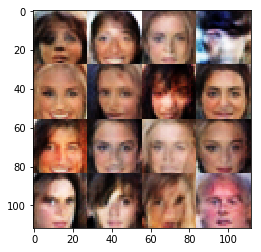

Timestamp 20170803-16-50-13.284 -  Epoch 1/1 -  Step 9510 -  D Loss: 1.2833 - G Loss: 0.6411
Timestamp 20170803-16-50-20.165 -  Epoch 1/1 -  Step 9520 -  D Loss: 1.0396 - G Loss: 0.8302
Timestamp 20170803-16-50-27.032 -  Epoch 1/1 -  Step 9530 -  D Loss: 1.2089 - G Loss: 0.7895
Timestamp 20170803-16-50-34.009 -  Epoch 1/1 -  Step 9540 -  D Loss: 0.9126 - G Loss: 1.2960
Timestamp 20170803-16-50-40.940 -  Epoch 1/1 -  Step 9550 -  D Loss: 0.7798 - G Loss: 1.7974
Timestamp 20170803-16-50-47.820 -  Epoch 1/1 -  Step 9560 -  D Loss: 1.0421 - G Loss: 1.2563
Timestamp 20170803-16-50-54.851 -  Epoch 1/1 -  Step 9570 -  D Loss: 0.8276 - G Loss: 1.6993
Timestamp 20170803-16-51-01.907 -  Epoch 1/1 -  Step 9580 -  D Loss: 0.6139 - G Loss: 1.3345
Timestamp 20170803-16-51-08.781 -  Epoch 1/1 -  Step 9590 -  D Loss: 0.9111 - G Loss: 2.0180
Timestamp 20170803-16-51-15.683 -  Epoch 1/1 -  Step 9600 -  D Loss: 1.1488 - G Loss: 0.8992


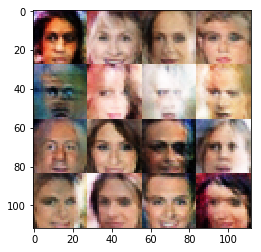

Timestamp 20170803-16-51-23.363 -  Epoch 1/1 -  Step 9610 -  D Loss: 0.9567 - G Loss: 1.6763
Timestamp 20170803-16-51-30.326 -  Epoch 1/1 -  Step 9620 -  D Loss: 0.7883 - G Loss: 1.7998
Timestamp 20170803-16-51-37.189 -  Epoch 1/1 -  Step 9630 -  D Loss: 0.9621 - G Loss: 1.1426
Timestamp 20170803-16-51-44.056 -  Epoch 1/1 -  Step 9640 -  D Loss: 0.5844 - G Loss: 1.8934
Timestamp 20170803-16-51-51.060 -  Epoch 1/1 -  Step 9650 -  D Loss: 0.5901 - G Loss: 1.2300
Timestamp 20170803-16-51-57.865 -  Epoch 1/1 -  Step 9660 -  D Loss: 0.6454 - G Loss: 2.0674
Timestamp 20170803-16-52-04.747 -  Epoch 1/1 -  Step 9670 -  D Loss: 1.0799 - G Loss: 0.9509
Timestamp 20170803-16-52-11.644 -  Epoch 1/1 -  Step 9680 -  D Loss: 1.4584 - G Loss: 0.4807
Timestamp 20170803-16-52-18.634 -  Epoch 1/1 -  Step 9690 -  D Loss: 0.8712 - G Loss: 1.3352
Timestamp 20170803-16-52-25.512 -  Epoch 1/1 -  Step 9700 -  D Loss: 0.8641 - G Loss: 1.3591


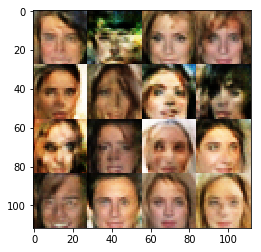

Timestamp 20170803-16-52-33.233 -  Epoch 1/1 -  Step 9710 -  D Loss: 0.7647 - G Loss: 1.0881
Timestamp 20170803-16-52-40.182 -  Epoch 1/1 -  Step 9720 -  D Loss: 1.1496 - G Loss: 1.0349
Timestamp 20170803-16-52-47.207 -  Epoch 1/1 -  Step 9730 -  D Loss: 0.6966 - G Loss: 1.9503
Timestamp 20170803-16-52-54.192 -  Epoch 1/1 -  Step 9740 -  D Loss: 1.0920 - G Loss: 0.8859
Timestamp 20170803-16-53-01.279 -  Epoch 1/1 -  Step 9750 -  D Loss: 0.9233 - G Loss: 2.7921
Timestamp 20170803-16-53-08.160 -  Epoch 1/1 -  Step 9760 -  D Loss: 0.4723 - G Loss: 2.4693
Timestamp 20170803-16-53-15.155 -  Epoch 1/1 -  Step 9770 -  D Loss: 1.0879 - G Loss: 1.6684
Timestamp 20170803-16-53-22.257 -  Epoch 1/1 -  Step 9780 -  D Loss: 0.7610 - G Loss: 1.8389
Timestamp 20170803-16-53-29.252 -  Epoch 1/1 -  Step 9790 -  D Loss: 0.8846 - G Loss: 1.2338
Timestamp 20170803-16-53-36.130 -  Epoch 1/1 -  Step 9800 -  D Loss: 1.1758 - G Loss: 1.3269


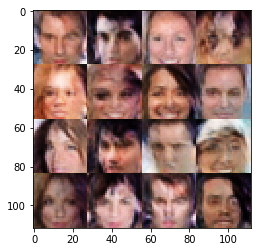

Timestamp 20170803-16-53-43.734 -  Epoch 1/1 -  Step 9810 -  D Loss: 0.8485 - G Loss: 1.1334
Timestamp 20170803-16-53-50.647 -  Epoch 1/1 -  Step 9820 -  D Loss: 0.6627 - G Loss: 1.2113
Timestamp 20170803-16-53-57.543 -  Epoch 1/1 -  Step 9830 -  D Loss: 1.0302 - G Loss: 1.3658
Timestamp 20170803-16-54-04.395 -  Epoch 1/1 -  Step 9840 -  D Loss: 1.1146 - G Loss: 1.0861
Timestamp 20170803-16-54-11.535 -  Epoch 1/1 -  Step 9850 -  D Loss: 0.6520 - G Loss: 1.9011
Timestamp 20170803-16-54-18.594 -  Epoch 1/1 -  Step 9860 -  D Loss: 0.7105 - G Loss: 1.0995
Timestamp 20170803-16-54-25.496 -  Epoch 1/1 -  Step 9870 -  D Loss: 0.6428 - G Loss: 1.5694
Timestamp 20170803-16-54-32.541 -  Epoch 1/1 -  Step 9880 -  D Loss: 0.8522 - G Loss: 1.0494
Timestamp 20170803-16-54-39.522 -  Epoch 1/1 -  Step 9890 -  D Loss: 0.9672 - G Loss: 0.9895
Timestamp 20170803-16-54-46.523 -  Epoch 1/1 -  Step 9900 -  D Loss: 1.2229 - G Loss: 0.7786


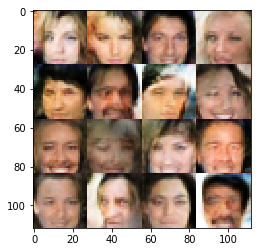

Timestamp 20170803-16-54-54.071 -  Epoch 1/1 -  Step 9910 -  D Loss: 0.7193 - G Loss: 1.2539
Timestamp 20170803-16-55-01.022 -  Epoch 1/1 -  Step 9920 -  D Loss: 0.5549 - G Loss: 2.2979
Timestamp 20170803-16-55-08.111 -  Epoch 1/1 -  Step 9930 -  D Loss: 0.7298 - G Loss: 1.7746
Timestamp 20170803-16-55-14.997 -  Epoch 1/1 -  Step 9940 -  D Loss: 0.7507 - G Loss: 1.7303
Timestamp 20170803-16-55-21.964 -  Epoch 1/1 -  Step 9950 -  D Loss: 1.0984 - G Loss: 0.8158
Timestamp 20170803-16-55-28.838 -  Epoch 1/1 -  Step 9960 -  D Loss: 0.9229 - G Loss: 1.5018
Timestamp 20170803-16-55-35.723 -  Epoch 1/1 -  Step 9970 -  D Loss: 0.8651 - G Loss: 1.9068
Timestamp 20170803-16-55-42.700 -  Epoch 1/1 -  Step 9980 -  D Loss: 0.6686 - G Loss: 1.7569
Timestamp 20170803-16-55-49.630 -  Epoch 1/1 -  Step 9990 -  D Loss: 0.7158 - G Loss: 1.9419
Timestamp 20170803-16-55-56.591 -  Epoch 1/1 -  Step 10000 -  D Loss: 0.6843 - G Loss: 2.2223


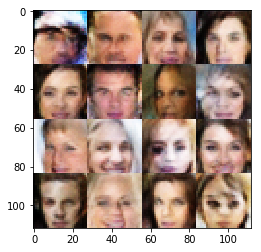

Timestamp 20170803-16-56-04.265 -  Epoch 1/1 -  Step 10010 -  D Loss: 0.6946 - G Loss: 1.8450
Timestamp 20170803-16-56-11.196 -  Epoch 1/1 -  Step 10020 -  D Loss: 0.8597 - G Loss: 1.1196
Timestamp 20170803-16-56-18.072 -  Epoch 1/1 -  Step 10030 -  D Loss: 0.8643 - G Loss: 1.2317
Timestamp 20170803-16-56-24.982 -  Epoch 1/1 -  Step 10040 -  D Loss: 1.0178 - G Loss: 0.8549
Timestamp 20170803-16-56-31.940 -  Epoch 1/1 -  Step 10050 -  D Loss: 0.8007 - G Loss: 1.5829
Timestamp 20170803-16-56-38.848 -  Epoch 1/1 -  Step 10060 -  D Loss: 0.9521 - G Loss: 1.0687
Timestamp 20170803-16-56-45.790 -  Epoch 1/1 -  Step 10070 -  D Loss: 0.5409 - G Loss: 3.3254
Timestamp 20170803-16-56-52.742 -  Epoch 1/1 -  Step 10080 -  D Loss: 0.5931 - G Loss: 2.3030
Timestamp 20170803-16-56-59.675 -  Epoch 1/1 -  Step 10090 -  D Loss: 0.8498 - G Loss: 1.8493
Timestamp 20170803-16-57-06.736 -  Epoch 1/1 -  Step 10100 -  D Loss: 0.8003 - G Loss: 1.5109


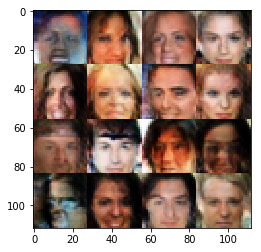

Timestamp 20170803-16-57-14.236 -  Epoch 1/1 -  Step 10110 -  D Loss: 0.7250 - G Loss: 2.2542
Timestamp 20170803-16-57-21.142 -  Epoch 1/1 -  Step 10120 -  D Loss: 0.5788 - G Loss: 1.8110
Timestamp 20170803-16-57-28.130 -  Epoch 1/1 -  Step 10130 -  D Loss: 0.5593 - G Loss: 2.2144
Timestamp 20170803-16-57-35.077 -  Epoch 1/1 -  Step 10140 -  D Loss: 0.7581 - G Loss: 1.4231
Timestamp 20170803-16-57-41.835 -  Epoch 1/1 -  Step 10150 -  D Loss: 0.9740 - G Loss: 1.0150
Timestamp 20170803-16-57-48.664 -  Epoch 1/1 -  Step 10160 -  D Loss: 0.6680 - G Loss: 1.9381
Timestamp 20170803-16-57-55.618 -  Epoch 1/1 -  Step 10170 -  D Loss: 0.5893 - G Loss: 1.5132
Timestamp 20170803-16-58-02.660 -  Epoch 1/1 -  Step 10180 -  D Loss: 0.9522 - G Loss: 1.0132
Timestamp 20170803-16-58-09.536 -  Epoch 1/1 -  Step 10190 -  D Loss: 0.6548 - G Loss: 1.2518
Timestamp 20170803-16-58-16.474 -  Epoch 1/1 -  Step 10200 -  D Loss: 0.8661 - G Loss: 1.3177


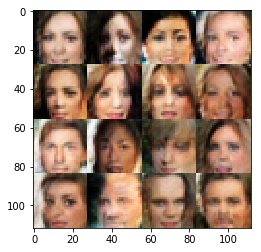

Timestamp 20170803-16-58-24.051 -  Epoch 1/1 -  Step 10210 -  D Loss: 0.8825 - G Loss: 1.3898
Timestamp 20170803-16-58-30.946 -  Epoch 1/1 -  Step 10220 -  D Loss: 1.1519 - G Loss: 1.1678
Timestamp 20170803-16-58-38.020 -  Epoch 1/1 -  Step 10230 -  D Loss: 0.7769 - G Loss: 1.7168
Timestamp 20170803-16-58-45.408 -  Epoch 1/1 -  Step 10240 -  D Loss: 0.7338 - G Loss: 1.3963
Timestamp 20170803-16-58-52.646 -  Epoch 1/1 -  Step 10250 -  D Loss: 1.1299 - G Loss: 1.0503
Timestamp 20170803-16-59-00.091 -  Epoch 1/1 -  Step 10260 -  D Loss: 0.7274 - G Loss: 1.7768
Timestamp 20170803-16-59-07.513 -  Epoch 1/1 -  Step 10270 -  D Loss: 0.8241 - G Loss: 1.1238
Timestamp 20170803-16-59-14.814 -  Epoch 1/1 -  Step 10280 -  D Loss: 1.1092 - G Loss: 0.7718
Timestamp 20170803-16-59-22.518 -  Epoch 1/1 -  Step 10290 -  D Loss: 0.9187 - G Loss: 1.8229
Timestamp 20170803-16-59-30.004 -  Epoch 1/1 -  Step 10300 -  D Loss: 1.1830 - G Loss: 1.2710


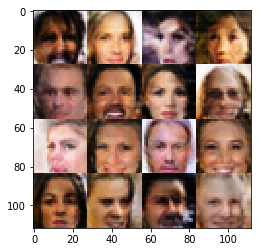

Timestamp 20170803-16-59-38.181 -  Epoch 1/1 -  Step 10310 -  D Loss: 1.1789 - G Loss: 0.4704
Timestamp 20170803-16-59-45.621 -  Epoch 1/1 -  Step 10320 -  D Loss: 0.9234 - G Loss: 1.1896
Timestamp 20170803-16-59-53.025 -  Epoch 1/1 -  Step 10330 -  D Loss: 0.8187 - G Loss: 1.5398
Timestamp 20170803-17-00-00.537 -  Epoch 1/1 -  Step 10340 -  D Loss: 0.9992 - G Loss: 1.1106
Timestamp 20170803-17-00-08.322 -  Epoch 1/1 -  Step 10350 -  D Loss: 0.9257 - G Loss: 0.8470
Timestamp 20170803-17-00-15.919 -  Epoch 1/1 -  Step 10360 -  D Loss: 0.7049 - G Loss: 2.0906
Timestamp 20170803-17-00-23.655 -  Epoch 1/1 -  Step 10370 -  D Loss: 0.9822 - G Loss: 1.2739
Timestamp 20170803-17-00-31.298 -  Epoch 1/1 -  Step 10380 -  D Loss: 0.6399 - G Loss: 1.3381
Timestamp 20170803-17-00-39.075 -  Epoch 1/1 -  Step 10390 -  D Loss: 0.6148 - G Loss: 2.0935
Timestamp 20170803-17-00-46.760 -  Epoch 1/1 -  Step 10400 -  D Loss: 0.8189 - G Loss: 1.9491


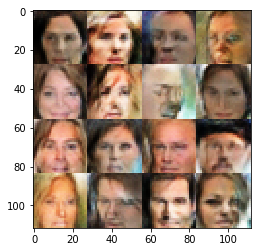

Timestamp 20170803-17-00-55.318 -  Epoch 1/1 -  Step 10410 -  D Loss: 0.8143 - G Loss: 2.0903
Timestamp 20170803-17-01-03.028 -  Epoch 1/1 -  Step 10420 -  D Loss: 0.7668 - G Loss: 1.4315
Timestamp 20170803-17-01-10.607 -  Epoch 1/1 -  Step 10430 -  D Loss: 0.6059 - G Loss: 1.8971
Timestamp 20170803-17-01-18.247 -  Epoch 1/1 -  Step 10440 -  D Loss: 0.7172 - G Loss: 1.6592
Timestamp 20170803-17-01-26.091 -  Epoch 1/1 -  Step 10450 -  D Loss: 0.6232 - G Loss: 1.6349
Timestamp 20170803-17-01-33.916 -  Epoch 1/1 -  Step 10460 -  D Loss: 0.8154 - G Loss: 1.2195
Timestamp 20170803-17-01-41.795 -  Epoch 1/1 -  Step 10470 -  D Loss: 0.5563 - G Loss: 2.8214
Timestamp 20170803-17-01-49.432 -  Epoch 1/1 -  Step 10480 -  D Loss: 1.2004 - G Loss: 1.0747
Timestamp 20170803-17-01-57.134 -  Epoch 1/1 -  Step 10490 -  D Loss: 0.7436 - G Loss: 1.9556
Timestamp 20170803-17-02-04.936 -  Epoch 1/1 -  Step 10500 -  D Loss: 0.6631 - G Loss: 1.5981


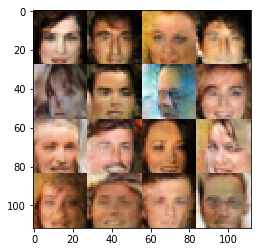

Timestamp 20170803-17-02-13.766 -  Epoch 1/1 -  Step 10510 -  D Loss: 0.8559 - G Loss: 0.9075
Timestamp 20170803-17-02-21.423 -  Epoch 1/1 -  Step 10520 -  D Loss: 0.8219 - G Loss: 1.6557
Timestamp 20170803-17-02-29.422 -  Epoch 1/1 -  Step 10530 -  D Loss: 0.5482 - G Loss: 1.9281
Timestamp 20170803-17-02-37.803 -  Epoch 1/1 -  Step 10540 -  D Loss: 0.6236 - G Loss: 2.1067
Timestamp 20170803-17-02-45.994 -  Epoch 1/1 -  Step 10550 -  D Loss: 0.7926 - G Loss: 1.5508
Timestamp 20170803-17-02-53.948 -  Epoch 1/1 -  Step 10560 -  D Loss: 1.6872 - G Loss: 0.4768
Timestamp 20170803-17-03-01.947 -  Epoch 1/1 -  Step 10570 -  D Loss: 0.8336 - G Loss: 1.2952
Timestamp 20170803-17-03-09.369 -  Epoch 1/1 -  Step 10580 -  D Loss: 0.6796 - G Loss: 1.7685
Timestamp 20170803-17-03-16.817 -  Epoch 1/1 -  Step 10590 -  D Loss: 0.9133 - G Loss: 1.1918
Timestamp 20170803-17-03-24.304 -  Epoch 1/1 -  Step 10600 -  D Loss: 0.6638 - G Loss: 2.4488


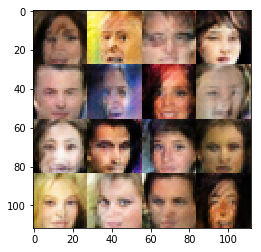

Timestamp 20170803-17-03-32.570 -  Epoch 1/1 -  Step 10610 -  D Loss: 0.7697 - G Loss: 1.9638
Timestamp 20170803-17-03-40.157 -  Epoch 1/1 -  Step 10620 -  D Loss: 0.8741 - G Loss: 1.0684
Timestamp 20170803-17-03-47.239 -  Epoch 1/1 -  Step 10630 -  D Loss: 0.8201 - G Loss: 1.4776
Timestamp 20170803-17-03-54.218 -  Epoch 1/1 -  Step 10640 -  D Loss: 0.9664 - G Loss: 0.9122
Timestamp 20170803-17-04-01.062 -  Epoch 1/1 -  Step 10650 -  D Loss: 1.2096 - G Loss: 1.3896
Timestamp 20170803-17-04-07.997 -  Epoch 1/1 -  Step 10660 -  D Loss: 0.7026 - G Loss: 1.3497
Timestamp 20170803-17-04-14.976 -  Epoch 1/1 -  Step 10670 -  D Loss: 0.8497 - G Loss: 1.2328
Timestamp 20170803-17-04-22.109 -  Epoch 1/1 -  Step 10680 -  D Loss: 0.7710 - G Loss: 2.0692
Timestamp 20170803-17-04-29.189 -  Epoch 1/1 -  Step 10690 -  D Loss: 0.8019 - G Loss: 1.4392
Timestamp 20170803-17-04-36.281 -  Epoch 1/1 -  Step 10700 -  D Loss: 0.6995 - G Loss: 1.1122


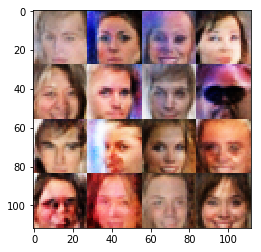

Timestamp 20170803-17-04-44.100 -  Epoch 1/1 -  Step 10710 -  D Loss: 0.8291 - G Loss: 1.3948
Timestamp 20170803-17-04-51.163 -  Epoch 1/1 -  Step 10720 -  D Loss: 0.9484 - G Loss: 1.0305
Timestamp 20170803-17-04-58.090 -  Epoch 1/1 -  Step 10730 -  D Loss: 0.7712 - G Loss: 1.5452
Timestamp 20170803-17-05-05.250 -  Epoch 1/1 -  Step 10740 -  D Loss: 0.6325 - G Loss: 2.3407
Timestamp 20170803-17-05-12.262 -  Epoch 1/1 -  Step 10750 -  D Loss: 0.8331 - G Loss: 1.8859
Timestamp 20170803-17-05-19.279 -  Epoch 1/1 -  Step 10760 -  D Loss: 0.7883 - G Loss: 1.9074
Timestamp 20170803-17-05-26.298 -  Epoch 1/1 -  Step 10770 -  D Loss: 0.7853 - G Loss: 2.5850
Timestamp 20170803-17-05-33.183 -  Epoch 1/1 -  Step 10780 -  D Loss: 1.7402 - G Loss: 0.3950
Timestamp 20170803-17-05-40.154 -  Epoch 1/1 -  Step 10790 -  D Loss: 0.5658 - G Loss: 1.7244
Timestamp 20170803-17-05-47.247 -  Epoch 1/1 -  Step 10800 -  D Loss: 0.8055 - G Loss: 1.1433


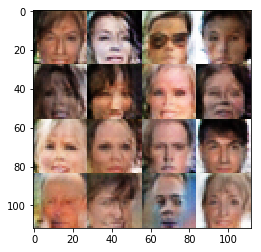

Timestamp 20170803-17-05-54.952 -  Epoch 1/1 -  Step 10810 -  D Loss: 0.6122 - G Loss: 2.0951
Timestamp 20170803-17-06-01.951 -  Epoch 1/1 -  Step 10820 -  D Loss: 1.2274 - G Loss: 1.0443
Timestamp 20170803-17-06-09.076 -  Epoch 1/1 -  Step 10830 -  D Loss: 1.1452 - G Loss: 0.6191
Timestamp 20170803-17-06-16.066 -  Epoch 1/1 -  Step 10840 -  D Loss: 0.6261 - G Loss: 2.1989
Timestamp 20170803-17-06-23.036 -  Epoch 1/1 -  Step 10850 -  D Loss: 0.6661 - G Loss: 1.0230
Timestamp 20170803-17-06-30.273 -  Epoch 1/1 -  Step 10860 -  D Loss: 0.8752 - G Loss: 1.0701
Timestamp 20170803-17-06-37.324 -  Epoch 1/1 -  Step 10870 -  D Loss: 0.6499 - G Loss: 1.6433
Timestamp 20170803-17-06-44.292 -  Epoch 1/1 -  Step 10880 -  D Loss: 1.0599 - G Loss: 1.2710
Timestamp 20170803-17-06-51.464 -  Epoch 1/1 -  Step 10890 -  D Loss: 0.7939 - G Loss: 1.8649
Timestamp 20170803-17-06-58.449 -  Epoch 1/1 -  Step 10900 -  D Loss: 0.9991 - G Loss: 1.3395


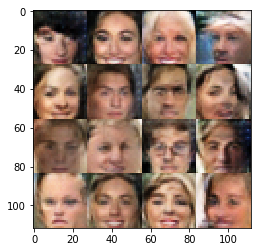

Timestamp 20170803-17-07-06.110 -  Epoch 1/1 -  Step 10910 -  D Loss: 1.3668 - G Loss: 0.6685
Timestamp 20170803-17-07-13.033 -  Epoch 1/1 -  Step 10920 -  D Loss: 0.7667 - G Loss: 1.7977
Timestamp 20170803-17-07-19.874 -  Epoch 1/1 -  Step 10930 -  D Loss: 0.7907 - G Loss: 0.7706
Timestamp 20170803-17-07-26.839 -  Epoch 1/1 -  Step 10940 -  D Loss: 0.7807 - G Loss: 1.8818
Timestamp 20170803-17-07-33.763 -  Epoch 1/1 -  Step 10950 -  D Loss: 0.7392 - G Loss: 1.7022
Timestamp 20170803-17-07-40.680 -  Epoch 1/1 -  Step 10960 -  D Loss: 0.7968 - G Loss: 1.0818
Timestamp 20170803-17-07-47.608 -  Epoch 1/1 -  Step 10970 -  D Loss: 0.7277 - G Loss: 1.8472
Timestamp 20170803-17-07-54.512 -  Epoch 1/1 -  Step 10980 -  D Loss: 0.9947 - G Loss: 0.8380
Timestamp 20170803-17-08-01.427 -  Epoch 1/1 -  Step 10990 -  D Loss: 0.8099 - G Loss: 1.5119
Timestamp 20170803-17-08-08.372 -  Epoch 1/1 -  Step 11000 -  D Loss: 0.5925 - G Loss: 1.6824


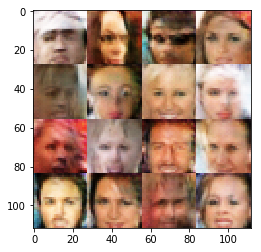

Timestamp 20170803-17-08-16.054 -  Epoch 1/1 -  Step 11010 -  D Loss: 1.4116 - G Loss: 0.9599
Timestamp 20170803-17-08-23.114 -  Epoch 1/1 -  Step 11020 -  D Loss: 1.0518 - G Loss: 0.8243
Timestamp 20170803-17-08-29.982 -  Epoch 1/1 -  Step 11030 -  D Loss: 0.8904 - G Loss: 1.6130
Timestamp 20170803-17-08-36.940 -  Epoch 1/1 -  Step 11040 -  D Loss: 0.8258 - G Loss: 1.4261
Timestamp 20170803-17-08-43.830 -  Epoch 1/1 -  Step 11050 -  D Loss: 0.6816 - G Loss: 1.5567
Timestamp 20170803-17-08-50.804 -  Epoch 1/1 -  Step 11060 -  D Loss: 0.6898 - G Loss: 1.4124
Timestamp 20170803-17-08-57.865 -  Epoch 1/1 -  Step 11070 -  D Loss: 0.9286 - G Loss: 2.1143
Timestamp 20170803-17-09-04.823 -  Epoch 1/1 -  Step 11080 -  D Loss: 0.6783 - G Loss: 2.2773
Timestamp 20170803-17-09-11.665 -  Epoch 1/1 -  Step 11090 -  D Loss: 0.5849 - G Loss: 2.5202
Timestamp 20170803-17-09-18.734 -  Epoch 1/1 -  Step 11100 -  D Loss: 0.6628 - G Loss: 2.0659


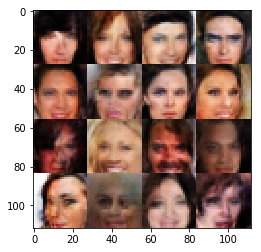

Timestamp 20170803-17-09-26.364 -  Epoch 1/1 -  Step 11110 -  D Loss: 0.7909 - G Loss: 2.0958
Timestamp 20170803-17-09-33.383 -  Epoch 1/1 -  Step 11120 -  D Loss: 0.9122 - G Loss: 1.0481
Timestamp 20170803-17-09-40.281 -  Epoch 1/1 -  Step 11130 -  D Loss: 0.9084 - G Loss: 0.7203
Timestamp 20170803-17-09-47.168 -  Epoch 1/1 -  Step 11140 -  D Loss: 1.2456 - G Loss: 0.6541
Timestamp 20170803-17-09-54.010 -  Epoch 1/1 -  Step 11150 -  D Loss: 0.9146 - G Loss: 1.3367
Timestamp 20170803-17-10-00.786 -  Epoch 1/1 -  Step 11160 -  D Loss: 0.9262 - G Loss: 1.8939
Timestamp 20170803-17-10-07.522 -  Epoch 1/1 -  Step 11170 -  D Loss: 0.9007 - G Loss: 0.9349
Timestamp 20170803-17-10-14.257 -  Epoch 1/1 -  Step 11180 -  D Loss: 0.6847 - G Loss: 1.6330
Timestamp 20170803-17-10-21.105 -  Epoch 1/1 -  Step 11190 -  D Loss: 0.5542 - G Loss: 1.9986
Timestamp 20170803-17-10-27.965 -  Epoch 1/1 -  Step 11200 -  D Loss: 0.5077 - G Loss: 2.4114


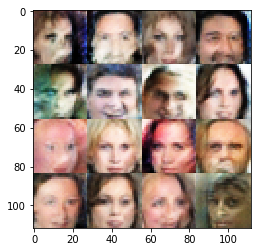

Timestamp 20170803-17-10-35.821 -  Epoch 1/1 -  Step 11210 -  D Loss: 0.7879 - G Loss: 1.4741
Timestamp 20170803-17-10-42.805 -  Epoch 1/1 -  Step 11220 -  D Loss: 0.6801 - G Loss: 1.6362
Timestamp 20170803-17-10-49.869 -  Epoch 1/1 -  Step 11230 -  D Loss: 0.9540 - G Loss: 1.3889
Timestamp 20170803-17-10-56.984 -  Epoch 1/1 -  Step 11240 -  D Loss: 1.1141 - G Loss: 1.2770
Timestamp 20170803-17-11-03.888 -  Epoch 1/1 -  Step 11250 -  D Loss: 0.7910 - G Loss: 1.3690
Timestamp 20170803-17-11-10.760 -  Epoch 1/1 -  Step 11260 -  D Loss: 0.7440 - G Loss: 1.3254
Timestamp 20170803-17-11-17.798 -  Epoch 1/1 -  Step 11270 -  D Loss: 0.9423 - G Loss: 0.9752
Timestamp 20170803-17-11-24.566 -  Epoch 1/1 -  Step 11280 -  D Loss: 0.9326 - G Loss: 2.2126
Timestamp 20170803-17-11-31.372 -  Epoch 1/1 -  Step 11290 -  D Loss: 0.9742 - G Loss: 1.6591
Timestamp 20170803-17-11-38.272 -  Epoch 1/1 -  Step 11300 -  D Loss: 0.8799 - G Loss: 0.9107


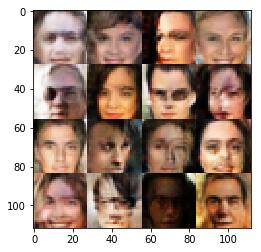

Timestamp 20170803-17-11-45.919 -  Epoch 1/1 -  Step 11310 -  D Loss: 0.5639 - G Loss: 2.2348
Timestamp 20170803-17-11-52.848 -  Epoch 1/1 -  Step 11320 -  D Loss: 0.7486 - G Loss: 1.3163
Timestamp 20170803-17-11-59.711 -  Epoch 1/1 -  Step 11330 -  D Loss: 0.9675 - G Loss: 1.0572
Timestamp 20170803-17-12-06.879 -  Epoch 1/1 -  Step 11340 -  D Loss: 1.1506 - G Loss: 1.3926
Timestamp 20170803-17-12-13.963 -  Epoch 1/1 -  Step 11350 -  D Loss: 0.7153 - G Loss: 1.8699
Timestamp 20170803-17-12-21.198 -  Epoch 1/1 -  Step 11360 -  D Loss: 0.9391 - G Loss: 2.6417
Timestamp 20170803-17-12-28.082 -  Epoch 1/1 -  Step 11370 -  D Loss: 1.2284 - G Loss: 0.8418
Timestamp 20170803-17-12-35.008 -  Epoch 1/1 -  Step 11380 -  D Loss: 0.9020 - G Loss: 1.3401
Timestamp 20170803-17-12-41.931 -  Epoch 1/1 -  Step 11390 -  D Loss: 0.6733 - G Loss: 1.1895
Timestamp 20170803-17-12-49.032 -  Epoch 1/1 -  Step 11400 -  D Loss: 0.7819 - G Loss: 1.5488


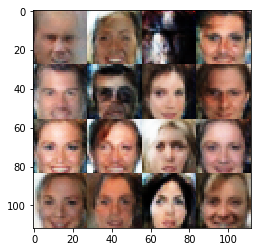

Timestamp 20170803-17-12-56.714 -  Epoch 1/1 -  Step 11410 -  D Loss: 0.9098 - G Loss: 1.6987
Timestamp 20170803-17-13-03.524 -  Epoch 1/1 -  Step 11420 -  D Loss: 0.9782 - G Loss: 1.1584
Timestamp 20170803-17-13-10.491 -  Epoch 1/1 -  Step 11430 -  D Loss: 0.9482 - G Loss: 1.1541
Timestamp 20170803-17-13-17.852 -  Epoch 1/1 -  Step 11440 -  D Loss: 0.8458 - G Loss: 1.1270
Timestamp 20170803-17-13-25.112 -  Epoch 1/1 -  Step 11450 -  D Loss: 0.6323 - G Loss: 1.8913
Timestamp 20170803-17-13-32.332 -  Epoch 1/1 -  Step 11460 -  D Loss: 0.7970 - G Loss: 1.8800
Timestamp 20170803-17-13-39.603 -  Epoch 1/1 -  Step 11470 -  D Loss: 0.6453 - G Loss: 2.2156
Timestamp 20170803-17-13-46.673 -  Epoch 1/1 -  Step 11480 -  D Loss: 1.5248 - G Loss: 0.4969
Timestamp 20170803-17-13-53.898 -  Epoch 1/1 -  Step 11490 -  D Loss: 0.8138 - G Loss: 1.4315
Timestamp 20170803-17-14-00.915 -  Epoch 1/1 -  Step 11500 -  D Loss: 0.8960 - G Loss: 0.9161


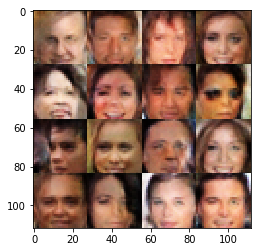

Timestamp 20170803-17-14-08.548 -  Epoch 1/1 -  Step 11510 -  D Loss: 0.6855 - G Loss: 1.9254
Timestamp 20170803-17-14-15.403 -  Epoch 1/1 -  Step 11520 -  D Loss: 0.9458 - G Loss: 1.0679
Timestamp 20170803-17-14-22.700 -  Epoch 1/1 -  Step 11530 -  D Loss: 0.9372 - G Loss: 1.2039
Timestamp 20170803-17-14-29.648 -  Epoch 1/1 -  Step 11540 -  D Loss: 1.6164 - G Loss: 0.5470
Timestamp 20170803-17-14-36.570 -  Epoch 1/1 -  Step 11550 -  D Loss: 0.9925 - G Loss: 1.1655
Timestamp 20170803-17-14-43.464 -  Epoch 1/1 -  Step 11560 -  D Loss: 0.8180 - G Loss: 1.9658
Timestamp 20170803-17-14-50.301 -  Epoch 1/1 -  Step 11570 -  D Loss: 0.6930 - G Loss: 1.6575
Timestamp 20170803-17-14-57.231 -  Epoch 1/1 -  Step 11580 -  D Loss: 1.1384 - G Loss: 0.8884
Timestamp 20170803-17-15-04.095 -  Epoch 1/1 -  Step 11590 -  D Loss: 0.7322 - G Loss: 1.9531
Timestamp 20170803-17-15-10.976 -  Epoch 1/1 -  Step 11600 -  D Loss: 0.9571 - G Loss: 1.6523


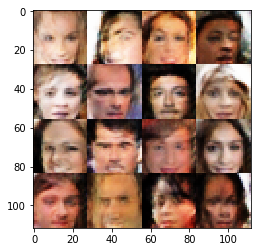

Timestamp 20170803-17-15-18.771 -  Epoch 1/1 -  Step 11610 -  D Loss: 0.9182 - G Loss: 1.2703
Timestamp 20170803-17-15-25.796 -  Epoch 1/1 -  Step 11620 -  D Loss: 1.1961 - G Loss: 0.5772
Timestamp 20170803-17-15-32.887 -  Epoch 1/1 -  Step 11630 -  D Loss: 1.0756 - G Loss: 0.7401
Timestamp 20170803-17-15-39.748 -  Epoch 1/1 -  Step 11640 -  D Loss: 0.9170 - G Loss: 1.8329
Timestamp 20170803-17-15-46.579 -  Epoch 1/1 -  Step 11650 -  D Loss: 0.7325 - G Loss: 1.0316
Timestamp 20170803-17-15-54.169 -  Epoch 1/1 -  Step 11660 -  D Loss: 0.8226 - G Loss: 1.3399
Timestamp 20170803-17-16-01.194 -  Epoch 1/1 -  Step 11670 -  D Loss: 0.5731 - G Loss: 3.3580
Timestamp 20170803-17-16-08.209 -  Epoch 1/1 -  Step 11680 -  D Loss: 0.7211 - G Loss: 1.7922
Timestamp 20170803-17-16-15.161 -  Epoch 1/1 -  Step 11690 -  D Loss: 0.8173 - G Loss: 1.1007
Timestamp 20170803-17-16-22.087 -  Epoch 1/1 -  Step 11700 -  D Loss: 0.9920 - G Loss: 2.5417


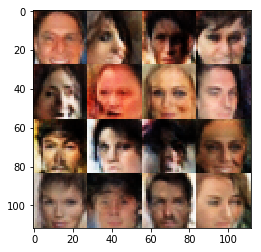

Timestamp 20170803-17-16-29.899 -  Epoch 1/1 -  Step 11710 -  D Loss: 0.7707 - G Loss: 1.4608
Timestamp 20170803-17-16-36.866 -  Epoch 1/1 -  Step 11720 -  D Loss: 0.9026 - G Loss: 1.5754
Timestamp 20170803-17-16-43.711 -  Epoch 1/1 -  Step 11730 -  D Loss: 1.1646 - G Loss: 0.6925
Timestamp 20170803-17-16-50.785 -  Epoch 1/1 -  Step 11740 -  D Loss: 0.8281 - G Loss: 1.1242
Timestamp 20170803-17-16-57.699 -  Epoch 1/1 -  Step 11750 -  D Loss: 0.7995 - G Loss: 1.3991
Timestamp 20170803-17-17-04.686 -  Epoch 1/1 -  Step 11760 -  D Loss: 0.7139 - G Loss: 1.0956
Timestamp 20170803-17-17-11.485 -  Epoch 1/1 -  Step 11770 -  D Loss: 1.1053 - G Loss: 0.5318
Timestamp 20170803-17-17-18.457 -  Epoch 1/1 -  Step 11780 -  D Loss: 0.6935 - G Loss: 1.8856
Timestamp 20170803-17-17-25.320 -  Epoch 1/1 -  Step 11790 -  D Loss: 0.7614 - G Loss: 2.3416
Timestamp 20170803-17-17-32.198 -  Epoch 1/1 -  Step 11800 -  D Loss: 0.7069 - G Loss: 1.5463


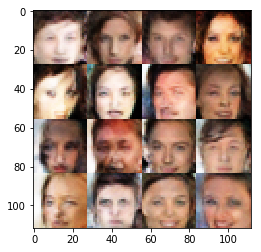

Timestamp 20170803-17-17-40.548 -  Epoch 1/1 -  Step 11810 -  D Loss: 0.7429 - G Loss: 1.9298
Timestamp 20170803-17-17-47.454 -  Epoch 1/1 -  Step 11820 -  D Loss: 0.8447 - G Loss: 1.4307
Timestamp 20170803-17-17-54.497 -  Epoch 1/1 -  Step 11830 -  D Loss: 0.8412 - G Loss: 1.4770
Timestamp 20170803-17-18-01.523 -  Epoch 1/1 -  Step 11840 -  D Loss: 0.9095 - G Loss: 0.7302
Timestamp 20170803-17-18-08.366 -  Epoch 1/1 -  Step 11850 -  D Loss: 1.2905 - G Loss: 1.7415
Timestamp 20170803-17-18-15.405 -  Epoch 1/1 -  Step 11860 -  D Loss: 0.5699 - G Loss: 1.8923
Timestamp 20170803-17-18-22.415 -  Epoch 1/1 -  Step 11870 -  D Loss: 0.6261 - G Loss: 2.0801
Timestamp 20170803-17-18-29.277 -  Epoch 1/1 -  Step 11880 -  D Loss: 1.1281 - G Loss: 0.9231
Timestamp 20170803-17-18-36.214 -  Epoch 1/1 -  Step 11890 -  D Loss: 1.0402 - G Loss: 1.2542
Timestamp 20170803-17-18-43.037 -  Epoch 1/1 -  Step 11900 -  D Loss: 0.9349 - G Loss: 1.5394


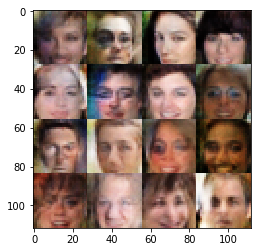

Timestamp 20170803-17-18-50.700 -  Epoch 1/1 -  Step 11910 -  D Loss: 0.9183 - G Loss: 1.2183
Timestamp 20170803-17-18-57.605 -  Epoch 1/1 -  Step 11920 -  D Loss: 0.6817 - G Loss: 1.8299
Timestamp 20170803-17-19-04.581 -  Epoch 1/1 -  Step 11930 -  D Loss: 0.9074 - G Loss: 1.8103
Timestamp 20170803-17-19-11.730 -  Epoch 1/1 -  Step 11940 -  D Loss: 0.7444 - G Loss: 1.5981
Timestamp 20170803-17-19-18.775 -  Epoch 1/1 -  Step 11950 -  D Loss: 0.7045 - G Loss: 2.3439
Timestamp 20170803-17-19-25.763 -  Epoch 1/1 -  Step 11960 -  D Loss: 0.9213 - G Loss: 0.9768
Timestamp 20170803-17-19-32.663 -  Epoch 1/1 -  Step 11970 -  D Loss: 1.2715 - G Loss: 0.6238
Timestamp 20170803-17-19-39.530 -  Epoch 1/1 -  Step 11980 -  D Loss: 1.3120 - G Loss: 0.9819
Timestamp 20170803-17-19-46.428 -  Epoch 1/1 -  Step 11990 -  D Loss: 0.6937 - G Loss: 1.9841
Timestamp 20170803-17-19-53.603 -  Epoch 1/1 -  Step 12000 -  D Loss: 0.7618 - G Loss: 1.9299


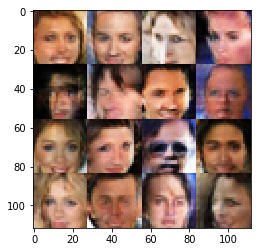

Timestamp 20170803-17-20-01.210 -  Epoch 1/1 -  Step 12010 -  D Loss: 1.1282 - G Loss: 1.1324
Timestamp 20170803-17-20-08.141 -  Epoch 1/1 -  Step 12020 -  D Loss: 1.2291 - G Loss: 1.1103
Timestamp 20170803-17-20-15.172 -  Epoch 1/1 -  Step 12030 -  D Loss: 1.0367 - G Loss: 0.8940
Timestamp 20170803-17-20-22.179 -  Epoch 1/1 -  Step 12040 -  D Loss: 0.7577 - G Loss: 1.5139
Timestamp 20170803-17-20-29.214 -  Epoch 1/1 -  Step 12050 -  D Loss: 0.6550 - G Loss: 1.6391
Timestamp 20170803-17-20-36.215 -  Epoch 1/1 -  Step 12060 -  D Loss: 0.6697 - G Loss: 1.3437
Timestamp 20170803-17-20-43.189 -  Epoch 1/1 -  Step 12070 -  D Loss: 0.7218 - G Loss: 1.3844
Timestamp 20170803-17-20-50.211 -  Epoch 1/1 -  Step 12080 -  D Loss: 1.4953 - G Loss: 0.5422
Timestamp 20170803-17-20-57.112 -  Epoch 1/1 -  Step 12090 -  D Loss: 0.7359 - G Loss: 1.9290
Timestamp 20170803-17-21-04.035 -  Epoch 1/1 -  Step 12100 -  D Loss: 0.8513 - G Loss: 1.3079


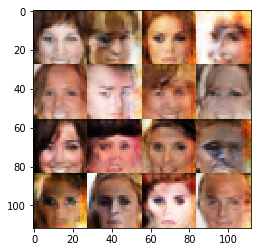

Timestamp 20170803-17-21-11.755 -  Epoch 1/1 -  Step 12110 -  D Loss: 0.5686 - G Loss: 1.3227
Timestamp 20170803-17-21-18.623 -  Epoch 1/1 -  Step 12120 -  D Loss: 0.8124 - G Loss: 2.0496
Timestamp 20170803-17-21-25.495 -  Epoch 1/1 -  Step 12130 -  D Loss: 0.8616 - G Loss: 0.8590
Timestamp 20170803-17-21-32.353 -  Epoch 1/1 -  Step 12140 -  D Loss: 0.7505 - G Loss: 2.1815
Timestamp 20170803-17-21-39.188 -  Epoch 1/1 -  Step 12150 -  D Loss: 1.2519 - G Loss: 1.3999
Timestamp 20170803-17-21-46.235 -  Epoch 1/1 -  Step 12160 -  D Loss: 0.8983 - G Loss: 1.7329
Timestamp 20170803-17-21-53.344 -  Epoch 1/1 -  Step 12170 -  D Loss: 0.9496 - G Loss: 1.1179
Timestamp 20170803-17-22-00.240 -  Epoch 1/1 -  Step 12180 -  D Loss: 0.7524 - G Loss: 1.3349
Timestamp 20170803-17-22-07.340 -  Epoch 1/1 -  Step 12190 -  D Loss: 1.2842 - G Loss: 0.9375
Timestamp 20170803-17-22-14.288 -  Epoch 1/1 -  Step 12200 -  D Loss: 1.2159 - G Loss: 0.7485


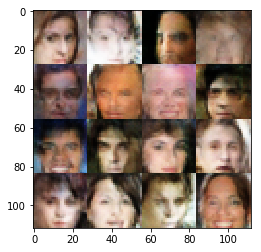

Timestamp 20170803-17-22-21.957 -  Epoch 1/1 -  Step 12210 -  D Loss: 0.7345 - G Loss: 1.9031
Timestamp 20170803-17-22-28.884 -  Epoch 1/1 -  Step 12220 -  D Loss: 0.9250 - G Loss: 1.3136
Timestamp 20170803-17-22-35.853 -  Epoch 1/1 -  Step 12230 -  D Loss: 1.2778 - G Loss: 0.7425
Timestamp 20170803-17-22-42.797 -  Epoch 1/1 -  Step 12240 -  D Loss: 1.0313 - G Loss: 0.9258
Timestamp 20170803-17-22-49.712 -  Epoch 1/1 -  Step 12250 -  D Loss: 0.8992 - G Loss: 1.2651
Timestamp 20170803-17-22-56.737 -  Epoch 1/1 -  Step 12260 -  D Loss: 0.8560 - G Loss: 2.0087
Timestamp 20170803-17-23-03.639 -  Epoch 1/1 -  Step 12270 -  D Loss: 0.7318 - G Loss: 1.8751
Timestamp 20170803-17-23-10.633 -  Epoch 1/1 -  Step 12280 -  D Loss: 0.9033 - G Loss: 1.5080
Timestamp 20170803-17-23-17.694 -  Epoch 1/1 -  Step 12290 -  D Loss: 0.4964 - G Loss: 2.6952
Timestamp 20170803-17-23-24.643 -  Epoch 1/1 -  Step 12300 -  D Loss: 0.8710 - G Loss: 1.2280


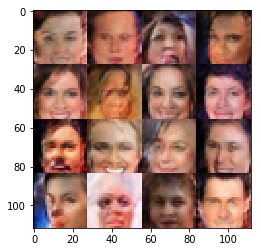

Timestamp 20170803-17-23-32.324 -  Epoch 1/1 -  Step 12310 -  D Loss: 0.8120 - G Loss: 2.2723
Timestamp 20170803-17-23-39.413 -  Epoch 1/1 -  Step 12320 -  D Loss: 0.7179 - G Loss: 1.3305
Timestamp 20170803-17-23-46.342 -  Epoch 1/1 -  Step 12330 -  D Loss: 1.2092 - G Loss: 0.9074
Timestamp 20170803-17-23-53.290 -  Epoch 1/1 -  Step 12340 -  D Loss: 0.8808 - G Loss: 1.1708
Timestamp 20170803-17-24-00.231 -  Epoch 1/1 -  Step 12350 -  D Loss: 1.2407 - G Loss: 0.8020
Timestamp 20170803-17-24-07.228 -  Epoch 1/1 -  Step 12360 -  D Loss: 0.8744 - G Loss: 2.1086
Timestamp 20170803-17-24-14.126 -  Epoch 1/1 -  Step 12370 -  D Loss: 0.6916 - G Loss: 1.8730
Timestamp 20170803-17-24-21.243 -  Epoch 1/1 -  Step 12380 -  D Loss: 0.9220 - G Loss: 1.2941
Timestamp 20170803-17-24-28.237 -  Epoch 1/1 -  Step 12390 -  D Loss: 0.6867 - G Loss: 1.8942
Timestamp 20170803-17-24-35.092 -  Epoch 1/1 -  Step 12400 -  D Loss: 0.7124 - G Loss: 1.4314


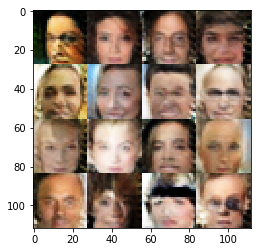

Timestamp 20170803-17-24-42.713 -  Epoch 1/1 -  Step 12410 -  D Loss: 0.7503 - G Loss: 1.8166
Timestamp 20170803-17-24-49.729 -  Epoch 1/1 -  Step 12420 -  D Loss: 0.6899 - G Loss: 1.2504
Timestamp 20170803-17-24-56.688 -  Epoch 1/1 -  Step 12430 -  D Loss: 0.6651 - G Loss: 1.7915
Timestamp 20170803-17-25-03.636 -  Epoch 1/1 -  Step 12440 -  D Loss: 1.1579 - G Loss: 1.1036
Timestamp 20170803-17-25-10.577 -  Epoch 1/1 -  Step 12450 -  D Loss: 0.8054 - G Loss: 2.0345
Timestamp 20170803-17-25-17.574 -  Epoch 1/1 -  Step 12460 -  D Loss: 0.9744 - G Loss: 1.0857
Timestamp 20170803-17-25-24.442 -  Epoch 1/1 -  Step 12470 -  D Loss: 1.0143 - G Loss: 1.2042
Timestamp 20170803-17-25-31.327 -  Epoch 1/1 -  Step 12480 -  D Loss: 0.8008 - G Loss: 1.7287
Timestamp 20170803-17-25-38.175 -  Epoch 1/1 -  Step 12490 -  D Loss: 0.6248 - G Loss: 2.3676
Timestamp 20170803-17-25-45.063 -  Epoch 1/1 -  Step 12500 -  D Loss: 0.7912 - G Loss: 1.7129


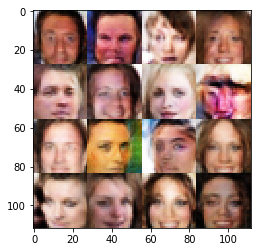

Timestamp 20170803-17-25-52.714 -  Epoch 1/1 -  Step 12510 -  D Loss: 0.8122 - G Loss: 1.4301
Timestamp 20170803-17-25-59.663 -  Epoch 1/1 -  Step 12520 -  D Loss: 0.9534 - G Loss: 0.9647
Timestamp 20170803-17-26-06.533 -  Epoch 1/1 -  Step 12530 -  D Loss: 0.8687 - G Loss: 1.4928
Timestamp 20170803-17-26-13.476 -  Epoch 1/1 -  Step 12540 -  D Loss: 0.7853 - G Loss: 1.3931
Timestamp 20170803-17-26-20.445 -  Epoch 1/1 -  Step 12550 -  D Loss: 0.8669 - G Loss: 1.2394
Timestamp 20170803-17-26-27.368 -  Epoch 1/1 -  Step 12560 -  D Loss: 0.6961 - G Loss: 1.4966
Timestamp 20170803-17-26-34.365 -  Epoch 1/1 -  Step 12570 -  D Loss: 0.8045 - G Loss: 2.0459
Timestamp 20170803-17-26-41.260 -  Epoch 1/1 -  Step 12580 -  D Loss: 0.7798 - G Loss: 1.7217
Timestamp 20170803-17-26-48.186 -  Epoch 1/1 -  Step 12590 -  D Loss: 0.7782 - G Loss: 1.4285
Timestamp 20170803-17-26-55.281 -  Epoch 1/1 -  Step 12600 -  D Loss: 0.9861 - G Loss: 1.0807


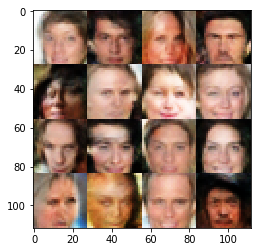

Timestamp 20170803-17-27-03.034 -  Epoch 1/1 -  Step 12610 -  D Loss: 0.7810 - G Loss: 1.4639
Timestamp 20170803-17-27-09.912 -  Epoch 1/1 -  Step 12620 -  D Loss: 0.7346 - G Loss: 2.5320
Timestamp 20170803-17-27-16.800 -  Epoch 1/1 -  Step 12630 -  D Loss: 0.9528 - G Loss: 1.0406
Timestamp 20170803-17-27-23.508 -  Epoch 1/1 -  Step 12640 -  D Loss: 0.8171 - G Loss: 0.7356
Timestamp 20170803-17-27-30.223 -  Epoch 1/1 -  Step 12650 -  D Loss: 0.7904 - G Loss: 0.9223
Timestamp 20170803-17-27-36.945 -  Epoch 1/1 -  Step 12660 -  D Loss: 0.7421 - G Loss: 1.8379
Timestamp 20170803-17-27-38.439 -  Epoch 1/1 -  Step 12662 -  D Loss: 0.6745 - G Loss: 2.1439


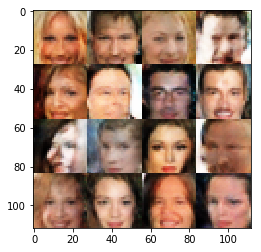

In [15]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.